## 1. Загрузка данных

In [245]:
import pandas as pd 
from IPython.display import display, Markdown, HTML
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import phik
from sklearn.pipeline import Pipeline
import numpy as np
import warnings
from phik.report import plot_correlation_matrix
import plotly.express as px
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import (accuracy_score, f1_score, roc_auc_score,
                             precision_score, recall_score, confusion_matrix,
                             PrecisionRecallDisplay, RocCurveDisplay)
from sklearn.utils.class_weight import compute_sample_weight
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.base import BaseEstimator, TransformerMixin
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score, make_scorer

warnings.filterwarnings("ignore", "DeprecationWarning")
warnings.filterwarnings("ignore", "UserWarning")
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=UserWarning, module='xgboost')
warnings.filterwarnings('ignore', category=UserWarning, message='X does not have valid feature names')
warnings.filterwarnings('ignore', category=UserWarning, message='Parameters: { "use_label_encoder" } are not used.')

In [246]:
df_train_zero = pd.read_csv('M1_DS - Startups (STD)/kaggle_startups_train_28062024.csv')
df_train = df_train_zero.copy()
df_test = pd.read_csv('M1_DS - Startups (STD)/kaggle_startups_test_28062024.csv')
df_example = pd.read_csv('M1_DS - Startups (STD)/kaggle_startups_sample_submit_28062024.csv')

In [247]:
def show_info(df: pd.DataFrame):
    display(df.head())
    display(df.info())
    display(df.describe().T)

In [248]:
show_info(df_train)

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
0,Lunchgate,Online Reservations|Restaurants,828626.0,operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,NaN
1,EarLens,Manufacturing|Medical|Medical Devices,42935019.0,operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,NaN
2,Reviva Pharmaceuticals,Biotechnology,35456381.0,operating,USA,CA,SF Bay Area,San Jose,3,2006-01-01,2012-08-20,2014-07-02,NaN
3,Sancilio and Company,Health Care,22250000.0,operating,NaN,NaN,NaN,NaN,3,2004-01-01,2011-09-01,2014-07-18,NaN
4,WireTough Cylinders,Manufacturing,NaN,operating,USA,VA,VA - Other,Bristol,1,2010-05-12,2012-02-01,2012-02-01,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               52515 non-null  object 
 1   category_list      50051 non-null  object 
 2   funding_total_usd  42447 non-null  float64
 3   status             52516 non-null  object 
 4   country_code       47014 non-null  object 
 5   state_code         45753 non-null  object 
 6   region             46157 non-null  object 
 7   city               46157 non-null  object 
 8   funding_rounds     52516 non-null  int64  
 9   founded_at         52516 non-null  object 
 10  first_funding_at   52516 non-null  object 
 11  last_funding_at    52516 non-null  object 
 12  closed_at          4917 non-null   object 
dtypes: float64(1), int64(1), object(11)
memory usage: 5.2+ MB


None

,count,mean,std,min,25%,50%,75%,max
funding_total_usd,42447.0,1.824748e+07,1.871173e+08,1.0,336027.5,2000000.0,10000000.0,3.007950e+10
funding_rounds,52516.0,1.740670e+00,1.374522e+00,1.0,1.0,1.0,2.0,1.900000e+01


In [249]:
show_info(df_test)

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime
0,Crystalsol,Clean Technology,2819200.0,NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717
2,COINPLUS,Finance,428257.0,LUX,3,Esch-sur-alzette,Esch-sur-alzette,2,2014-05-15,2014-09-18,1295
3,Imagine Communications,Software|Video|Video Streaming,34700000.0,USA,CA,San Diego,San Diego,4,2005-01-01,2010-04-20,4748
4,DNA13,Software,4530000.0,CAN,ON,Ottawa,Ottawa,1,2007-05-08,2007-05-08,6209


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               13125 non-null  object 
 1   category_list      12534 non-null  object 
 2   funding_total_usd  10547 non-null  float64
 3   country_code       11743 non-null  object 
 4   state_code         11430 non-null  object 
 5   region             11536 non-null  object 
 6   city               11538 non-null  object 
 7   funding_rounds     13125 non-null  int64  
 8   first_funding_at   13125 non-null  object 
 9   last_funding_at    13125 non-null  object 
 10  lifetime           13125 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 1.1+ MB


None

,count,mean,std,min,25%,50%,75%,max
funding_total_usd,10547.0,1.654910e+07,9.217283e+07,1.0,320000.0,2000000.0,10000000.0,4.715000e+09
funding_rounds,13125.0,1.714438e+00,1.318800e+00,1.0,1.0,1.0,2.0,1.500000e+01
lifetime,13125.0,3.097610e+03,2.128357e+03,52.0,1726.0,2526.0,3866.0,1.716700e+04


In [250]:
show_info(df_example)

,name,status
0,Crystalsol,closed
1,JBI Fish & Wings,operating
2,COINPLUS,closed
3,Imagine Communications,closed
4,DNA13,operating


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   name    13125 non-null  object
 1   status  13125 non-null  object
dtypes: object(2)
memory usage: 205.2+ KB


None

,count,unique,top,freq
name,13125,13125,Crystalsol,1
status,13125,2,operating,6635


In [251]:
def show_missing(df: pd.DataFrame):
    display(df.isna().mean() * 100 )

In [252]:
show_missing(df_train)

name                  0.001904
category_list         4.693808
funding_total_usd    19.173204
status                0.000000
country_code         10.476807
state_code           12.877980
region               12.108691
city                 12.108691
funding_rounds        0.000000
founded_at            0.000000
first_funding_at      0.000000
last_funding_at       0.000000
closed_at            90.637139
dtype: float64

In [253]:
show_missing(df_test)

name                  0.000000
category_list         4.502857
funding_total_usd    19.641905
country_code         10.529524
state_code           12.914286
region               12.106667
city                 12.091429
funding_rounds        0.000000
first_funding_at      0.000000
last_funding_at       0.000000
lifetime              0.000000
dtype: float64

In [254]:
df_train.shape

(52516, 13)

In [255]:
df_test.shape

(13125, 11)

### 1.1 Первичный обзор данных 

- Размерность тренировочного датасета: (52516, 13)
- Размерность тестового датасета: (13125, 11)
- В тренировочной и тестовой выборке имеются пропуски в данных, пропуски совпадают в колонках: `category_list`, `funding_total_usd`, `country_code`, `state_code`, `region`, `city`
- Колонки в которых нету пропусков в данных в тренировочной и тестовой выборках: `funding_rounds`, `first_funding_at`, `last_funding_at`
- Небходимо достроить колонку `lifetime`(Время жизни стартапа) для тренировочной выборки, текущей датой будет считаться маскимальная дата закрытия `close_at`

## 2. Предобработка данных

__Описание полей данных__

- name - Название стартапа
- category_list - Список категорий, к которым относится стартап
- funding_total_usd - Общая сумма финансирования в USD
- status - Статус стартапа (закрыт или действующий)
- country_code - Код страны
- state_code - Код штата
- region - Регион
- city - Город
- funding_rounds - Количество раундов финансирования
- founded_at - Дата основания
- first_funding_at - Дата первого раунда финансирования
- last_funding_at - Дата последнего раунда финансирования
- closed_at - Дата закрытия стартапа (если применимо)
- lifetime - Время существования стартапа в днях

In [256]:
def header(text, symbol="#", lenght=30):
    return f"{symbol * lenght}\n {text} \n {symbol * lenght}"

def check_nan_and_dup(data:pd.DataFrame, name:str): 
    display(Markdown(header(f"Анализ таблицы - {name}")))
    
    # Количество явных дубликатов 
    obvious_duplicates = data.duplicated().sum()
    display(Markdown(f"Количество явных дубликатов: **{obvious_duplicates}**"))
    
    # Количество пропусков 
    nan_count = int(data.isna().values.sum())
    display(Markdown(f"Количество Nan значений: **{nan_count}**"))

    # Проверка неявных дубликатов по колонкам 
    display(Markdown(header(f"Неявные дубликаты по колонкам", "*")))
    for col in data.columns:
        hidden_dup = data[col].duplicated().sum()
        display(Markdown(f"Колонка: **`{col}`**\n Количество дубликатов: **{hidden_dup}**"))


In [257]:
check_nan_and_dup(df_train, 'df_train')

##############################
 Анализ таблицы - df_train 
 ##############################

Количество явных дубликатов: **0**

Количество Nan значений: **85117**

******************************
 Неявные дубликаты по колонкам 
 ******************************

Колонка: **`name`**
 Количество дубликатов: **0**

Колонка: **`category_list`**
 Количество дубликатов: **30410**

Колонка: **`funding_total_usd`**
 Количество дубликатов: **36964**

Колонка: **`status`**
 Количество дубликатов: **52514**

Колонка: **`country_code`**
 Количество дубликатов: **52381**

Колонка: **`state_code`**
 Количество дубликатов: **52215**

Колонка: **`region`**
 Количество дубликатов: **51479**

Колонка: **`city`**
 Количество дубликатов: **48038**

Колонка: **`funding_rounds`**
 Количество дубликатов: **52497**

Колонка: **`founded_at`**
 Количество дубликатов: **47114**

Колонка: **`first_funding_at`**
 Количество дубликатов: **47913**

Колонка: **`last_funding_at`**
 Количество дубликатов: **48211**

Колонка: **`closed_at`**
 Количество дубликатов: **49507**

### 2.1 Обработка колонки `category_list` 

In [258]:
pd.Series(df_train.category_list.sort_values().unique())

0                                                       3D
1                                              3D Printing
2                                3D Printing|3D Technology
3        3D Printing|3D Technology|Android|Artificial I...
4        3D Printing|3D Technology|Android|Games|iOS|Mo...
                               ...                        
22101                                              mHealth
22102                                       mHealth|Mobile
22103                                     mHealth|Software
22104                        mHealth|Software|Therapeutics
22105                                                  NaN
Length: 22106, dtype: object

In [259]:
df_train[df_train['category_list'].isna() == True]

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
12,Iberic Premium,NaN,107239.0,closed,NaN,NaN,NaN,NaN,1,2013-07-26,2014-06-01,2014-06-01,2015-07-10
16,Salesjob,NaN,NaN,closed,NaN,NaN,NaN,NaN,1,2013-01-01,2013-10-22,2013-10-22,2015-08-11
24,Savasti,NaN,NaN,closed,NaN,NaN,NaN,NaN,1,2015-01-01,2015-01-01,2015-01-01,2016-11-03
26,The Center from Health Promotion,NaN,10000000.0,operating,NaN,NaN,NaN,NaN,1,2002-04-21,2003-11-12,2003-11-12,NaN
64,Seamless Logistics,NaN,NaN,operating,NaN,NaN,NaN,NaN,1,2009-02-22,2011-02-01,2011-02-01,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
52404,Beach Bum,NaN,NaN,closed,NaN,NaN,NaN,NaN,1,2014-08-13,2015-05-18,2015-05-18,2017-03-30
52419,"iSend, LLC",NaN,NaN,closed,NaN,NaN,NaN,NaN,1,2007-01-01,2008-05-28,2008-05-28,2009-10-03
52467,Thermal Nomad,NaN,NaN,operating,USA,TX,Houston,Houston,1,2014-04-20,2014-05-28,2014-05-28,NaN
52473,Vision Software PTY,NaN,15000000.0,operating,NaN,NaN,NaN,NaN,1,1998-01-10,1999-11-02,1999-11-02,NaN


In [260]:
df_train['category_list'].isna().mean() * 100

4.693807601492878

In [261]:
df_train.category_list = df_train.category_list.fillna('unknown')

### 2.2 Обработка колонки `funding_total_usd`

In [262]:
df_train.funding_total_usd.isna().mean() * 100

19.173204356767464

In [263]:
df_train[df_train.funding_total_usd.isna() == True].status.value_counts()

status
operating    9044
closed       1025
Name: count, dtype: int64

In [264]:
df_train.status.value_counts()

status
operating    47599
closed        4917
Name: count, dtype: int64

In [265]:
df_train.funding_total_usd.isna().mean() * 100

19.173204356767464

In [266]:
# df_train.funding_total_usd = df_train.funding_total_usd.fillna(0)

#### 2.2.1 funding_total_usd будет заполнен позже на этапе исследовательского анализа

### 2.3 Обработка колонки `country_code`

In [267]:
df_train.country_code.isna().mean() * 100 

10.476807068322035

In [268]:
df_train[(df_train.country_code.isna() == True) & (df_train.state_code.isna() == False)]

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at


In [269]:
df_train.country_code.unique()

array(['CHE', 'USA', nan, 'GBR', 'RUS', 'ESP', 'FRA', 'SWE', 'IND', 'KOR',
       'AUS', 'TWN', 'CHN', 'HUN', 'CAN', 'FIN', 'BRA', 'EGY', 'PRT',
       'ISR', 'CHL', 'SVK', 'NLD', 'ARG', 'ARE', 'JPN', 'IRL', 'DEU',
       'LBN', 'EST', 'IDN', 'BEL', 'MEX', 'DNK', 'ITA', 'GRC', 'ROM',
       'TUR', 'SGP', 'SAU', 'MYS', 'NGA', 'QAT', 'VNM', 'BGR', 'GHA',
       'UGA', 'JOR', 'AUT', 'PAK', 'NZL', 'HKG', 'ZAF', 'LVA', 'NOR',
       'HRV', 'VEN', 'PER', 'LUX', 'SVN', 'POL', 'PHL', 'NIC', 'CZE',
       'ISL', 'PAN', 'URY', 'BGD', 'MCO', 'GTM', 'THA', 'TTO', 'UKR',
       'KEN', 'CRI', 'DZA', 'LTU', 'CYM', 'MUS', 'BLR', 'SLV', 'COL',
       'MLT', 'PSE', 'BLZ', 'CYP', 'MMR', 'MKD', 'KHM', 'GIB', 'SRB',
       'DOM', 'BWA', 'BLM', 'PRY', 'BMU', 'TAN', 'LIE', 'GRD', 'UZB',
       'GEO', 'SEN', 'ALB', 'ECU', 'MOZ', 'LKA', 'LAO', 'TUN', 'HND',
       'ZWE', 'BAH', 'MDA', 'MAF', 'BHR', 'AZE', 'MAR', 'KWT', 'IRN',
       'GGY', 'KNA', 'PRI', 'OMN', 'KAZ', 'JAM', 'NPL', 'ARM', 'TGO',
       'RWA', '

In [270]:
df_train.country_code = df_train.country_code.fillna('unknown')

### 2.4 Обработка колонки `state_code`

In [271]:
df_train.isna().mean() * 100

name                  0.001904
category_list         0.000000
funding_total_usd    19.173204
status                0.000000
country_code          0.000000
state_code           12.877980
region               12.108691
city                 12.108691
funding_rounds        0.000000
founded_at            0.000000
first_funding_at      0.000000
last_funding_at       0.000000
closed_at            90.637139
dtype: float64

In [272]:
df_train.state_code.unique()

array(['25', 'CA', nan, 'VA', 'NJ', 'TX', 'OR', 'FL', 'WA', 'NY', 'C7',
       'AZ', '91', 'GA', 'MA', 'PA', 'MI', '56', 'MN', 'A8', 'DE', '26',
       'Q5', '7', 'RI', '11', 'C5', 'CO', '3', '23', '1', 'ON', 'IL',
       'OH', 'K2', '2', '14', '30', 'H9', 'AL', '29', '6', 'NC', '5',
       '12', '22', 'MD', '48', 'ND', '40', 'K4', 'VT', '16', '4', 'UT',
       'IN', '8', '9', '18', 'CT', '13', 'NV', '10', 'B8', '27', '17',
       'IA', 'WI', 'L9', 'NM', 'B7', 'MO', 'BC', '21', 'F7', 'ME', 'NH',
       '35', 'NS', 'C1', 'C3', 'SC', '20', 'TN', 'A6', '51', 'I7', 'LA',
       'KS', '42', 'N7', 'U8', 'I2', 'AR', '19', 'NE', '41', 'QC', 'AB',
       '37', '15', '97', 'V2', 'D2', 'DC', 'A7', 'C9', 'F8', 'Y2', 'B9',
       'J7', 'M9', 'G2', 'H3', 'ID', 'NB', '28', 'V8', '34', 'B5', 'F2',
       'A9', 'Z7', '53', 'H8', 'MT', 'MB', 'KY', '61', '60', 'B4', 'H7',
       '82', 'A2', 'C8', 'L3', 'B3', 'D9', 'M3', 'MS', '31', '33', '52',
       'HI', 'AK', '78', '72', 'Q4', 'Y4', 'WY', '32', 'E6', 

In [273]:
df_train.state_code = df_train.state_code.fillna('unknown')

### 2.5 Обработка колонки `region`

In [274]:
pd.Series(df_train.region.unique()).sort_values()

804      A Coruna
432    AB - Other
858    AK - Other
574    AL - Other
171    AR - Other
          ...    
633        Zhuhai
0          Zurich
107          Ã‡an
801         Ã‰vry
2             NaN
Length: 1037, dtype: object

In [275]:
df_train.region = df_train.region.fillna('unknown')

### 2.6 Обработка колонки `city`

In [276]:
df_train.city = df_train.city.fillna('unknown')

### 2.7 Обработка колонки `name`

In [277]:
df_train[df_train.name.isna() == True]

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
3291,NaN,Startups,25000.0,closed,USA,OR,"Portland, Oregon",Portland,1,2011-10-01,2012-03-01,2012-03-01,2013-06-03


In [278]:
df_train['name'] = df_train.name.fillna('unknown') 

In [279]:
df_train.isna().mean() * 100

name                  0.000000
category_list         0.000000
funding_total_usd    19.173204
status                0.000000
country_code          0.000000
state_code            0.000000
region                0.000000
city                  0.000000
funding_rounds        0.000000
founded_at            0.000000
first_funding_at      0.000000
last_funding_at       0.000000
closed_at            90.637139
dtype: float64

### 2.8 Обработка колонки `closed_at`

In [280]:
max_date = df_train[df_train.status == 'closed'].closed_at.max()
max_date

'2017-10-21'

In [281]:
df_train[df_train.closed_at.isna() == False].closed_at.sort_values()[-100:]

17387    2017-05-13
42456    2017-05-14
25490    2017-05-14
5759     2017-05-14
23617    2017-05-15
            ...    
39389    2017-09-12
30811    2017-09-21
23826    2017-09-22
11993    2017-10-11
25065    2017-10-21
Name: closed_at, Length: 100, dtype: object

In [282]:
# df_train['closed_at'] = df_train.closed_at.fillna(max_date) 
df_train['closed_at'] = df_train.closed_at.fillna('2017-12-01') 

## 3 Исследовательский анализ и подготовка данных

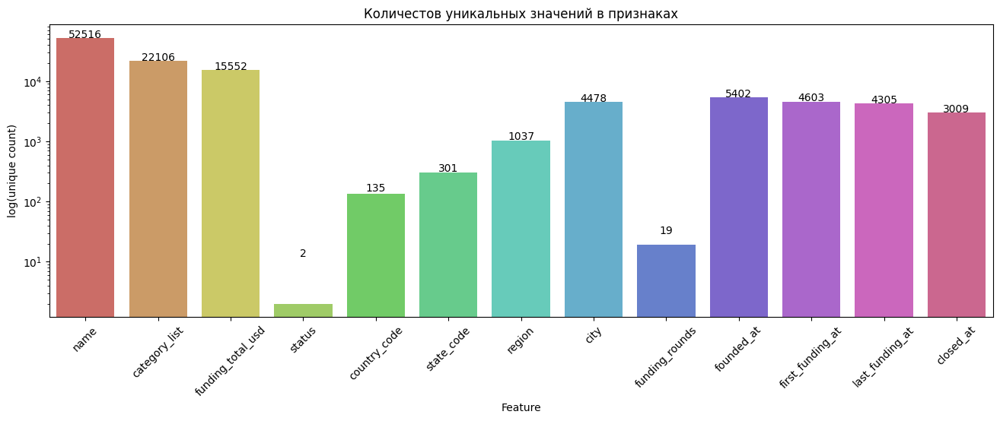

In [283]:
def plot_unique(df):
    plt.figure(figsize=(16, 5))
    
    cols = df.columns
    uniques = [len(df[col].unique()) for col in cols]
    
    ax = sns.barplot(x=cols, y=uniques, palette='hls', log=True)
    ax.set(xlabel='Feature', ylabel='log(unique count)', title='Количестов уникальных значений в признаках')
    
    
    for p, uniq in zip(ax.patches, uniques):
        ax.text(p.get_x() + p.get_width()/2.,
                uniq + 10,
                uniq,
                ha="center") 
    
    ax.set_xticklabels(ax.get_xticklabels(),  rotation=45);

plot_unique(df_train)

In [284]:
def compare_hist_train_test(train:pd.DataFrame, test:pd.DataFrame, col:str, title:str, xlabel:str, ylabel:str, sup_title:str='Сравение гистограмм'):
    # Создаем два подграфика
    fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharex=True, sharey=True)
    
    # Гистограмма для тренировочных данных
    sns.histplot(
        data=train,
        x=col,
        ax=axes[0],
        color='#1f77b4',  # Синий цвет для train
        kde=True,
        bins=30,
        alpha=0.7
    )
    axes[0].set_title(f'Train Data: {title}', fontsize=12)
    axes[0].set_xlabel(f'{xlabel}', fontsize=10)
    axes[0].set_ylabel(f'{ylabel}', fontsize=10)
    axes[0].grid(alpha=0.3)
    
    # Гистограмма для тестовых данных
    sns.histplot(
        data=test,
        x=col,
        ax=axes[1],
        color='#ff7f0e',  # Оранжевый цвет для test
        kde=True,
        bins=30,
        alpha=0.7
    )
    axes[1].set_title(f'Test Data: {title}', fontsize=12)
    axes[1].set_xlabel(f'{xlabel}', fontsize=10)
    axes[1].grid(alpha=0.3)
    
    # Общие настройки
    plt.suptitle(f'{sup_title}', fontsize=14, y=1.02)
    plt.tight_layout()
    
    # установка общего лимита для осей 
    max_value = max(train[col].max(), test[col].max())
    plt.setp(axes, xlim=(0, max_value * 0.95))  # Игнорировать 5% выбросов
    
    plt.show()

In [285]:
def plot_jilter(df:pd.DataFrame, col:str, title:str):
    df_jil = df.copy()
    df_jil["jitter"] = np.random.normal(0, 0.05, size=len(df))  # Случайный шум
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
    x="jitter", 
    y=col, 
    hue="status", 
    data=df_jil, 
    palette="Set1", 
    alpha=0.6,
    s=50  # Размер точек
    )
    plt.xticks([])  # Скрываем ось X (статус)
    plt.xlabel("Статус (jittered)")
    plt.ylabel(f'{title}')
    plt.title(f"Scatter plot {title} с jitter по статусу")
    plt.legend(title="Статус")
    plt.show()

In [286]:
def plot_hist_comp(df:pd.DataFrame, col:str, title:str, xlabel:str):
    plt.figure(figsize=(10, 6))
    sns.histplot(
        data=df, 
        x=col, 
        hue="status", 
        element="step", 
        stat="density", 
        common_norm=False, 
        palette="viridis",
        kde=True
    )
    plt.title(f"{title}")
    plt.xlabel(f"{xlabel}")
    plt.ylabel("Плотность")
    plt.show()

In [287]:
def plot_violit(df:pd.DataFrame, col:str, title:str, ylabel:str):
    plt.figure(figsize=(10, 6))
    sns.violinplot(x="status", y=col, data=df, palette="viridis", inner="quartile")
    plt.title(f"{title}")
    plt.xlabel("Статус")
    plt.ylabel(f"{ylabel}")
    plt.show()

### 3.1 Анализ соотношения дат и их влияния на `status`, колонки `funding_rounds`, `first_funding_at`, `last_funding_at`

- founded_at - Дата основания
- first_funding_at - Дата первого раунда финансирования
- last_funding_at - Дата последнего раунда финансирования


In [288]:
def plot_phik_matrix(df:pd.DataFrame, title:str, interval_cols:list=[]):
    df_phik = df.copy()
    df_phik_corr = df_phik.phik_matrix(interval_cols=interval_cols)
    plt.figure(figsize=(18, 14))
    sns.heatmap(df_phik_corr, annot=True, cmap='coolwarm')
    plt.title(title)
    plt.show()
    return df_phik_corr

Создание класса для предобработки даты времени

In [289]:
class FeatureGen: 
    """Класс для генерации временных фич из датасета стартапов."""
    
    def __init__(self, df: pd.DataFrame): 
        """Инициализация объекта с исходными данными.
        
        Args:
            df: Исходный DataFrame с данными о компаниях
        """
        self.raw_df = df.copy() # Сохраняем исходные данные без изменений
        self.df_date = pd.DataFrame() # Пустой DF для временных фич
        self.dates_train_columns = ['first_funding_at', 'last_funding_at'] # Колонки с датами финансирования
        self.cols_for_lifetime = ['founded_at', 'closed_at']  # Колонки для расчета времени жизни компании
        self.keys_date_cat = ['year', 'month', 'day'] # Компоненты дат для извлечения

    def to_datetime_train(self): 
        """Конвертация колонок с датами в datetime для обучающего набора."""
        for col in self.dates_train_columns: 
            self.raw_df[col] = pd.to_datetime(self.raw_df[col]).copy()
            
        for col in self.cols_for_lifetime: 
            self.raw_df[col] = pd.to_datetime(self.raw_df[col]).copy()
            
    def to_datetime_test(self): 
        """Конвертация колонок с датами в datetime для тестового набора (без closed_at)."""
        for col in self.dates_train_columns: 
            self.raw_df[col] = pd.to_datetime(self.raw_df[col]).copy()

    def create_cols_lifetimes_cat(self): 
        """Создание категориальных признаков для временных интервалов."""
        # Бинаризация временных интервалов
        lifetime_bins = [
            0,     # 0 квартал
            90,    # 3 месяца
            180,   # 6 месяцев
            270,   # 9 месяцев
            365,   # 1 год
            455,   # 1 год 3 мес (365 + 90)
            545,   # 1 год 6 мес
            635,   # 1 год 9 мес
            730,   # 2 года
            820,   # 2 года 3 мес
            910,   # 2 года 6 мес
            1000,  # 2 года 9 мес
            1095,  # 3 года
            1825,  # 5 лет (3 года + 2 года)
            3650,  # 10 лет
            np.inf
        ]
        
        # Метки категорий (14 интервалов → 15 границ → 14 меток)
        lifetime_labels = [
            # Первый год
            "0-3_months", 
            "3-6_months", 
            "6-9_months", 
            "9-12_months",
            
            # Второй год
            "1-1.25_years", 
            "1.25-1.5_years", 
            "1.5-1.75_years", 
            "1.75-2_years",
            
            # Третий год
            "2-2.25_years", 
            "2.25-2.5_years", 
            "2.5-2.75_years", 
            "2.75-3_years",
            
            # Последующие периоды
            "3-5_years", 
            "5-10_years", 
            "10+_years"
        ]
        self.df_date['lifetime_category'] = pd.cut(self.df_date['lifetime'],
            bins=lifetime_bins,
            labels=lifetime_labels,
            right=False  
        )

        self.df_date['days_first_invest_category'] = pd.cut(self.df_date['days_first_invest'],
            bins=lifetime_bins,
            labels=lifetime_labels,
            right=False
        )
        
        self.df_date['days_last_invest_category'] = pd.cut(self.df_date['days_last_invest'],
            bins=lifetime_bins,
            labels=lifetime_labels,
            right=False
        )
        # df['year'].astype(int) + (df['quarter'].astype(int) - 1) / 4
        self.df_date['quat_f_fund'] = self.df_date.lifetime - (((self.raw_df['first_funding_at'].dt.year.astype(int) * 365) / 2018) + (self.raw_df['first_funding_at'].dt.quarter.astype(int)  * 90)) 
        self.df_date['quat_l_fund'] = self.df_date.lifetime - (((self.raw_df['last_funding_at'].dt.year.astype(int) * 365) / 2018) +  (self.raw_df['last_funding_at'].dt.quarter.astype(int) * 90))
        # self.df_date['life_quat_l_fund'] = self.raw_df['last_funding_at'].dt.year.astype(int) -  (self.raw_df['last_funding_at'].dt.quarter.astype(int) / 4)
        #self.raw_df['last_funding_at'].dt.strftime('%Y Q%q')
            
    def train_date_create_cols(self, get_df=False): 
        """Генерация фич для обучающих данных."""
        self.to_datetime_train()

        # Базовые временные фичи
        self.df_date['status'] = self.raw_df.status.copy()
        self.df_date['lifetime'] = (self.raw_df['closed_at'] - self.raw_df['founded_at']).dt.days
        self.df_date['days_first_invest'] = (self.raw_df['closed_at'] - self.raw_df['first_funding_at']).dt.days
        self.df_date['days_last_invest'] = (self.raw_df['closed_at'] - self.raw_df['last_funding_at']).dt.days
        
        # Извлечение компонентов дат
        for col in self.dates_train_columns: 
            self.df_date[col + '_year'] = self.raw_df[col].dt.year
            self.df_date[col + '_weekday'] = self.raw_df[col].dt.weekday
            self.df_date[col + '_month'] = self.raw_df[col].dt.month
        
        self.df_date['range_year'] = self.df_date['last_funding_at_year'] - self.df_date['first_funding_at_year']
        self.df_date['range_days'] = (self.raw_df['last_funding_at'] - self.raw_df['first_funding_at']).dt.days
        
        self.create_cols_lifetimes_cat()
        
        if get_df:
            return self.df_date


            
    def create_date_cols_for_test(self, get_df=False): 
        self.to_datetime_test()
        
        for col in self.dates_train_columns: 
            self.df_date[col + '_year'] = self.raw_df[col].dt.year
            self.df_date[col + '_weekday'] = self.raw_df[col].dt.weekday
            self.df_date[col + '_month'] = self.raw_df[col].dt.month
        self.df_date['lifetime'] = self.raw_df.lifetime.copy()

        
        self.df_date['days_first_invest'] = (pd.to_datetime(max_date) - self.raw_df['first_funding_at']).dt.days
        self.df_date['days_last_invest'] = (pd.to_datetime(max_date) - self.raw_df['last_funding_at']).dt.days
        self.df_date['range_year'] = self.df_date['last_funding_at_year'] - self.df_date['first_funding_at_year']    
        self.df_date['range_days'] = (self.raw_df['last_funding_at'] - self.raw_df['first_funding_at']).dt.days
        
        self.create_cols_lifetimes_cat()
        
        if get_df:
            return self.df_date
    
        

In [290]:
df_test_cp = df_test.copy()
feat_gean_test = FeatureGen(df_test_cp)
df_dates_test = feat_gean_test.create_date_cols_for_test(True)
df_dates_test.head(1)

,first_funding_at_year,first_funding_at_weekday,first_funding_at_month,last_funding_at_year,last_funding_at_weekday,last_funding_at_month,lifetime,days_first_invest,days_last_invest,range_year,range_days,lifetime_category,days_first_invest_category,days_last_invest_category,quat_f_fund,quat_l_fund
0,2009,2,7,2009,2,7,3501,3034,3034,0,0,5-10_years,5-10_years,5-10_years,2867.627849,2867.627849


In [291]:
df_train_cp = df_train.copy()
feat_gean_train = FeatureGen(df_train_cp)
df_dates = feat_gean_train.train_date_create_cols(True)
df_dates.head(1)

,status,lifetime,days_first_invest,days_last_invest,first_funding_at_year,first_funding_at_weekday,first_funding_at_month,last_funding_at_year,last_funding_at_weekday,last_funding_at_month,range_year,range_days,lifetime_category,days_first_invest_category,days_last_invest_category,quat_f_fund,quat_l_fund
0,operating,2967,2406,1096,2011,6,5,2014,0,12,3,1310,5-10_years,5-10_years,3-5_years,2423.266105,2242.723489


#### 3.1.1 Визуальное сравнение lifetime, days_first_invest, days_last_invest, range_days

##### 3.1.1.1 Визуализация hist

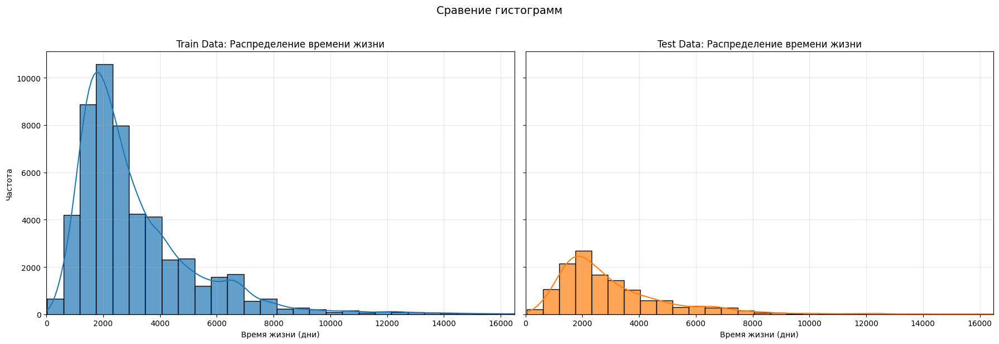

In [292]:
compare_hist_train_test(df_dates, df_dates_test, 'lifetime', title='Распределение времени жизни', xlabel='Время жизни (дни)', ylabel='Частота', sup_title='Сравение гистограмм')

In [293]:
abs(df_dates.lifetime.describe() - df_dates_test.lifetime.describe())

count    39391.000000
mean        15.121092
std         17.128681
min         33.000000
25%         16.000000
50%          0.000000
75%        121.000000
max        180.000000
Name: lifetime, dtype: float64

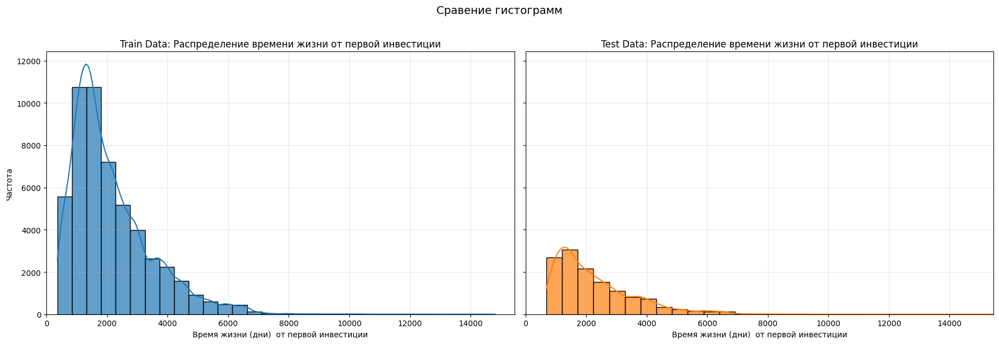

In [294]:
compare_hist_train_test(df_dates, df_dates_test, 'days_first_invest', title='Распределение времени жизни от первой инвестиции', xlabel='Время жизни (дни)  от первой инвестиции', ylabel='Частота', sup_title='Сравение гистограмм')

In [295]:
print(df_dates.days_first_invest.describe() - df_dates_test.days_first_invest.describe())

count    39391.000000
mean      -153.191010
std        -26.838884
min       -328.000000
25%       -105.000000
50%       -133.500000
75%       -131.000000
max      -1450.000000
Name: days_first_invest, dtype: float64


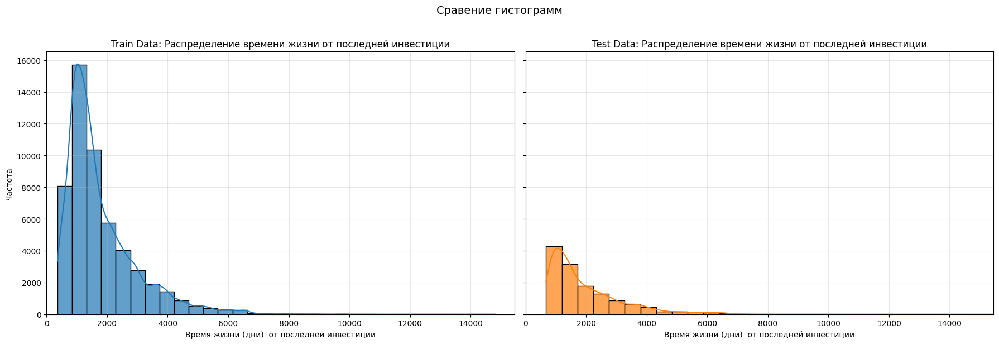

In [296]:
compare_hist_train_test(df_dates, df_dates_test, 'days_last_invest', title='Распределение времени жизни от последней инвестиции', xlabel='Время жизни (дни)  от последней инвестиции', ylabel='Частота', sup_title='Сравение гистограмм')

In [297]:
print(df_dates.days_last_invest.describe() - df_dates_test.days_last_invest.describe())

count    39391.000000
mean      -171.340042
std        -69.377490
min       -319.000000
25%        -85.000000
50%       -107.000000
75%       -235.000000
max      -1450.000000
Name: days_last_invest, dtype: float64


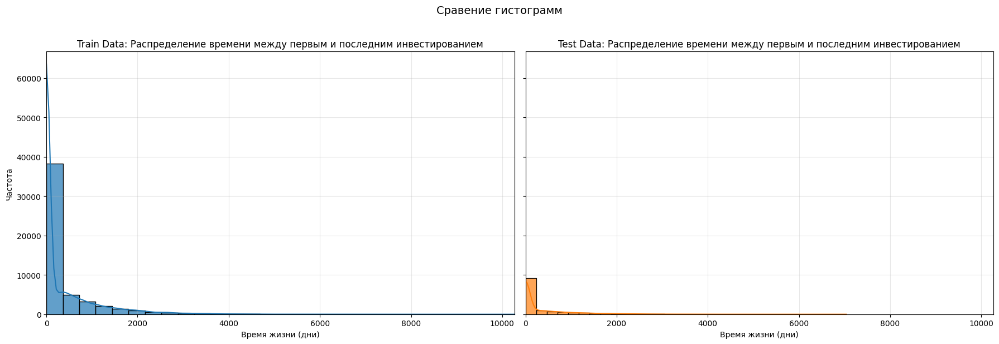

In [298]:
compare_hist_train_test(df_dates, df_dates_test, 'range_days', title='Распределение времени между первым и последним инвестированием', xlabel='Время жизни (дни)', ylabel='Частота', sup_title='Сравение гистограмм')

In [299]:
print(df_dates.range_days.describe() - df_dates_test.range_days.describe())

count    39391.000000
mean        18.149032
std         30.531324
min          0.000000
25%          0.000000
50%          0.000000
75%         36.000000
max       3769.000000
Name: range_days, dtype: float64


##### 3.1.1.2  Визуализация jilter

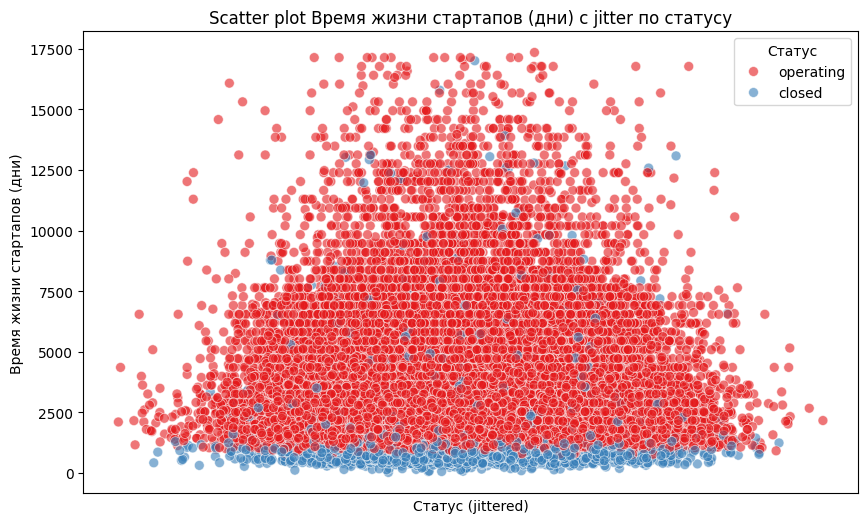

In [300]:
plot_jilter(df_dates, 'lifetime', 'Время жизни стартапов (дни)')

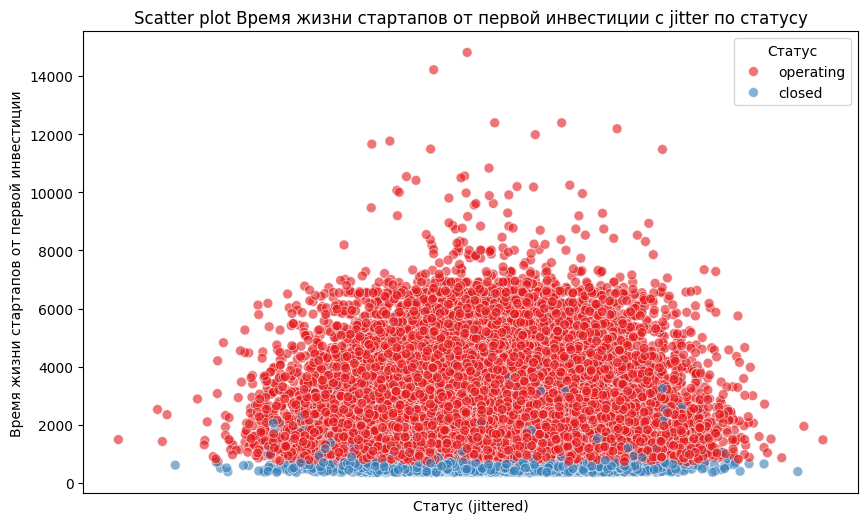

In [301]:
plot_jilter(df_dates, 'days_first_invest', 'Время жизни стартапов от первой инвестиции')

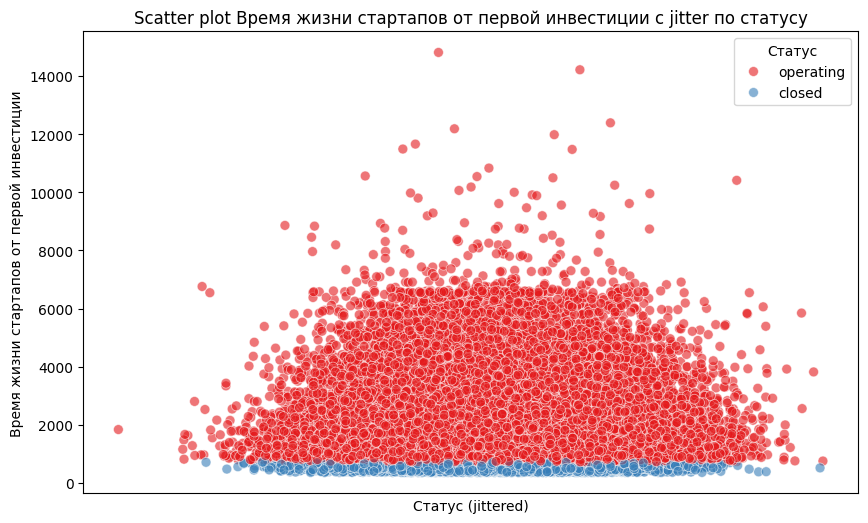

In [302]:
plot_jilter(df_dates, 'days_last_invest', 'Время жизни стартапов от первой инвестиции')

In [303]:
rd_high = df_dates[df_dates.range_days>0]

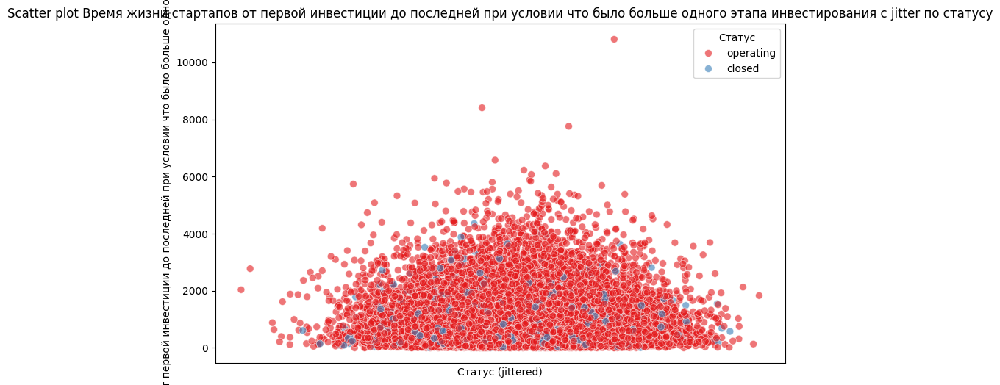

In [304]:
plot_jilter(rd_high, 'range_days', 'Время жизни стартапов от первой инвестиции до последней при условии что было больше одного этапа инвестирования')

##### 3.1.1.3  Визуализация hist по `status`

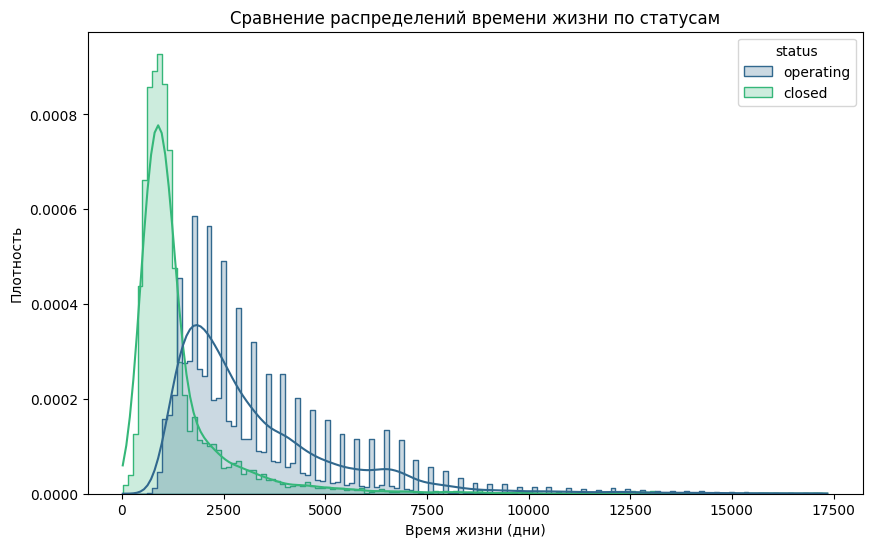

In [305]:
plot_hist_comp(df_dates, 'lifetime', 'Сравнение распределений времени жизни по статусам', 'Время жизни (дни)')

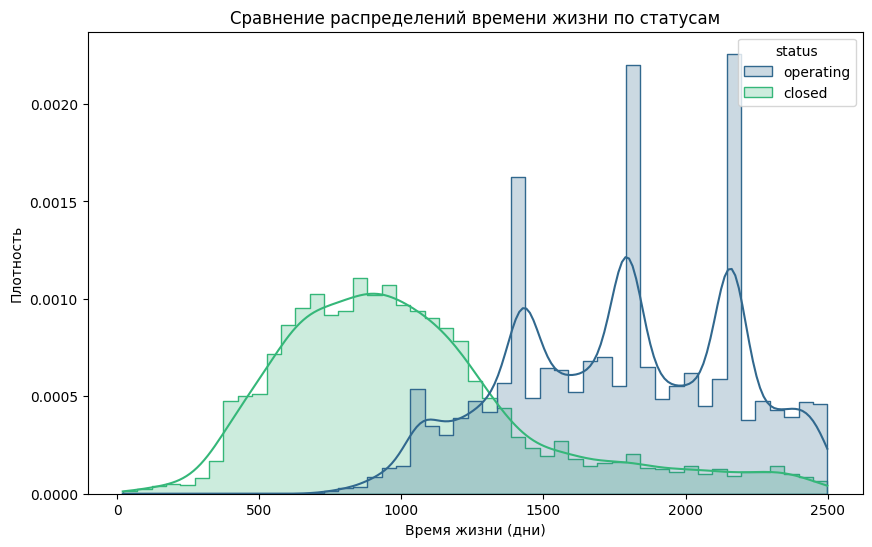

In [306]:
plt.figure(figsize=(10, 6))
sns.histplot(
    data=df_dates[df_dates.lifetime < 2500], 
    x="lifetime", 
    hue="status", 
    element="step", 
    stat="density", 
    common_norm=False, 
    palette="viridis",
    kde=True
)
plt.title("Сравнение распределений времени жизни по статусам")
plt.xlabel("Время жизни (дни)")
plt.ylabel("Плотность")
plt.show()

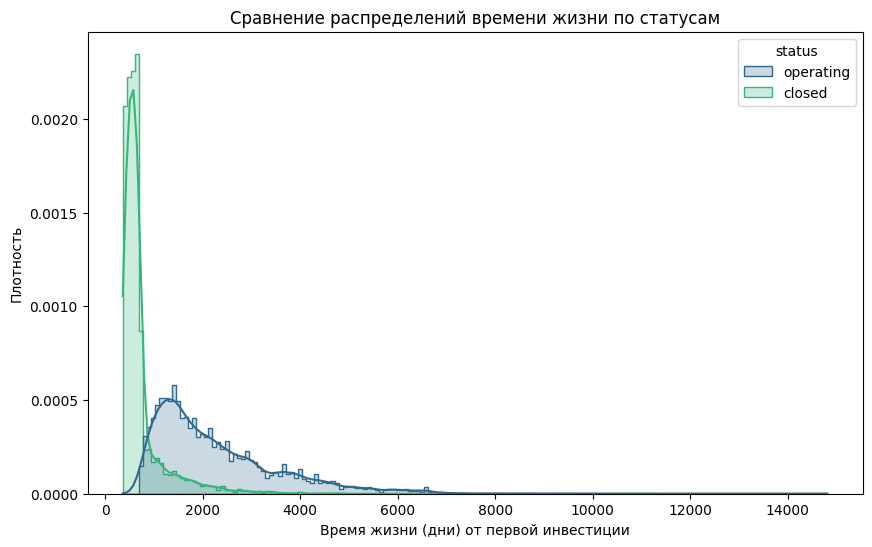

In [307]:
plot_hist_comp(df_dates, 'days_first_invest', 'Сравнение распределений времени жизни по статусам', 'Время жизни (дни) от первой инвестиции')

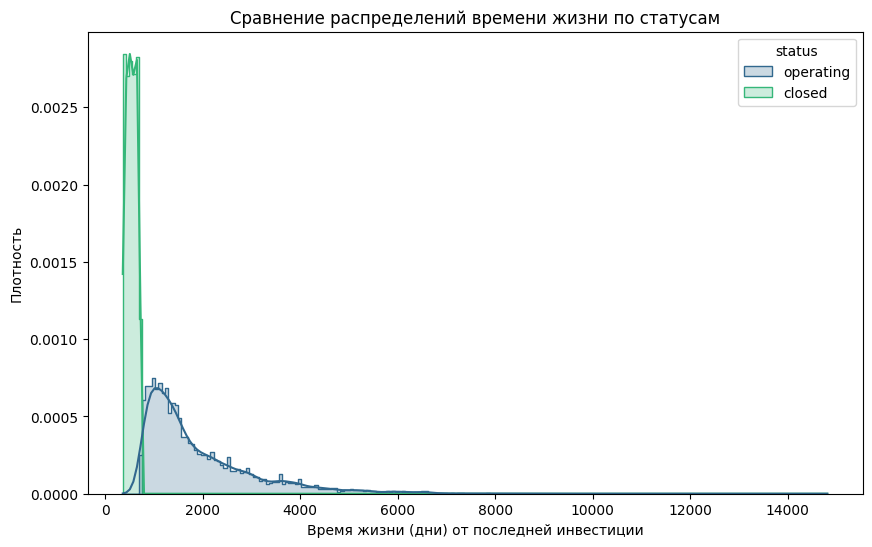

In [308]:
plot_hist_comp(df_dates, 'days_last_invest', 'Сравнение распределений времени жизни по статусам', 'Время жизни (дни) от последней инвестиции')

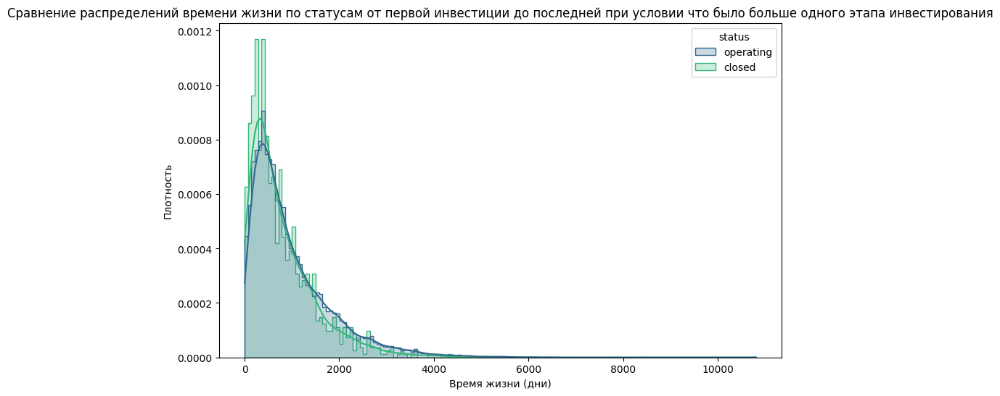

In [309]:
plot_hist_comp(rd_high, 'range_days', 'Сравнение распределений времени жизни по статусам от первой инвестиции до последней при условии что было больше одного этапа инвестирования', 'Время жизни (дни)')

##### 3.1.1.4  Визуализация hist по `violit`

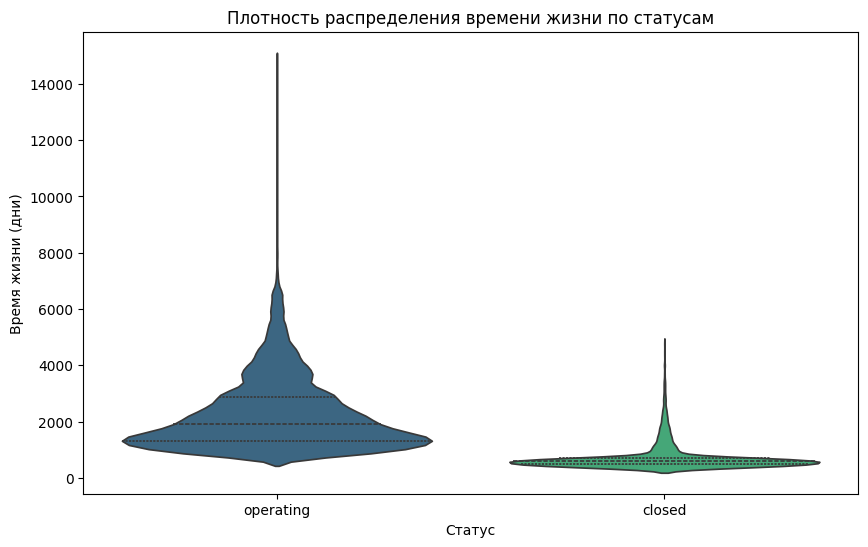

In [310]:
plot_violit(df_dates, 'days_first_invest', 'Плотность распределения времени жизни по статусам', 'Время жизни (дни)')

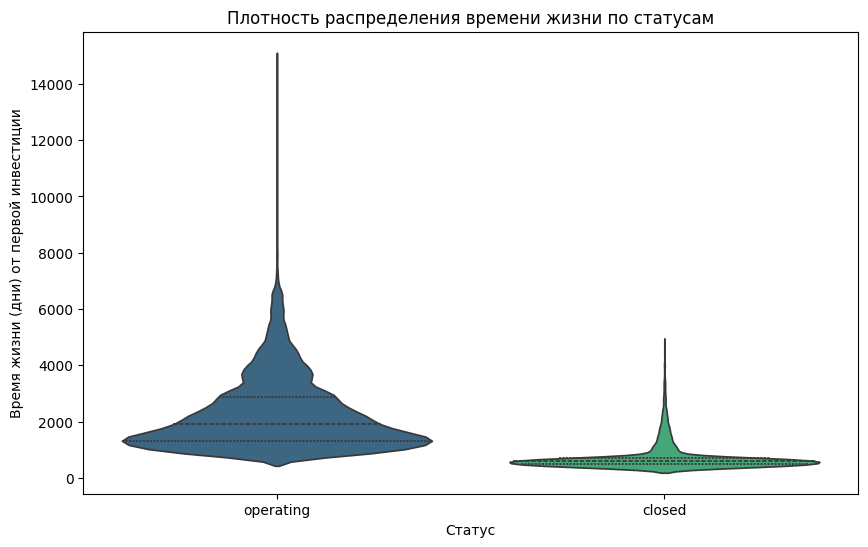

In [311]:
plot_violit(df_dates, 'days_first_invest', 'Плотность распределения времени жизни по статусам', 'Время жизни (дни) от первой инвестиции')

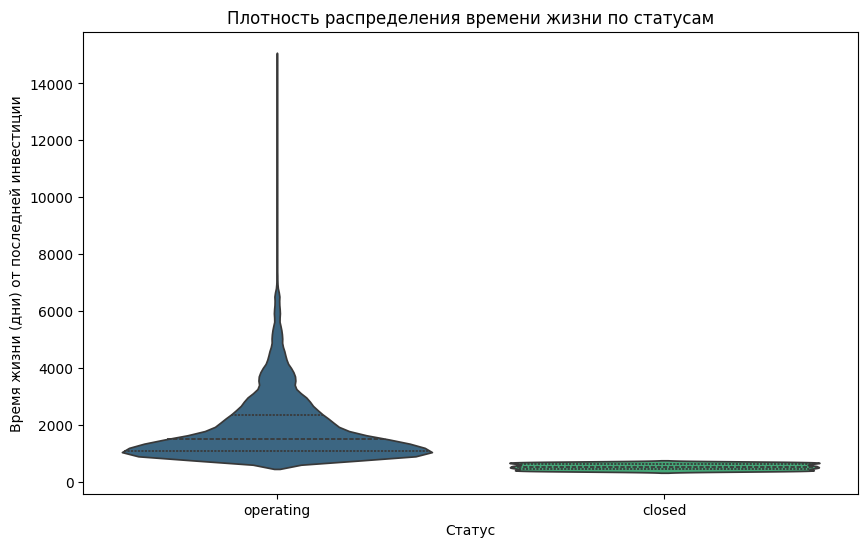

In [312]:
plot_violit(df_dates, 'days_last_invest', 'Плотность распределения времени жизни по статусам', 'Время жизни (дни) от последней инвестиции')

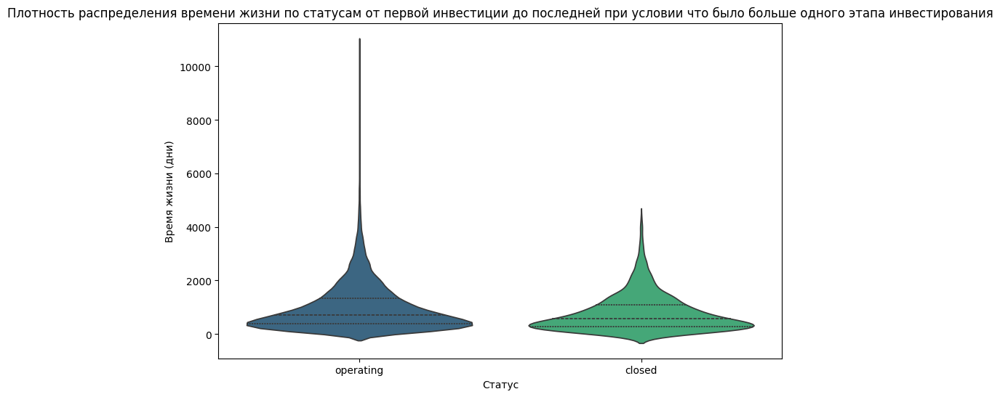

In [313]:
plot_violit(rd_high, 'range_days', 'Плотность распределения времени жизни по статусам от первой инвестиции до последней при условии что было больше одного этапа инвестирования', 'Время жизни (дни)')

##### 3.1.1.5  Визуализация countplot 

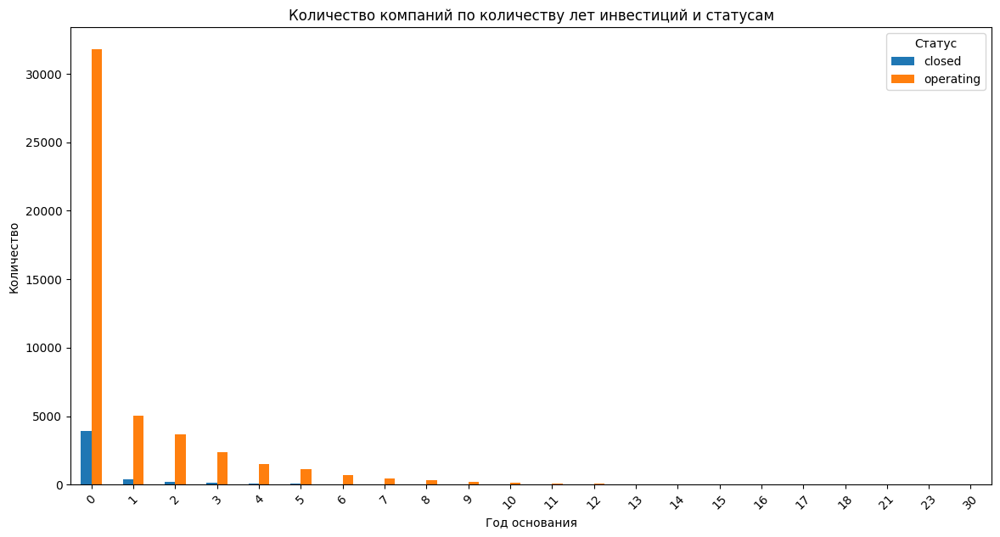

In [314]:
counts = df_dates.groupby(['range_year', 'status']).size().unstack().fillna(0)
counts.plot(kind='bar', figsize=(14, 7))
plt.title('Количество компаний по количеству лет инвестиций и статусам')
plt.xlabel('Год основания')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.legend(title='Статус')
plt.show()

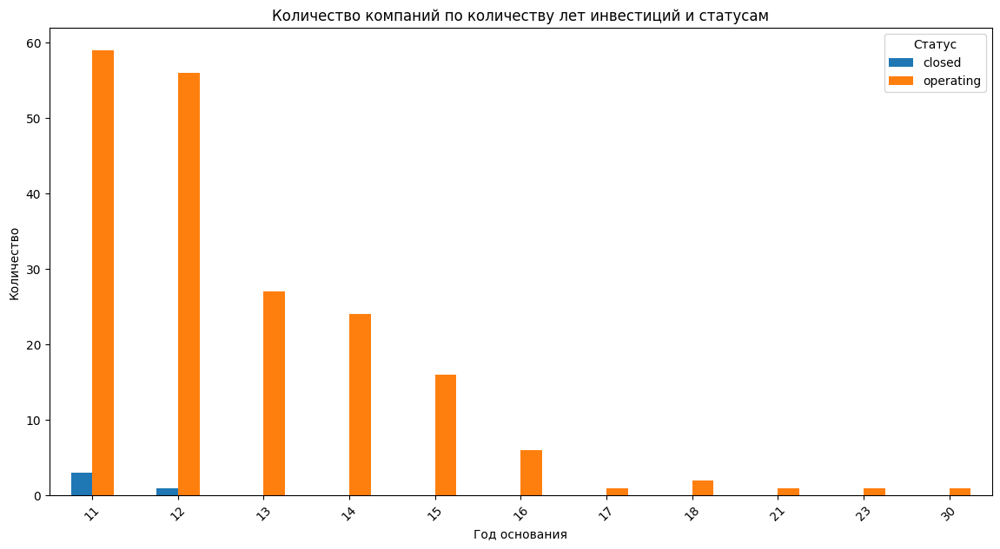

In [315]:
counts = df_dates[df_dates.range_year >10].groupby(['range_year', 'status']).size().unstack().fillna(0)
counts.plot(kind='bar', figsize=(14, 7))
plt.title('Количество компаний по количеству лет инвестиций и статусам')
plt.xlabel('Год основания')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.legend(title='Статус')
plt.show()

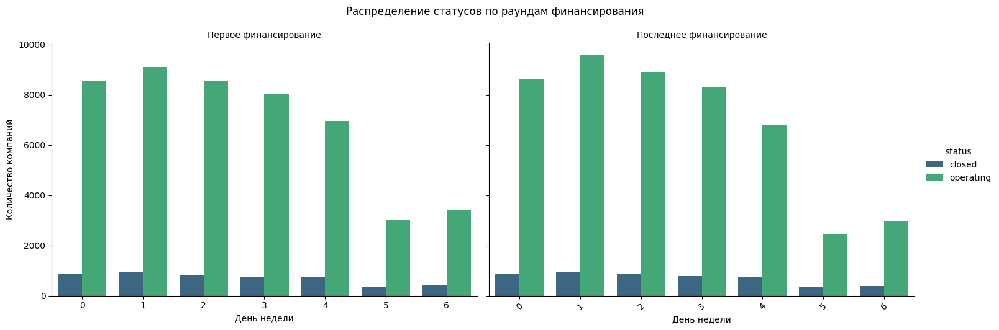

In [316]:
df_melted = df_dates.melt(
    id_vars=['status'],
    value_vars=['first_funding_at_weekday', 'last_funding_at_weekday'],
    var_name='funding_type',
    value_name='weekday'
)

# Группируем и считаем
df_grouped = df_melted.groupby(['funding_type', 'weekday', 'status']).size().reset_index(name='count')

# Заменяем технические названия на человеческие
df_grouped['funding_type'] = df_grouped['funding_type'].replace({
    'first_funding_at_weekday': 'Первое финансирование',
    'last_funding_at_weekday': 'Последнее финансирование'
})

# Строим график
g = sns.catplot(
    data=df_grouped,
    x='weekday',
    y='count',
    hue='status',
    col='funding_type',
    kind='bar',
    height=5,
    aspect=1.5,
    palette='viridis'
)

# Настройка подписей
g.set_axis_labels('День недели', 'Количество компаний')
g.set_titles('{col_name}')
g.fig.suptitle('Распределение статусов по раундам финансирования', y=1.05)
plt.xticks(rotation=45)
plt.show()

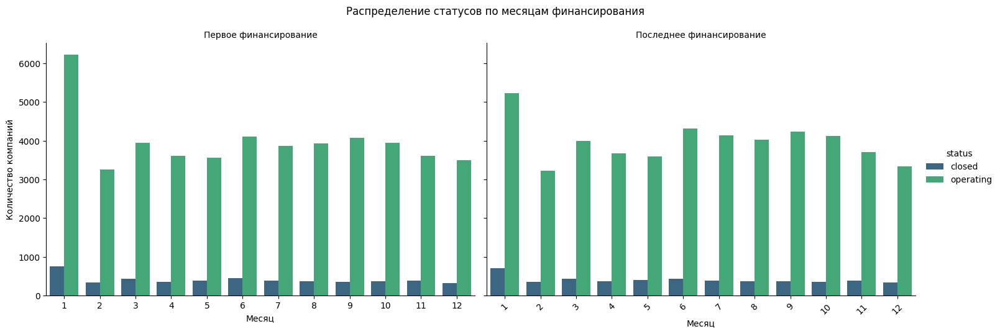

In [317]:
df_melted = df_dates.melt(
    id_vars=['status'],
    value_vars=['first_funding_at_month', 'last_funding_at_month'],
    var_name='funding_type',
    value_name='month'
)

# Группируем и считаем
df_grouped = df_melted.groupby(['funding_type', 'month', 'status']).size().reset_index(name='count')

# Заменяем технические названия на человеческие
df_grouped['funding_type'] = df_grouped['funding_type'].replace({
    'first_funding_at_month': 'Первое финансирование',
    'last_funding_at_month': 'Последнее финансирование'
})

# Строим график
g = sns.catplot(
    data=df_grouped,
    x='month',
    y='count',
    hue='status',
    col='funding_type',
    kind='bar',
    height=5,
    aspect=1.5,
    palette='viridis',
    sharex=False
)

# Настройка подписей
g.set_axis_labels('Месяц', 'Количество компаний')
g.set_titles('{col_name}')
g.fig.suptitle('Распределение статусов по месяцам финансирования', y=1.05)
plt.xticks(rotation=45)
plt.show()

#### 3.1.2 Визуальное сравнение `lifetime_category`, `days_first_invest_category`, `days_last_invest_category`

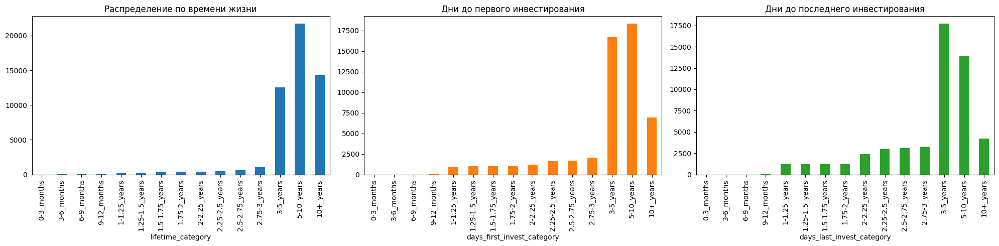

In [318]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Lifetime
df_dates['lifetime_category'].value_counts().sort_index().plot(
    kind='bar', 
    ax=axes[0], 
    title='Распределение по времени жизни',
    color='#1f77b4'
)

# Days First Invest
df_dates['days_first_invest_category'].value_counts().sort_index().plot(
    kind='bar', 
    ax=axes[1], 
    title='Дни до первого инвестирования',
    color='#ff7f0e'
)

# Days Last Invest
df_dates['days_last_invest_category'].value_counts().sort_index().plot(
    kind='bar', 
    ax=axes[2], 
    title='Дни до последнего инвестирования',
    color='#2ca02c'
)

plt.tight_layout()
plt.show()

<Figure size 1400x1000 with 0 Axes>

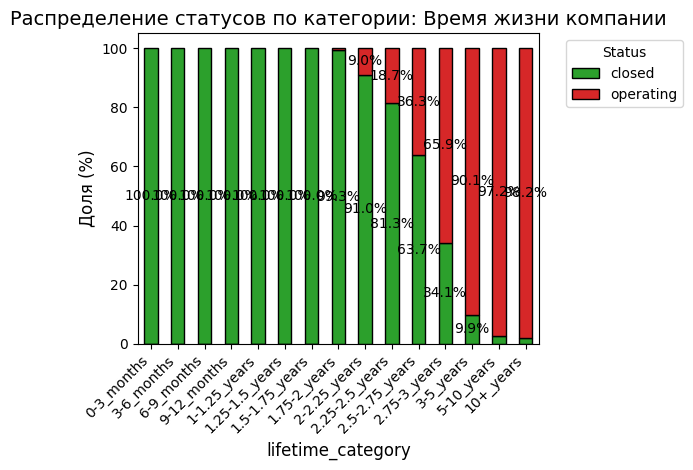

<Figure size 1400x1000 with 0 Axes>

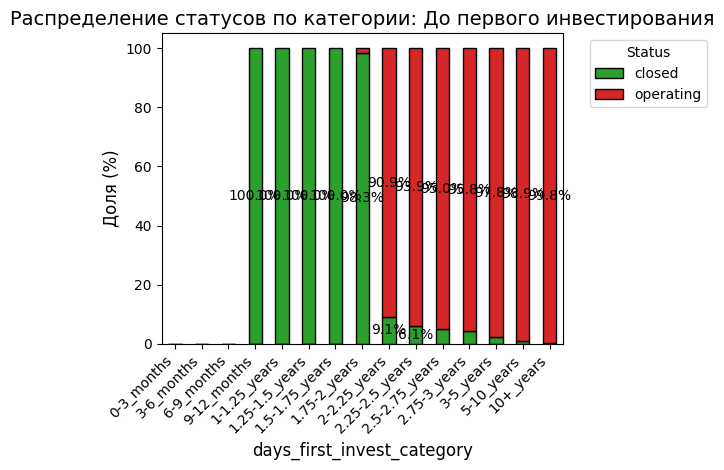

<Figure size 1400x1000 with 0 Axes>

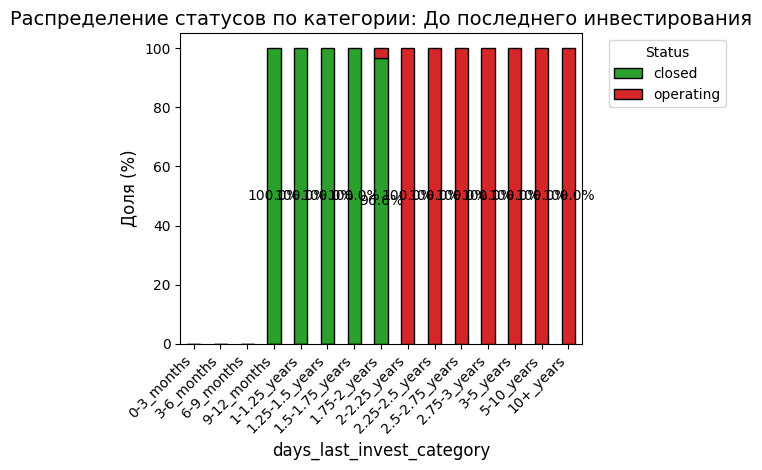

In [319]:
def plot_category_status_relation(df, category_col, title):
    plt.figure(figsize=(14, 10))
    
    # Группировка и нормализация
    grouped = df.groupby([category_col, 'status']).size().unstack().fillna(0)
    grouped_pct = grouped.div(grouped.sum(axis=1), axis=0) * 100
    
    # График
    ax = grouped_pct.plot(
        kind='bar', 
        stacked=True,
        color=['#2ca02c', '#d62728'],  # Зеленый=operating, Красный=closed
        edgecolor='black'
    )
    
    # Настройки
    plt.title(f'Распределение статусов по категории: {title}', fontsize=14)
    plt.xlabel(category_col, fontsize=12)
    plt.ylabel('Доля (%)', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Status', bbox_to_anchor=(1.05, 1))
    
    # Аннотации
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        if height > 5:  
            x, y = p.get_xy() 
            ax.annotate(
                f'{height:.1f}%', 
                (x + width/2, y + height/2), 
                ha='center', 
                va='center'
            )
    
    plt.tight_layout()
    plt.show()

plot_category_status_relation(df_dates, 'lifetime_category', 'Время жизни компании')
plot_category_status_relation(df_dates, 'days_first_invest_category', 'До первого инвестирования')
plot_category_status_relation(df_dates, 'days_last_invest_category', 'До последнего инвестирования')

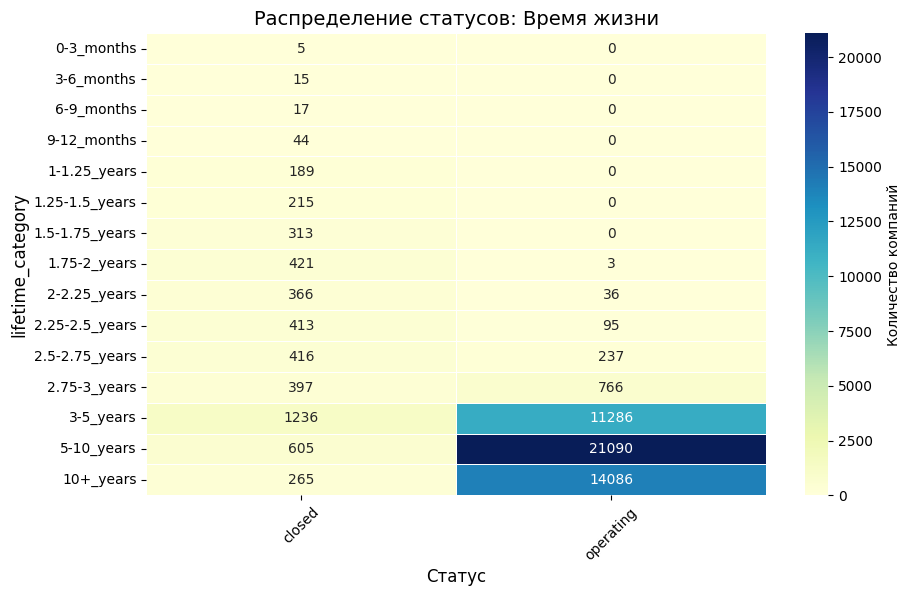

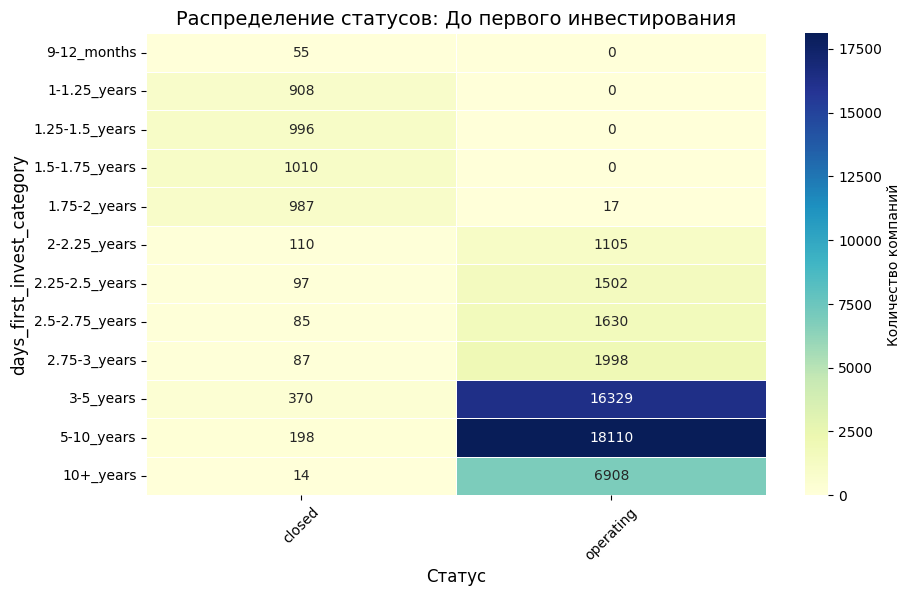

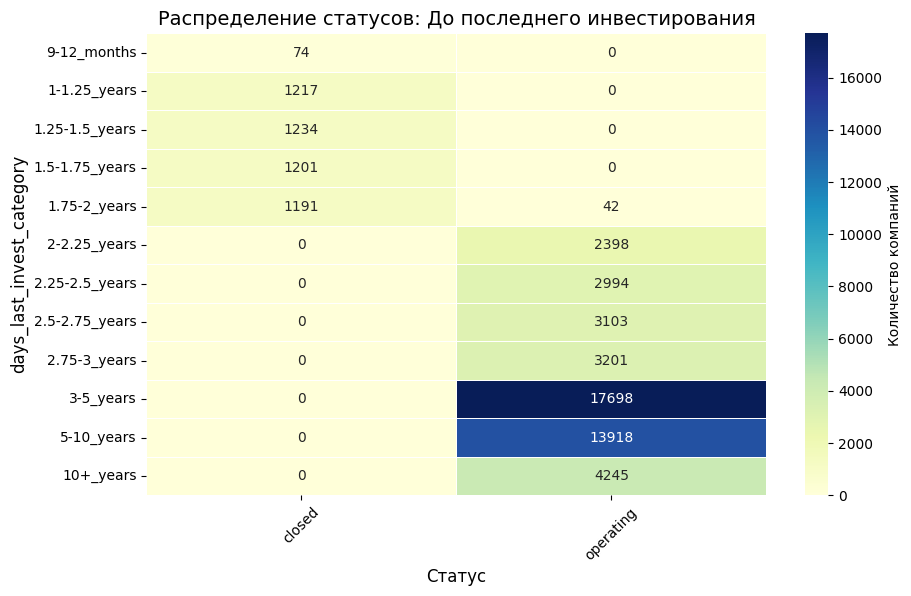

In [320]:
def plot_heatmap_category(df, category_col, title):
    plt.figure(figsize=(10, 6))
    
    # Подготовка данных
    cross_tab = pd.crosstab(df[category_col], df['status'])
    
    # Визуализация
    sns.heatmap(
        cross_tab,
        annot=True,
        fmt='d',
        cmap='YlGnBu',
        linewidths=0.5,
        cbar_kws={'label': 'Количество компаний'}
    )
    
    # Настройки
    plt.title(f'Распределение статусов: {title}', fontsize=14)
    plt.xlabel('Статус', fontsize=12)
    plt.ylabel(category_col, fontsize=12)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

# Примеры использования
plot_heatmap_category(df_dates, 'lifetime_category', 'Время жизни')
plot_heatmap_category(df_dates, 'days_first_invest_category', 'До первого инвестирования')
plot_heatmap_category(df_dates, 'days_last_invest_category', 'До последнего инвестирования')

In [321]:
df_dates_test

,first_funding_at_year,first_funding_at_weekday,first_funding_at_month,last_funding_at_year,last_funding_at_weekday,last_funding_at_month,lifetime,days_first_invest,days_last_invest,range_year,range_days,lifetime_category,days_first_invest_category,days_last_invest_category,quat_f_fund,quat_l_fund
0,2009,2,7,2009,2,7,3501,3034,3034,0,0,5-10_years,5-10_years,5-10_years,2867.627849,2867.627849
1,2010,2,7,2010,2,7,2717,2642,2642,0,0,5-10_years,5-10_years,5-10_years,2083.446977,2083.446977
2,2014,3,5,2014,3,9,1295,1255,1129,0,126,3-5_years,3-5_years,3-5_years,750.723489,660.723489
3,2005,5,1,2010,1,4,4748,4676,2741,5,1935,10+_years,10+_years,5-10_years,4295.351338,4204.446977
4,2007,1,5,2007,1,5,6209,3819,3819,0,0,10+_years,10+_years,10+_years,5665.989594,5665.989594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13120,2012,6,7,2012,6,7,2267,1938,1938,0,0,5-10_years,5-10_years,5-10_years,1633.085233,1633.085233
13121,2013,1,10,2013,1,10,2192,1481,1481,0,0,5-10_years,3-5_years,3-5_years,1467.904361,1467.904361
13122,2008,0,9,2011,1,6,2922,3337,2307,3,1030,5-10_years,5-10_years,5-10_years,2288.808722,2378.266105
13123,2014,5,9,2014,1,11,1386,1120,1082,0,38,3-5_years,3-5_years,2.75-3_years,751.723489,661.723489


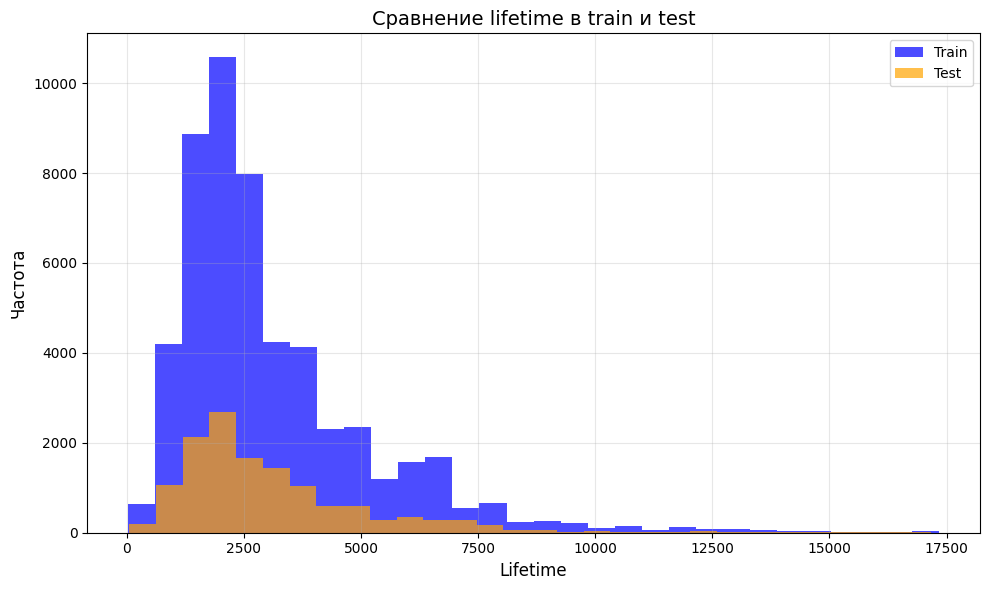

In [322]:
def plot_two_histograms(df1, df2, column, bins=30, title='Comparison of Distributions', 
                        xlabel='Value', ylabel='Frequency', label1='DataFrame 1', 
                        label2='DataFrame 2', color1='blue', color2='orange', alpha=0.7):
    """
    Функция для отрисовки двух гистограмм из двух датафреймов на одном графике.
    
    Параметры:
    - df1: первый DataFrame
    - df2: второй DataFrame
    - column: название столбца для построения гистограммы
    - bins: количество интервалов (по умолчанию 30)
    - title: заголовок графика
    - xlabel: подпись оси X
    - ylabel: подпись оси Y
    - label1: легенда для первого датафрейма
    - label2: легенда для второго датафрейма
    - color1: цвет для гистограммы первого датафрейма
    - color2: цвет для гистограммы второго датафрейма
    - alpha: прозрачность гистограмм (0–1)
    """
    
    # Проверяем, что столбец есть в обоих датафреймах
    if column not in df1.columns or column not in df2.columns:
        raise ValueError(f"Столбец '{column}' отсутствует в одном из датафреймов")
    
    # Создаем фигуру
    plt.figure(figsize=(10, 6))
    
    # Отрисовываем гистограммы
    plt.hist(df1[column].dropna(), bins=bins, alpha=alpha, color=color1, label=label1)
    plt.hist(df2[column].dropna(), bins=bins, alpha=alpha, color=color2, label=label2)
    
    # Добавляем подписи и легенду
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.legend()
    
    # Показываем график
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_two_histograms(df_dates, df_dates_test, 
                    column='lifetime', 
                    title='Сравнение lifetime в train и test', 
                    xlabel='Lifetime', 
                    ylabel='Частота', 
                    label1='Train', 
                    label2='Test')

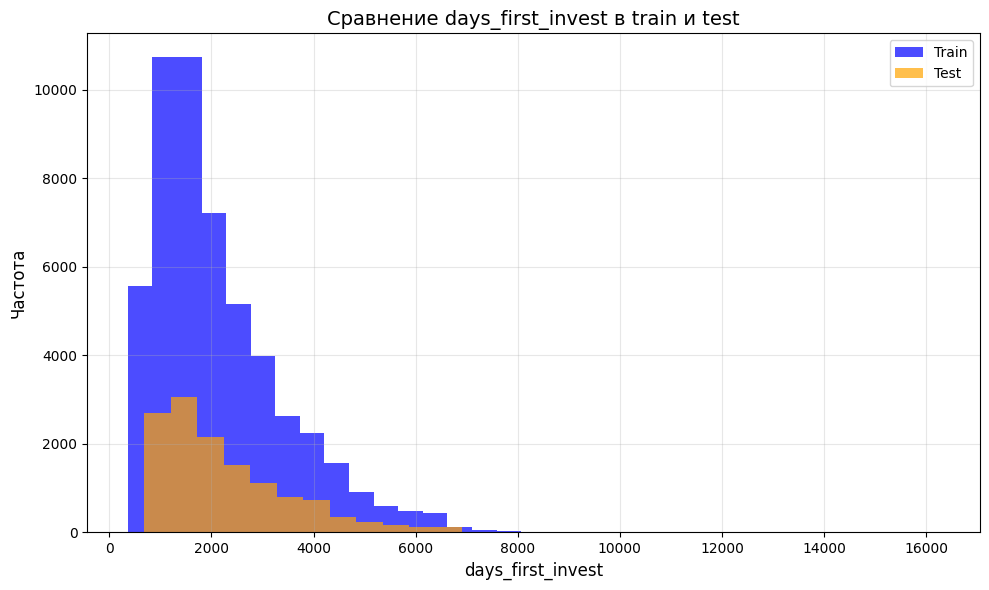

In [323]:
plot_two_histograms(df_dates, df_dates_test, 
                    column='days_first_invest', 
                    title='Сравнение days_first_invest в train и test', 
                    xlabel='days_first_invest', 
                    ylabel='Частота', 
                    label1='Train', 
                    label2='Test')

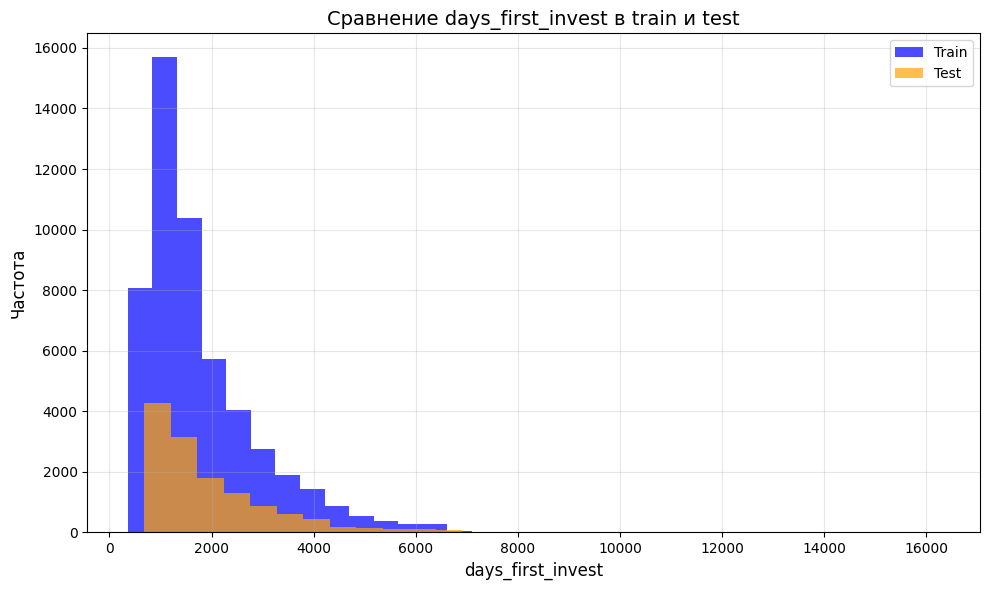

In [324]:
plot_two_histograms(df_dates, df_dates_test, 
                    column='days_last_invest', 
                    title='Сравнение days_first_invest в train и test', 
                    xlabel='days_first_invest', 
                    ylabel='Частота', 
                    label1='Train', 
                    label2='Test')

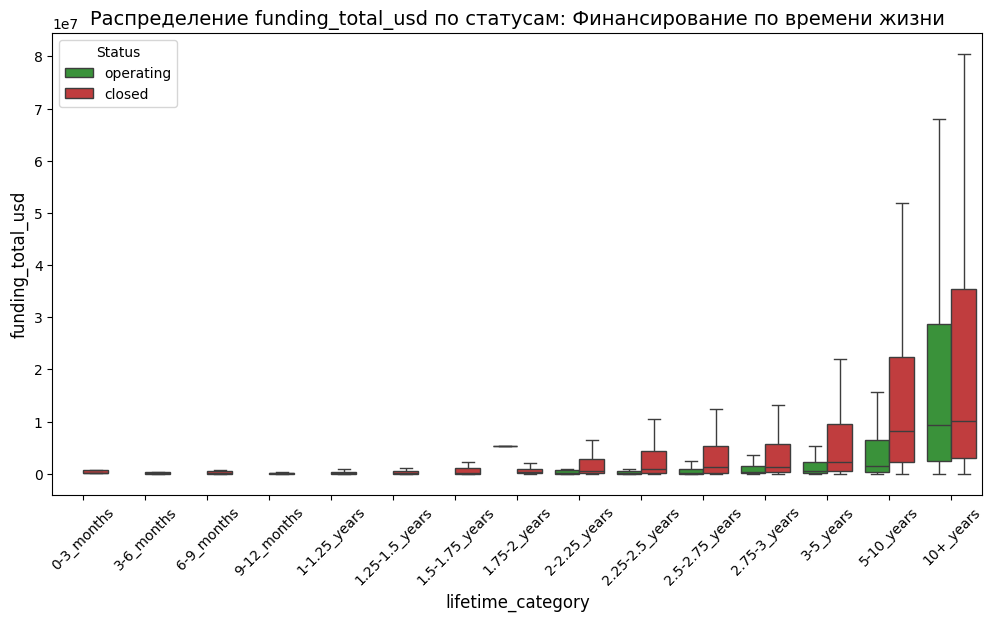

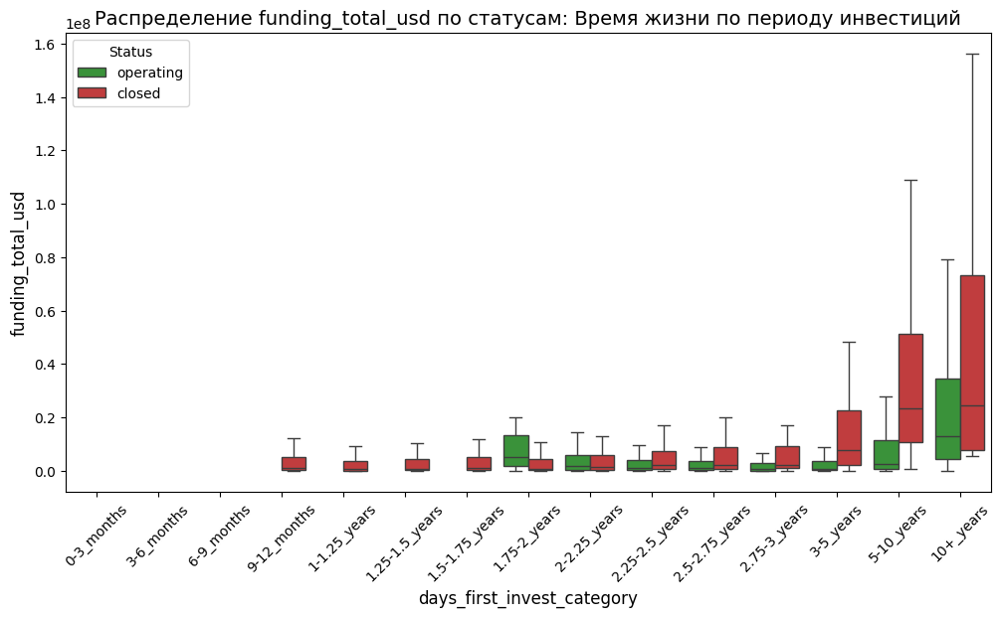

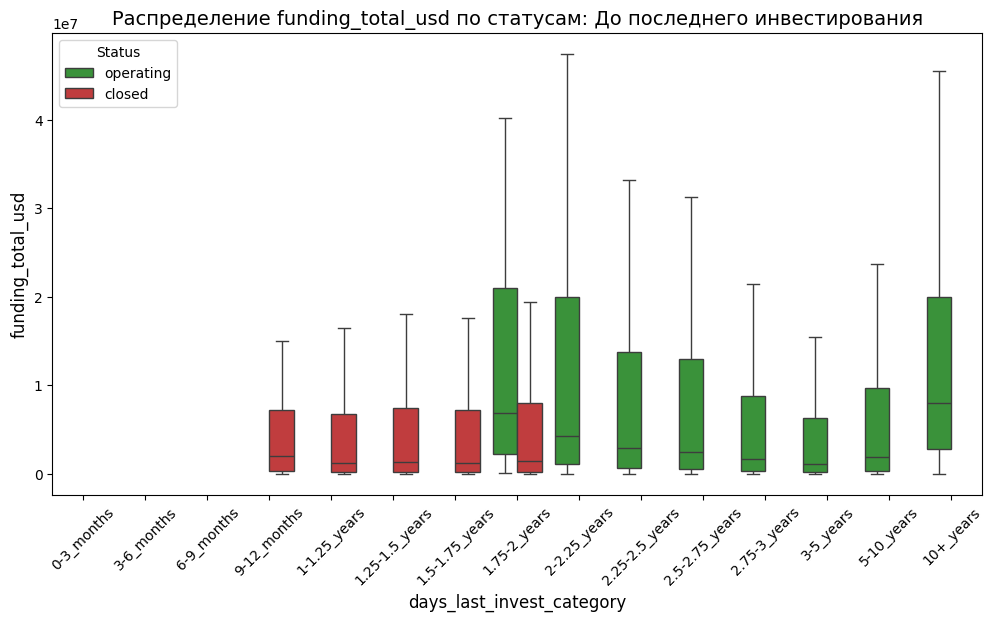

In [325]:
df_dates['funding_total_usd'] = df_train_cp['funding_total_usd'].copy()
def plot_boxplot_category(df, category_col, num_col, title):
    plt.figure(figsize=(12, 6))
    
    # График
    sns.boxplot(
        data=df,
        x=category_col,
        y=num_col,
        hue='status',
        palette={'operating': '#2ca02c', 'closed': '#d62728'},
        showfliers=False
    )
    
    # Настройки 
    plt.title(f'Распределение {num_col} по статусам: {title}', fontsize=14)
    plt.xlabel(category_col, fontsize=12)
    plt.ylabel(num_col, fontsize=12)
    plt.xticks(rotation=45)
    plt.legend(title='Status')
    plt.show()

# Примеры использования
plot_boxplot_category(df_dates, 'lifetime_category', 'funding_total_usd', 'Финансирование по времени жизни')
plot_boxplot_category(df_dates, 'days_first_invest_category', 'funding_total_usd', 'Время жизни по периоду инвестиций')
plot_boxplot_category(df_dates, 'days_last_invest_category', 'funding_total_usd', 'До последнего инвестирования')

#### 3.1.3 Корреляция df_date

interval columns not set, guessing: ['lifetime', 'days_first_invest', 'days_last_invest', 'first_funding_at_year', 'first_funding_at_weekday', 'first_funding_at_month', 'last_funding_at_year', 'last_funding_at_weekday', 'last_funding_at_month', 'range_year', 'range_days', 'quat_f_fund', 'quat_l_fund', 'funding_total_usd']


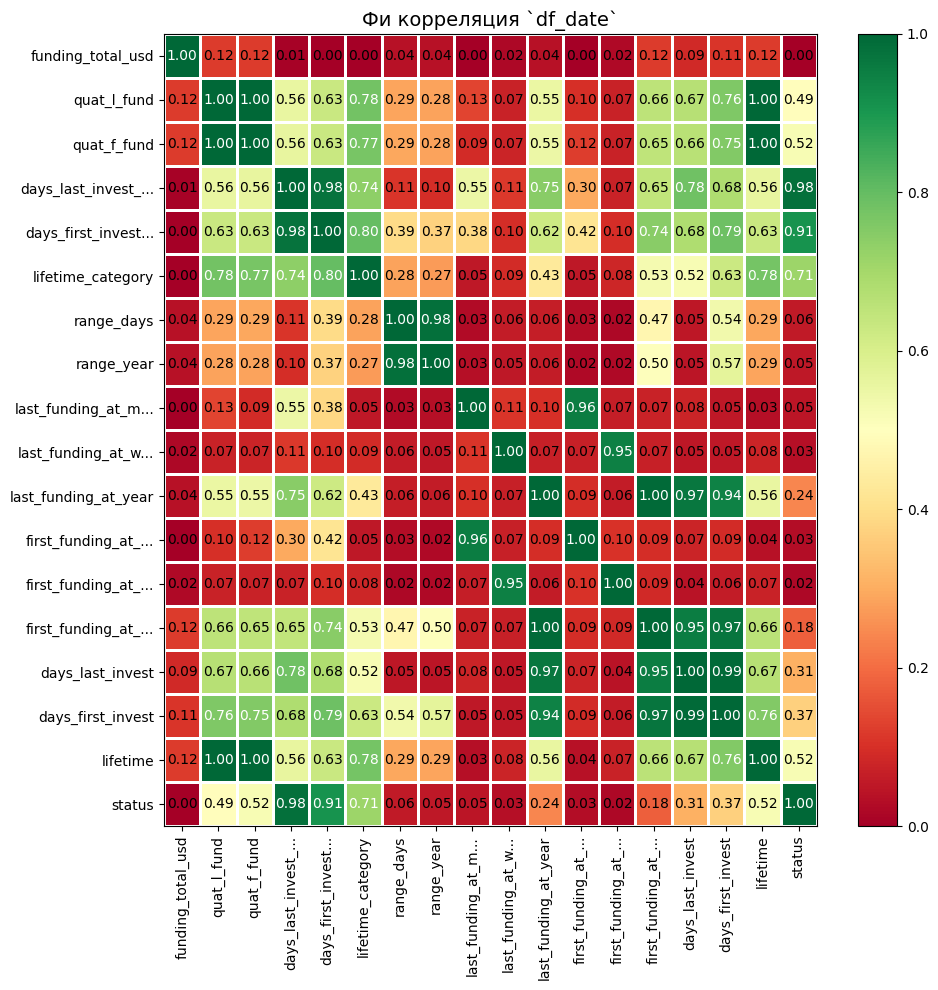

In [326]:
phik_date = df_dates.sample(50000).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_date`',fontsize_factor=1,
                        figsize=(10,10))
plt.tight_layout()

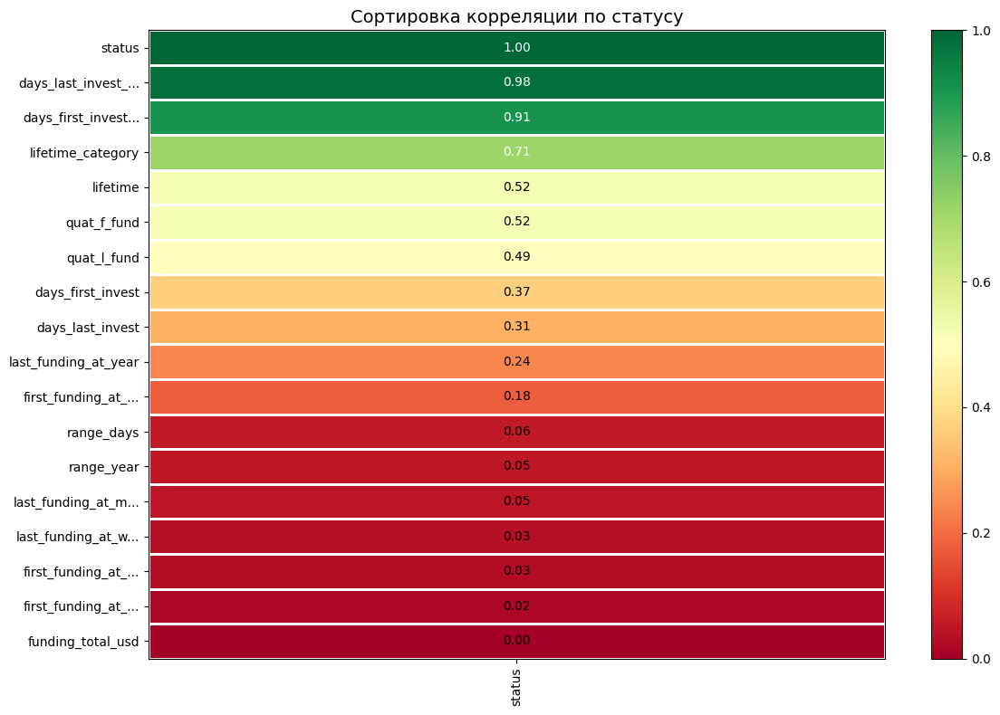

In [327]:
phik_date_status = phik_date[['status']].sort_values(ascending=True,by='status')
plot_correlation_matrix(phik_date_status.values, x_labels=phik_date_status.columns, y_labels=phik_date_status.index, 
                        vmin=0, vmax=1, title=r'Сортировка корреляции по статусу', 
                        fontsize_factor=1, figsize=(12,8))

In [328]:
phik_date_status

,status
funding_total_usd,0.000000
first_funding_at_weekday,0.018575
first_funding_at_month,0.029995
last_funding_at_weekday,0.031864
last_funding_at_month,0.045575
range_year,0.053359
range_days,0.058498
first_funding_at_year,0.176448
last_funding_at_year,0.239740
days_last_invest,0.307062


#### 3.1.4 Вывод по датам 

- Наибольшее количество компаний основывалось с 1995 года и росло, соответсвтенно росли и доли закрытых компаний так и которые ещё существуют; 
- Максимальное количество компаний в которых проводились инвестиции длились меньше года и год;
- Наибольшую корреляцию с целевой имеют признаки: `lifetime`, `days_last_invest`, `days_first_invest`;
- Основная масса стартапов которые закрываются в процентном соотношение в `lifetime` не существуют больше 2-х:

  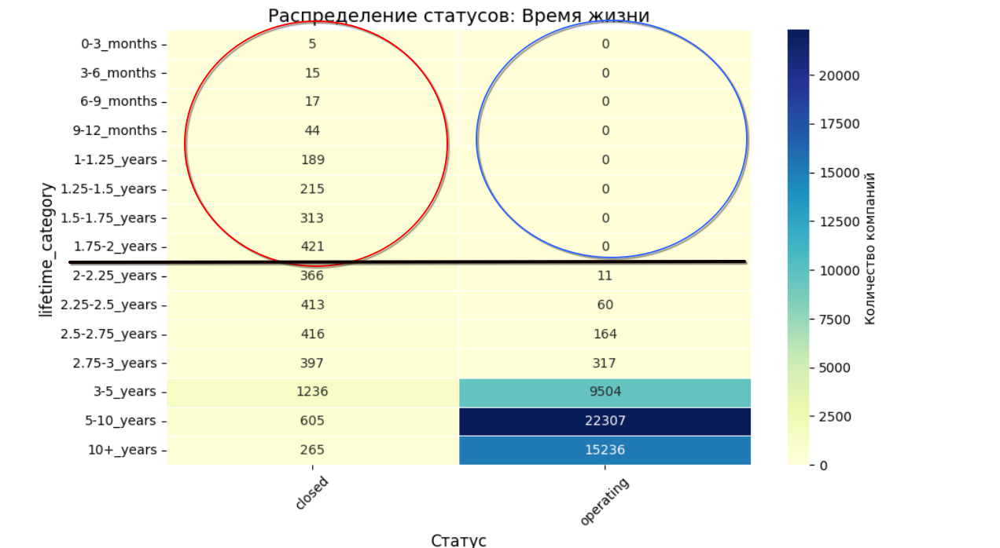
  
- Выборка между `days_last_invest` и `days_first_invest` сильно смещена относительно тренировочной и тестовой части, поэтому данные признаки лучше не использовать:

  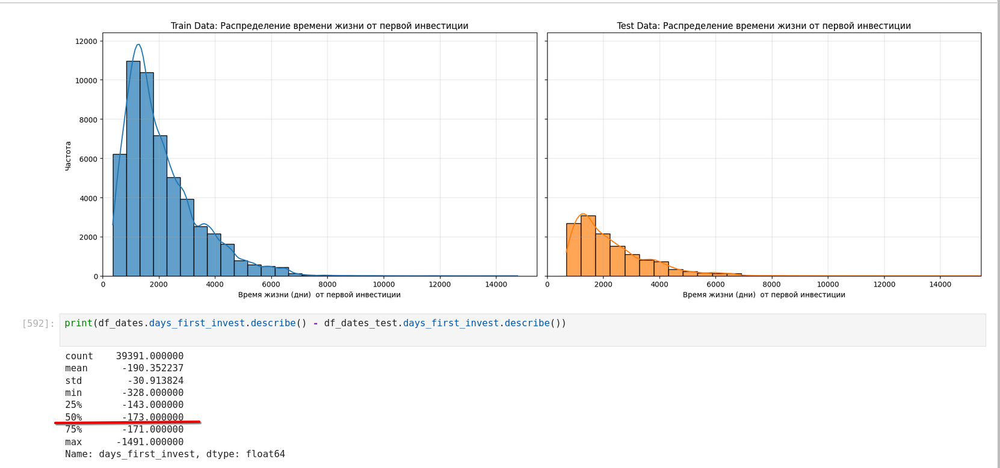
  
- Необходимо посмотреть `lifetime` в связке с количественными признаками;
- Признаки `last_funding_at_year` и `first_funding_at_year` имеют корреляцию около 20%, возможно получиться улучшить эти при совмещении их с числовыми признаками 

### 3.2 Анализ соотнешения `status` с числовыми колонками  

- Пропуски `funding_total_usd` вероятно лучше заполнить средними данными из `country_code`, `city` и `lifetime`;
- Также можно создать доп признакак для категории финансирования; 

In [329]:
class FeatureGenDateNum(FeatureGen): 

    def __init__(self, df:pd.DataFrame):
        super().__init__(df)
        self.cols_number = ['funding_total_usd','funding_rounds']

    def create_categorical_fund(self):
        bins = [
            0,          # Категория 1: (0, 10]
            10,         # Категория 2: (10, 100]
            100,        # Категория 3: (100, 1000]
            1000,       # Категория 4: (1000, 10000]
            10000,      # Категория 5: (10000, 100000]
            100000,     # Категория 6: (100000, 1000000]
            1000000,    # Категория 7: (1000000, 10000000]
            10000000,   # Категория 8: (10000000, 100000000]
            100000000,  # Категория 9: (100000000, 1000000000]
            1000000000, # Категория 10: (1000000000, ...]
            float('inf') # Верхняя граница
        ]
        
        # Метки категорий (1-10)
        labels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
        
        # Создаем новую колонку
        self.df_date['funding_category'] = pd.cut(
            self.df_date['funding_total_usd'],
            bins=bins,
            labels=labels,
            right=False, # Интервал [левая_граница, правая_граница)
            include_lowest=True # Включаем 0
        ).astype(int) # Конвертируем в целые числа

    def create_feature_fund_round_with_fund_cat(self):
        self.df_date['fin_x_cat_vs_day_x_round'] = np.log10((self.df_date['funding_total_usd'] * self.df_date['funding_category']) / (self.df_date['lifetime'] * self.df_date['funding_rounds']))
    
    def append_num_cols(self, get_df=False):
        # 1. сохранение числовых колонок в df_date 
        for col in self.cols_number: 
            self.df_date[col] = self.raw_df[col].copy() 

        # 2. Заполнение по country_code, city, lifetime_category  медианными значениями 
        self.df_date['country_code'] = self.raw_df['country_code'].copy()
        self.df_date['city'] = self.raw_df['city'].copy()
        self.df_date['funding_total_usd'] = self.df_date.groupby(['country_code', 'city', 'lifetime_category'])['funding_total_usd'].transform(lambda x: x.fillna(x.median()))
       
        # 3. Если остались NaN, заполняем по country_code
        self.df_date['funding_total_usd'] = self.df_date.groupby(['country_code'])['funding_total_usd'].transform(lambda x: x.fillna(x.median()))
          
        # 4. Если всё ещё есть NaN, заполняем общим медианым или 0
        overall_mean = self.df_date['funding_total_usd'].median()
        self.df_date['funding_total_usd'] = self.df_date['funding_total_usd'].fillna(overall_mean if not pd.isna(overall_mean) else 0)
        
        # 5. Добавление признака время жизни по логарифму 
        self.df_date['div_day_life'] = np.log10(self.df_date.lifetime) 
        
        # self.df_date['div_day_last'] = np.log10(self.df_date.days_last_invest) 
        # self.df_date['div_day_first'] = np.log10(self.df_date.days_first_invest) 
         
        self.create_categorical_fund()
        self.create_feature_fund_round_with_fund_cat()
        
        if get_df:
            return self.df_date
            

In [330]:
df_train_cp = df_train.copy()
feat_gean_train = FeatureGenDateNum(df_train_cp)
feat_gean_train.train_date_create_cols()
df_train_num_dates = feat_gean_train.append_num_cols(True)
df_train_num_dates.head(1)

,status,lifetime,days_first_invest,days_last_invest,first_funding_at_year,first_funding_at_weekday,first_funding_at_month,last_funding_at_year,last_funding_at_weekday,last_funding_at_month,...,days_last_invest_category,quat_f_fund,quat_l_fund,funding_total_usd,funding_rounds,country_code,city,div_day_life,funding_category,fin_x_cat_vs_day_x_round
0,operating,2967,2406,1096,2011,6,5,2014,0,12,...,3-5_years,2423.266105,2242.723489,828626.0,2,CHE,Zürich,3.472318,6,2.923162


In [331]:
df_train_num_dates[df_train_num_dates.funding_total_usd.isna() == True].count()

status                        0
lifetime                      0
days_first_invest             0
days_last_invest              0
first_funding_at_year         0
first_funding_at_weekday      0
first_funding_at_month        0
last_funding_at_year          0
last_funding_at_weekday       0
last_funding_at_month         0
range_year                    0
range_days                    0
lifetime_category             0
days_first_invest_category    0
days_last_invest_category     0
quat_f_fund                   0
quat_l_fund                   0
funding_total_usd             0
funding_rounds                0
country_code                  0
city                          0
div_day_life                  0
funding_category              0
fin_x_cat_vs_day_x_round      0
dtype: int64

In [332]:
df_test_cp = df_test.copy()
feat_gean_test = FeatureGenDateNum(df_test_cp)
feat_gean_test.create_date_cols_for_test()
df_test_num_dates = feat_gean_test.append_num_cols(True)
df_test_num_dates.head(1)

,first_funding_at_year,first_funding_at_weekday,first_funding_at_month,last_funding_at_year,last_funding_at_weekday,last_funding_at_month,lifetime,days_first_invest,days_last_invest,range_year,...,days_last_invest_category,quat_f_fund,quat_l_fund,funding_total_usd,funding_rounds,country_code,city,div_day_life,funding_category,fin_x_cat_vs_day_x_round
0,2009,2,7,2009,2,7,3501,3034,3034,0,...,5-10_years,2867.627849,2867.627849,2077120.0,1,NIC,NaN,3.544192,7,3.618368


#### 3.2.1 Медианое, среднее распредеделение `funding_total_usd` по годам(`last_funding_at_year`, `first_funding_at_year`) и `status`

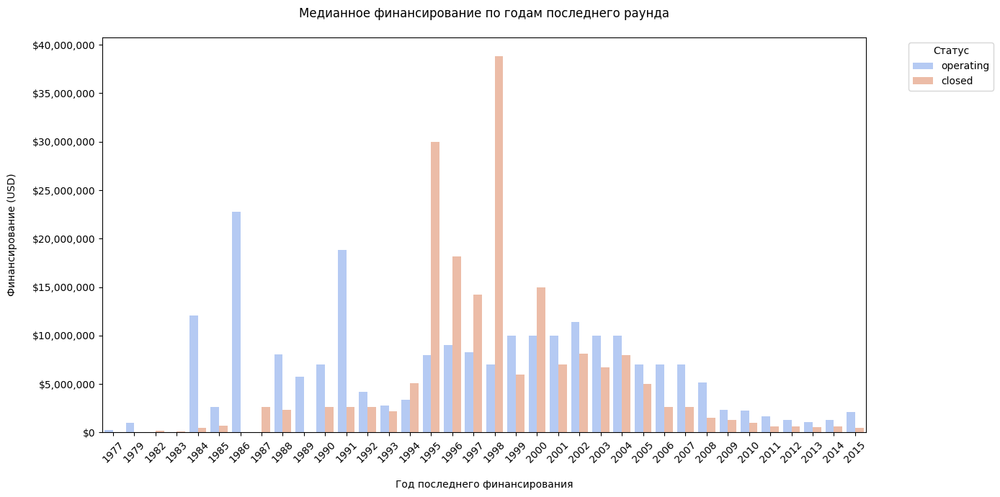

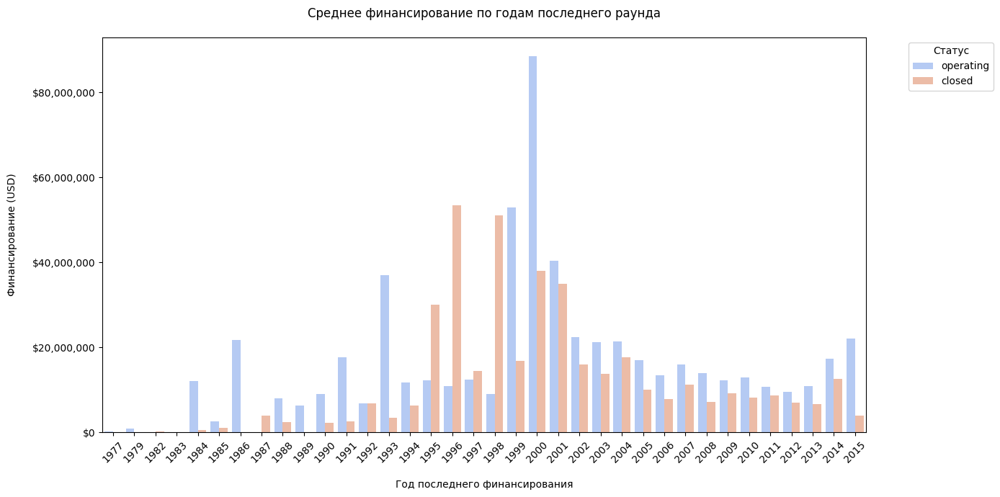

In [333]:
df_num_clear = df_train_num_dates[df_train_num_dates.funding_total_usd > 0]
median_data = df_num_clear.groupby(['last_funding_at_year', 'status'])['funding_total_usd'].median().reset_index()
mean = df_num_clear.groupby(['last_funding_at_year', 'status'])['funding_total_usd'].mean().reset_index()


def barplot_for_funding(data, x, y, title, xlabel):
    plt.figure(figsize=(14, 7))
    sns.barplot(
        data=data,
        x=x,
        y=y,
        hue='status',
        palette='coolwarm'
    )
    plt.title(title, pad=20)
    plt.xlabel(xlabel, labelpad=15)
    plt.ylabel('Финансирование (USD)', labelpad=15)
    plt.xticks(rotation=45)
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${x:,.0f}'))
    plt.legend(title='Статус', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    
titles = ['Медианное финансирование по годам последнего раунда', 'Среднее финансирование по годам последнего раунда']
xlabel = ['Год последнего финансирования', 'Год последнего финансирования']
x = 'last_funding_at_year'
y = 'funding_total_usd'
barplot_for_funding(median_data, x, y, titles[0], xlabel[0])
barplot_for_funding(mean, x, y, titles[1], xlabel[1])

In [334]:
max_med_fund = median_data[(median_data['last_funding_at_year']>=1995) & (median_data['last_funding_at_year']<=1998)].funding_total_usd.max()
min_med_fund = median_data[(median_data['last_funding_at_year']>=1995) &\
(median_data['last_funding_at_year']<=1998) & (median_data['funding_total_usd']!=0)].funding_total_usd.min()
print(max_med_fund, min_med_fund)

38832500.0 7000000.0


In [335]:
df_train_num_dates.query(f'(last_funding_at_year <= 1998) & (last_funding_at_year >= 1995) & (funding_total_usd <= {max_med_fund}) & (funding_total_usd >= {min_med_fund})')

,status,lifetime,days_first_invest,days_last_invest,first_funding_at_year,first_funding_at_weekday,first_funding_at_month,last_funding_at_year,last_funding_at_weekday,last_funding_at_month,...,days_last_invest_category,quat_f_fund,quat_l_fund,funding_total_usd,funding_rounds,country_code,city,div_day_life,funding_category,fin_x_cat_vs_day_x_round
1046,operating,8132,7427,7427,1997,4,8,1997,4,8,...,10+_years,7500.798315,7500.798315,7.000000e+06,1,unknown,unknown,3.910197,7,3.779999
1072,closed,6679,562,562,1998,6,11,1998,6,11,...,1.5-1.75_years,5957.617443,5957.617443,7.000000e+06,1,unknown,unknown,3.824711,7,3.865485
1514,operating,10927,7963,7963,1996,0,2,1996,0,2,...,10+_years,10475.979187,10475.979187,8.363946e+06,1,USA,Houston,4.038501,7,3.729008
3587,operating,7274,7001,7001,1998,3,10,1998,3,10,...,10+_years,6552.617443,6552.617443,9.000000e+06,1,DEU,Cologne,3.861773,7,3.937567
3928,operating,8550,8189,8189,1995,5,7,1995,5,7,...,10+_years,7919.160059,7919.160059,8.000000e+06,1,USA,Seattle,3.931966,7,3.816222
4182,operating,8370,6970,6970,1998,6,11,1998,6,11,...,10+_years,7648.617443,7648.617443,7.000000e+06,1,unknown,unknown,3.922725,7,3.767471
4377,operating,9100,7574,7574,1997,4,3,1997,4,3,...,10+_years,8648.798315,8648.798315,2.090000e+07,1,USA,Menlo Park,3.959041,8,4.264195
4944,operating,7463,6970,6970,1998,6,11,1998,6,11,...,10+_years,6741.617443,6741.617443,7.000000e+06,1,unknown,unknown,3.872913,7,3.817283
6322,operating,8370,8523,7792,1994,0,8,1996,3,8,...,10+_years,7739.340932,7738.979187,1.728430e+07,2,CHN,Beijing,3.922725,8,3.916986
7303,closed,1249,575,575,1998,4,5,1998,4,5,...,1.5-1.75_years,707.617443,707.617443,7.665000e+06,1,GBR,Twickenham,3.096562,7,4.633048


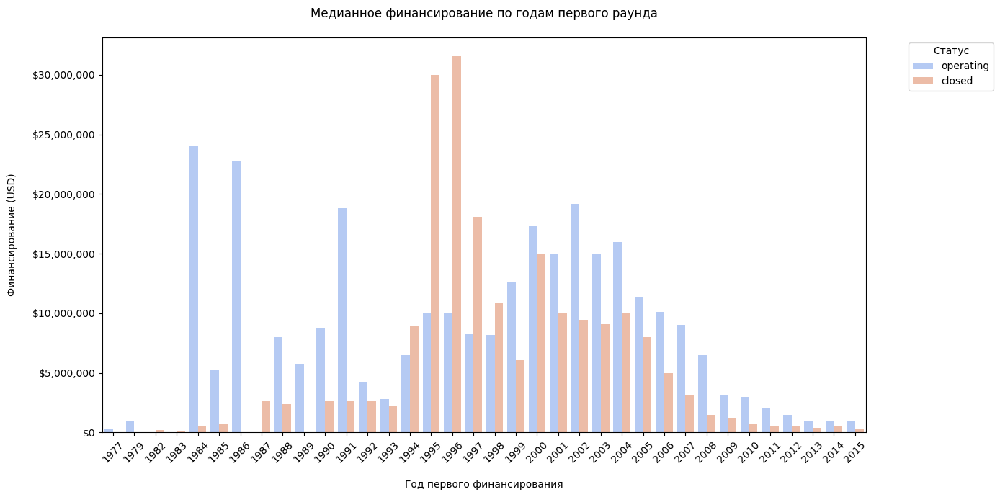

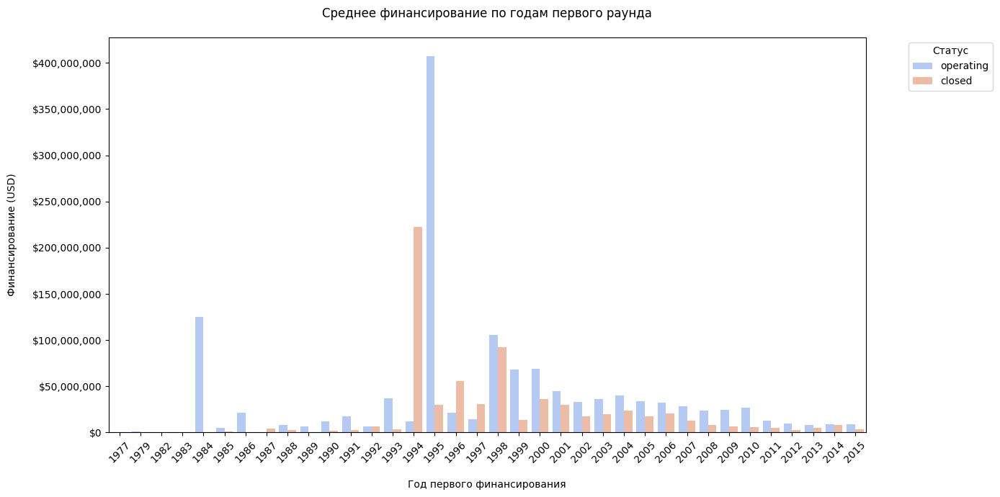

In [336]:
median_data = df_num_clear.groupby(['first_funding_at_year', 'status'])['funding_total_usd'].median().reset_index()
mean = df_num_clear.groupby(['first_funding_at_year', 'status'])['funding_total_usd'].mean().reset_index()
titles = ['Медианное финансирование по годам первого раунда', 'Среднее финансирование по годам первого раунда']
xlabel = ['Год первого финансирования', 'Год первого финансирования']
x = 'first_funding_at_year'
y = 'funding_total_usd'
barplot_for_funding(median_data, x, y, titles[0], xlabel[0])
barplot_for_funding(mean, x, y, titles[1], xlabel[1])

#### 3.2.2 Медианое, среднее распредеделение `funding_total_usd` в зависимости от `lifetime` и `status`

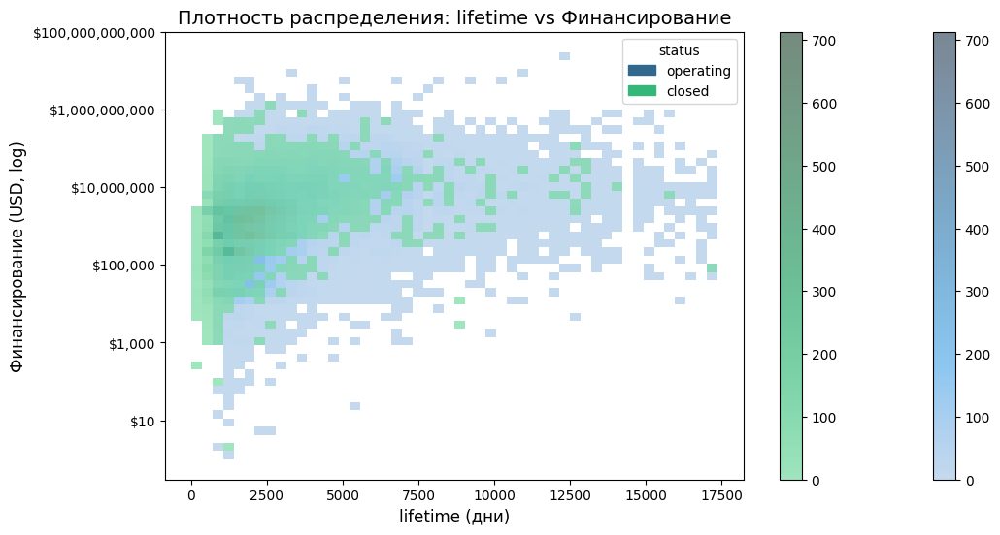

In [337]:
def plot_lifes_times(df,x, y='funding_total_usd'):
    plt.figure(figsize=(12, 6))

    sns.histplot(
        data=df,
        x=x,
        y=y,
        hue='status',
        palette='viridis',
        log_scale=(False, True),
        cbar=True,
        bins=50,
        alpha=0.7
    )
    plt.title(f'Плотность распределения: {x} vs Финансирование', fontsize=14)
    plt.xlabel(f'{x} (дни)', fontsize=12)
    plt.ylabel('Финансирование (USD, log)', fontsize=12)
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${x:,.0f}'))
    plt.show()
    
plot_lifes_times(df_num_clear, 'lifetime')


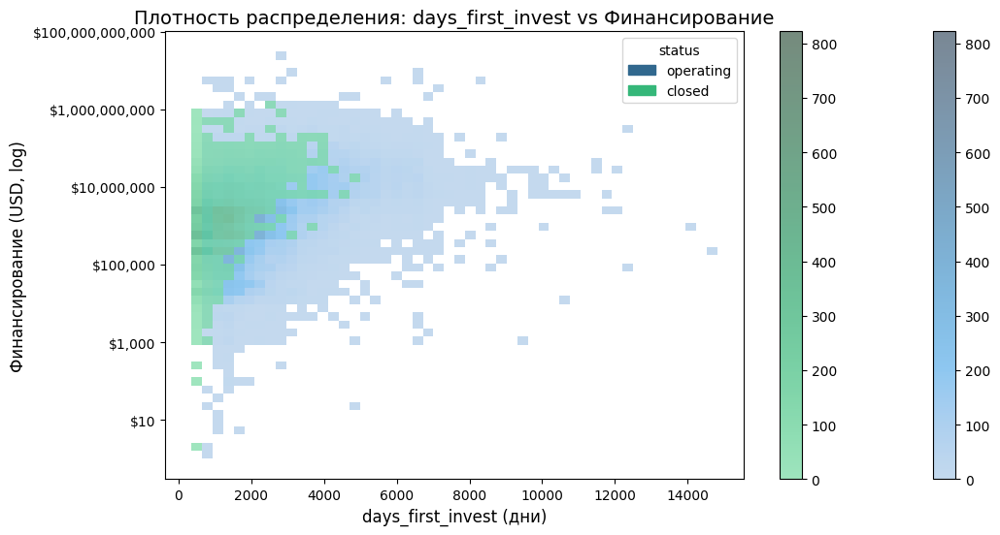

In [338]:
plot_lifes_times(df_num_clear, 'days_first_invest')

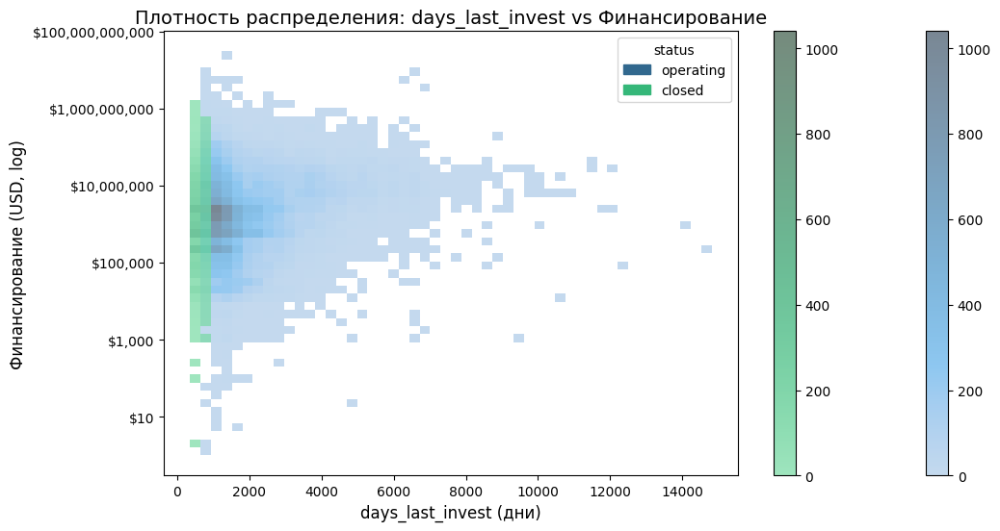

In [339]:
plot_lifes_times(df_num_clear, 'days_last_invest')

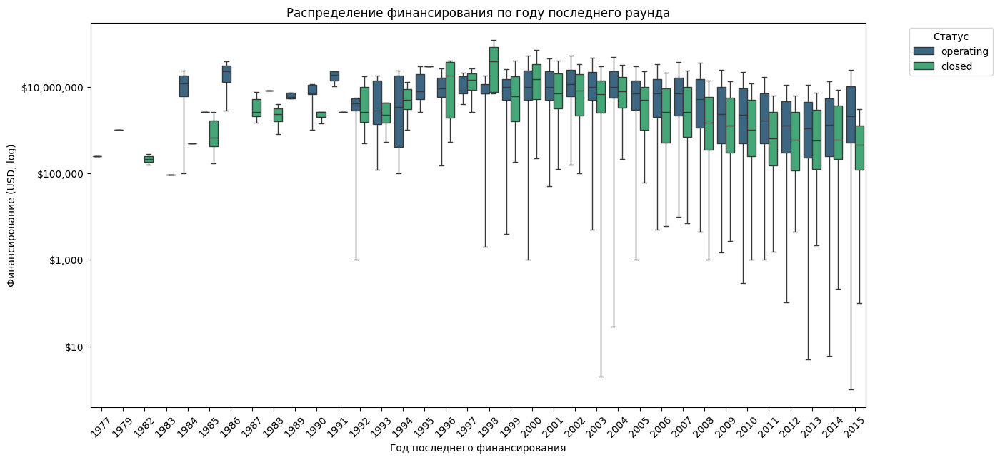

In [340]:
agg_data = df_num_clear.groupby(['first_funding_at_year', 'status'])['funding_total_usd'].median().reset_index()
plt.figure(figsize=(14, 7))
sns.boxplot(
    data=df_num_clear,
    x='last_funding_at_year',
    y='funding_total_usd',
    hue='status',
    palette='viridis',
    showfliers=False  # Игнорировать выбросы
)
plt.title('Распределение финансирования по году последнего раунда')
plt.xlabel('Год последнего финансирования')
plt.ylabel('Финансирование (USD, log)')
plt.yscale('log')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${x:,.0f}'))
plt.legend(title='Статус', bbox_to_anchor=(1.05, 1))
plt.show()

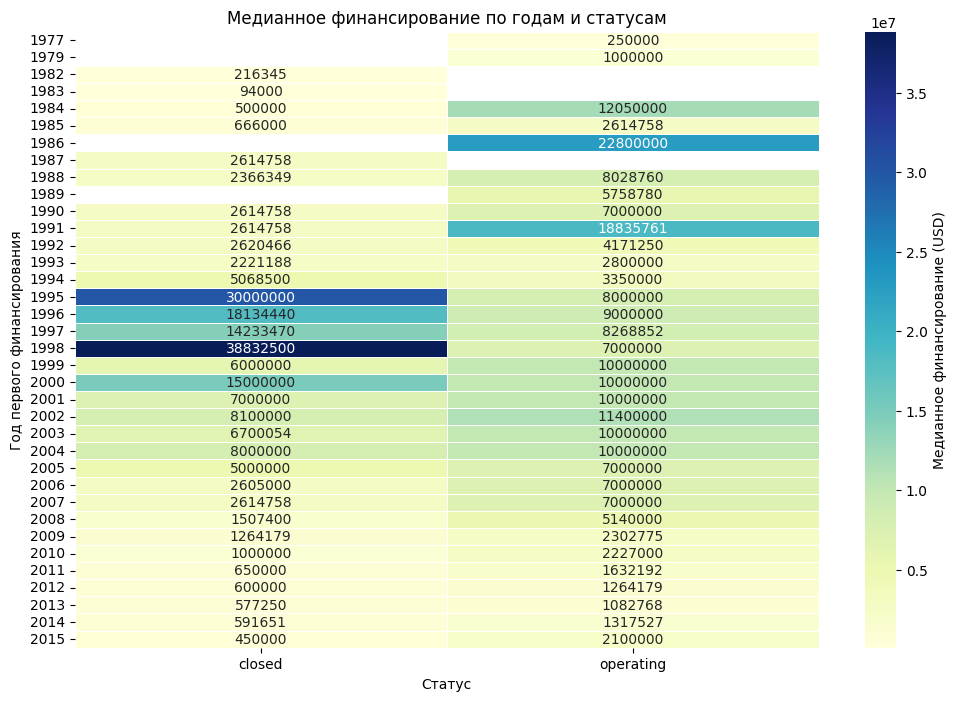

In [341]:
# Подготовка данных
heatmap_data = df_num_clear.pivot_table(
    index='last_funding_at_year',
    columns='status',
    values='funding_total_usd',
    aggfunc='median'
)

# График
plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt='.0f',
    cmap='YlGnBu',
    linewidths=0.5,
    cbar_kws={'label': 'Медианное финансирование (USD)'}
)
plt.title('Медианное финансирование по годам и статусам')
plt.xlabel('Статус')
plt.ylabel('Год первого финансирования')
plt.show()

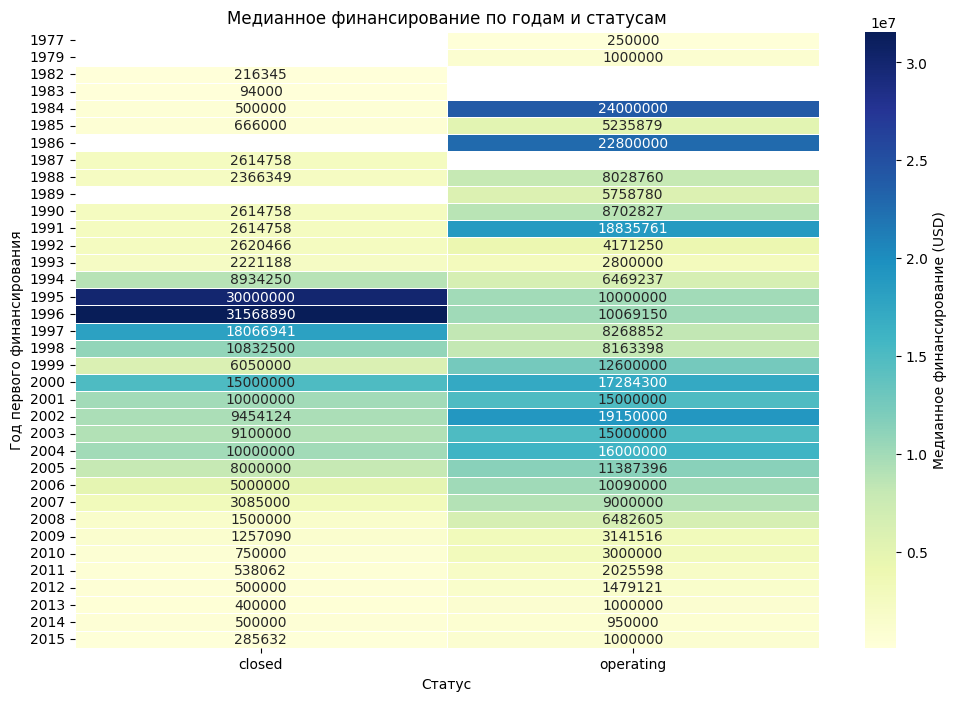

In [342]:
heatmap_data = df_num_clear.pivot_table(
    index='first_funding_at_year',
    columns='status',
    values='funding_total_usd',
    aggfunc='median'
)

# График
plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt='.0f',
    cmap='YlGnBu',
    linewidths=0.5,
    cbar_kws={'label': 'Медианное финансирование (USD)'}
)
plt.title('Медианное финансирование по годам и статусам')
plt.xlabel('Статус')
plt.ylabel('Год первого финансирования')
plt.show()

#### 3.2.3 Взаимосвязь `funding_rounds` и `lifetime` и `status`

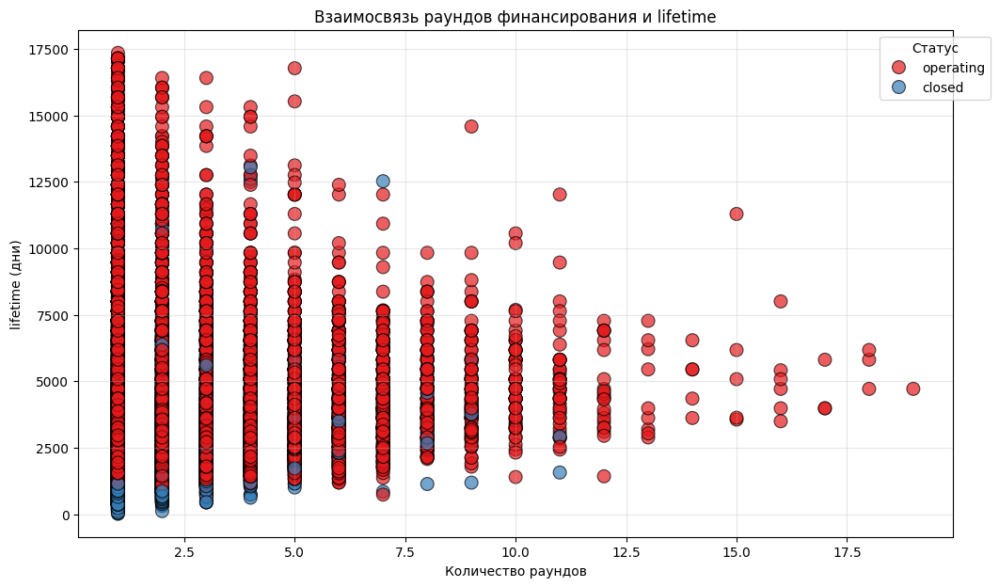

In [343]:
df_fund_clear = df_train_num_dates[df_train_num_dates.funding_rounds > 0]

def plot_scatter_live_vs_fund_rounds(df, y):
    plt.figure(figsize=(12, 7))
    sns.scatterplot(
        data=df_num_clear,
        x="funding_rounds",
        y=y,
        hue="status",
        palette="Set1",
        alpha=0.7,
        s=100,
        edgecolor="k"
    )
    plt.title(f"Взаимосвязь раундов финансирования и {y}")
    plt.xlabel("Количество раундов")
    plt.ylabel(f"{y} (дни)")
    plt.legend(title="Статус", bbox_to_anchor=(1.05, 1))
    plt.grid(alpha=0.3)
    plt.show()
plot_scatter_live_vs_fund_rounds(df_fund_clear, 'lifetime')

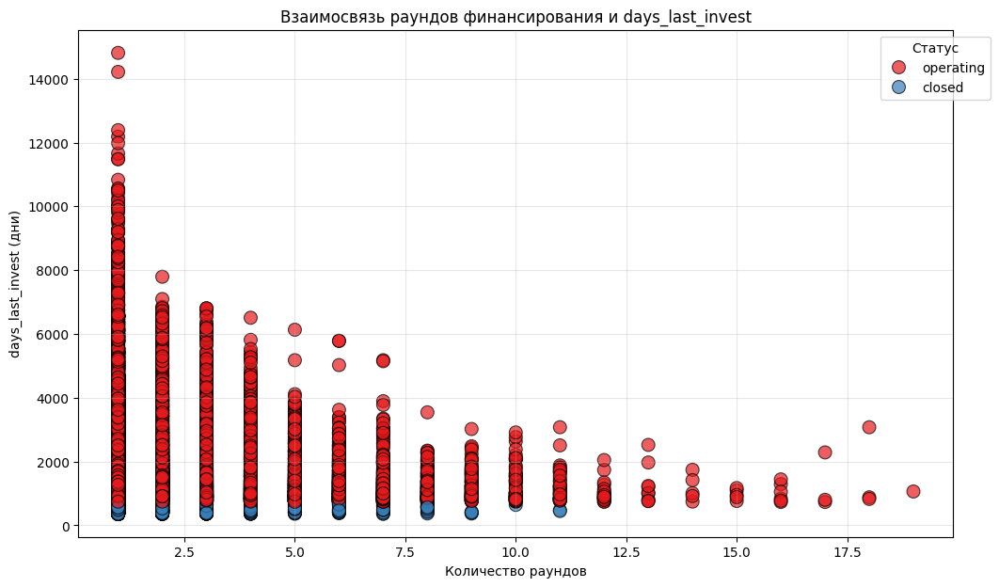

In [344]:
plot_scatter_live_vs_fund_rounds(df_fund_clear, 'days_last_invest')

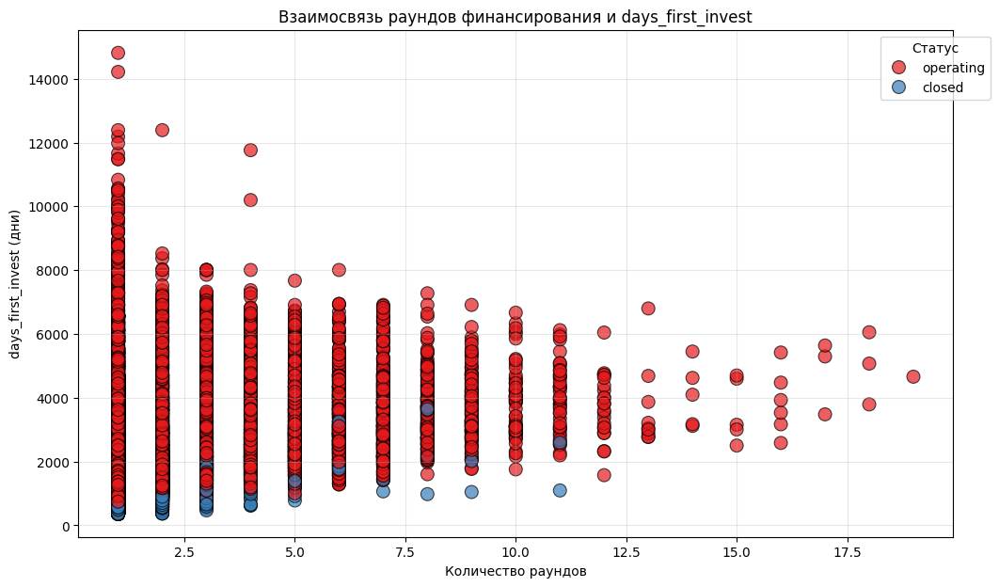

In [345]:
plot_scatter_live_vs_fund_rounds(df_fund_clear, 'days_first_invest')

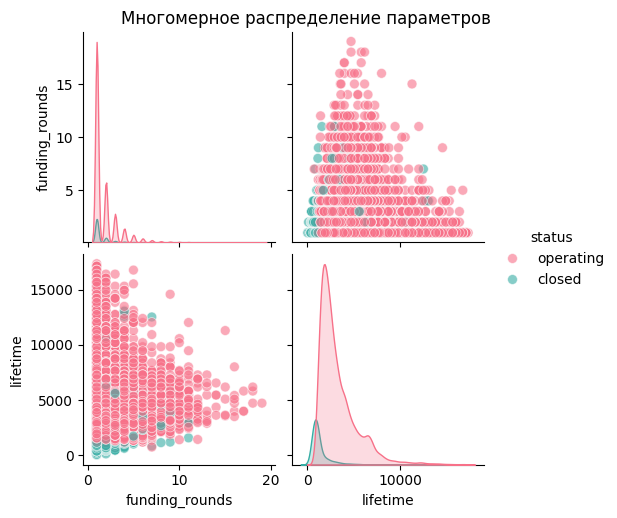

In [346]:
sns.pairplot(
    data=df_fund_clear,
    vars=["funding_rounds", "lifetime"],
    hue="status",
    palette="husl",
    diag_kind="kde",
    plot_kws={"alpha": 0.6, "s": 50}
)
plt.suptitle("Многомерное распределение параметров", y=1.02)
plt.show()

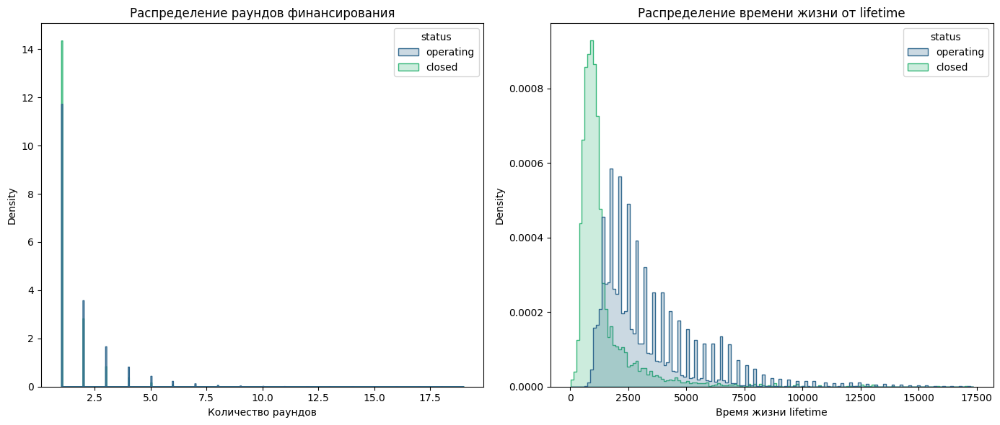

In [347]:
def plot_hist_for_fund_round_vs_life(df, x, ):
    plt.figure(figsize=(14, 6))

    # Гистограмма для funding_rounds
    plt.subplot(1, 2, 1)
    sns.histplot(
        data=df, 
        x="funding_rounds", 
        hue="status", 
        element="step", 
        stat="density", 
        common_norm=False, 
        palette="viridis"
    )
    plt.title("Распределение раундов финансирования")
    plt.xlabel("Количество раундов")
    
    # Гистограмма для lifetime
    plt.subplot(1, 2, 2)
    sns.histplot(
        data=df, 
        x=x, 
        hue="status", 
        element="step", 
        stat="density", 
        common_norm=False, 
        palette="viridis"
    )
    plt.title(f"Распределение времени жизни от {x}")
    plt.xlabel(f"Время жизни {x}")
    
    plt.tight_layout()
    plt.show()

plot_hist_for_fund_round_vs_life(df_fund_clear, 'lifetime')

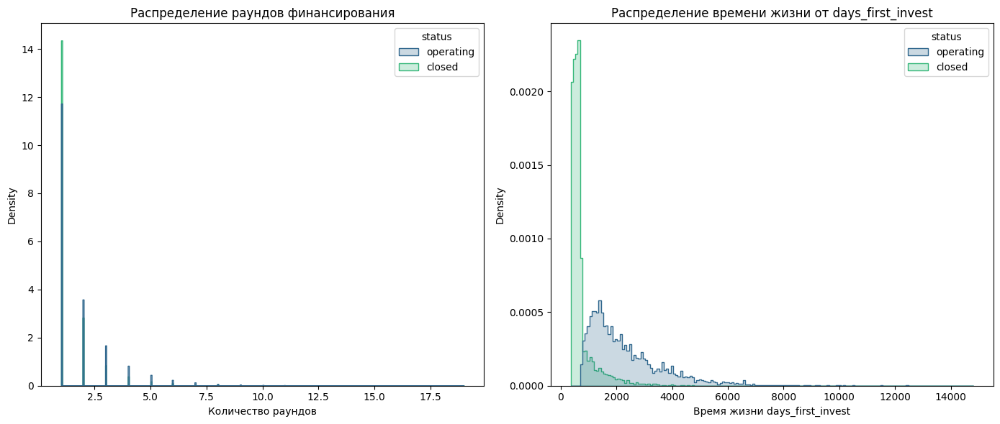

In [348]:
plot_hist_for_fund_round_vs_life(df_fund_clear, 'days_first_invest')

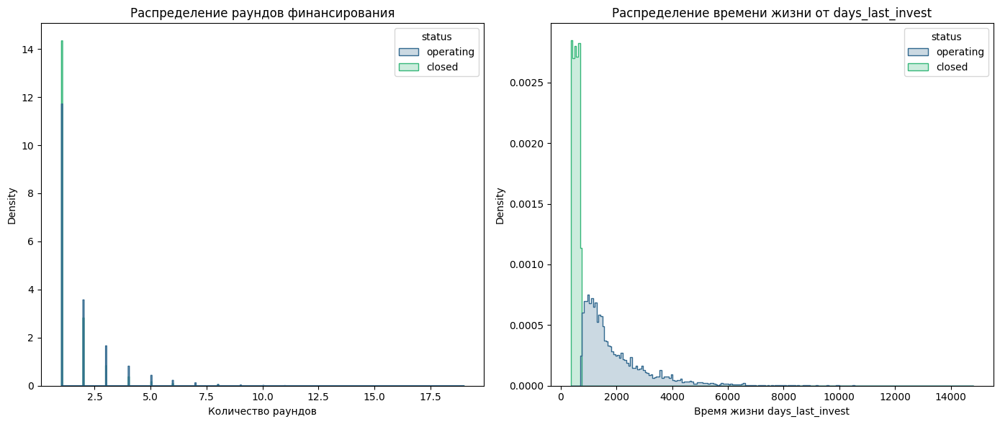

In [349]:
plot_hist_for_fund_round_vs_life(df_fund_clear, 'days_last_invest')

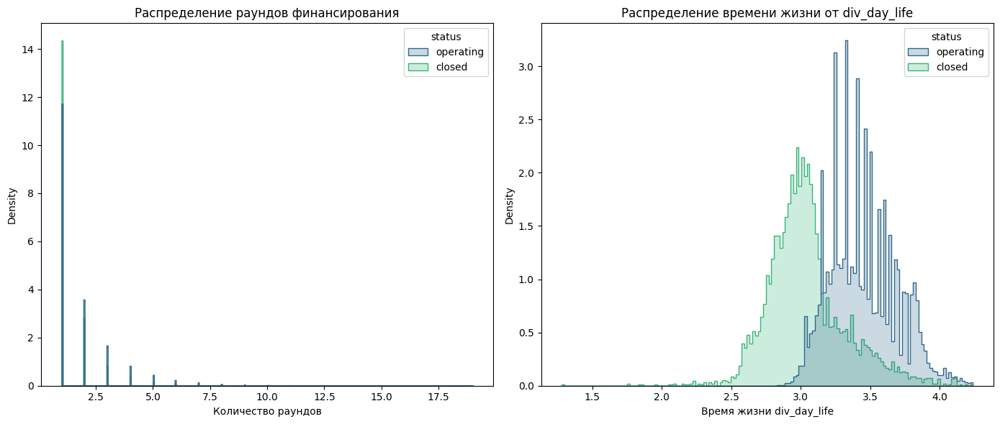

In [350]:
df_fund_clear_cp = df_fund_clear.copy()
df_fund_clear_cp['div_day_life'] = np.log10(df_fund_clear.lifetime) 
plot_hist_for_fund_round_vs_life(df_fund_clear_cp, 'div_day_life')

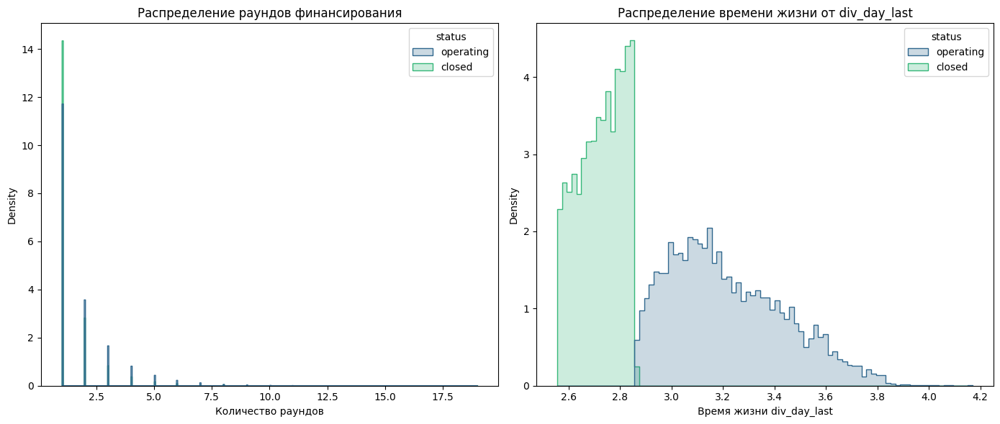

In [351]:
df_fund_clear_cp['div_day_last'] = np.log10(df_fund_clear.days_last_invest) 
plot_hist_for_fund_round_vs_life(df_fund_clear_cp, 'div_day_last')

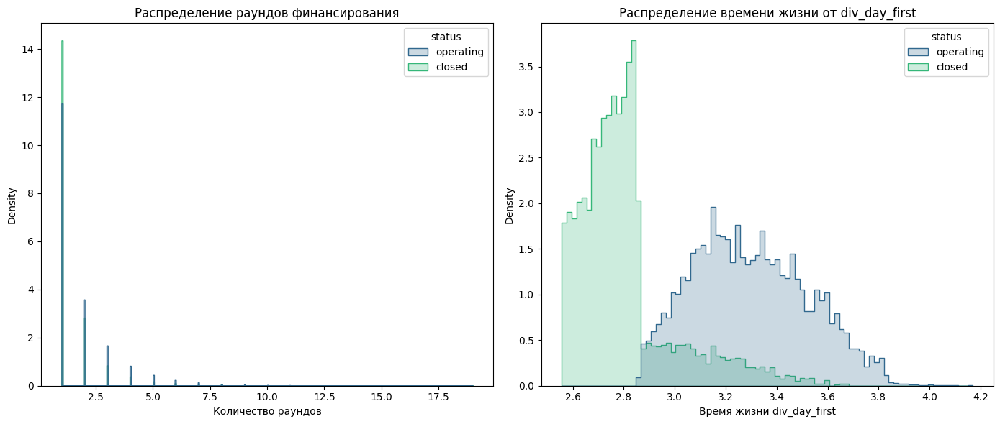

In [352]:
df_fund_clear_cp['div_day_first'] = np.log10(df_fund_clear.days_first_invest) 
plot_hist_for_fund_round_vs_life(df_fund_clear_cp, 'div_day_first')

#### 3.2.4 Ранжирование `funding_total_usd` и рассмотрение его соотношений с `lifetime` колонками и `status`

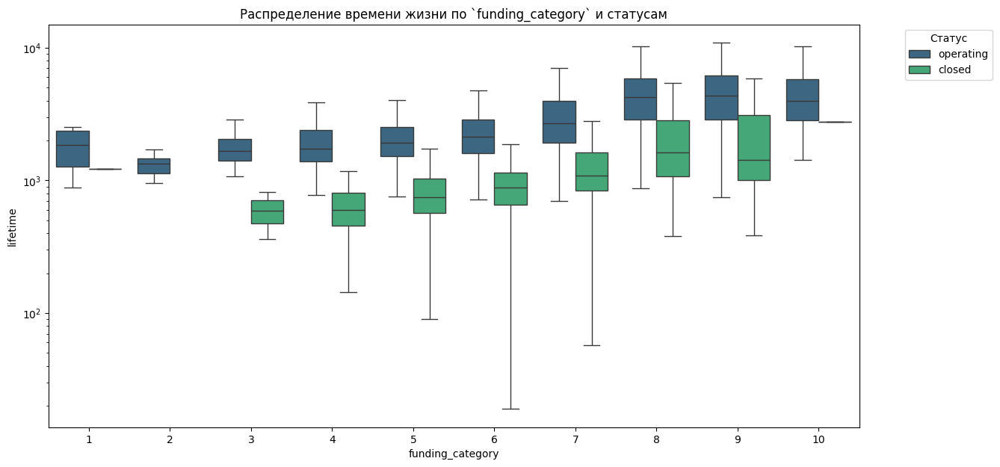

In [353]:
def plot_box_fund_cat_vs_life(df, x, y):
    plt.figure(figsize=(14, 7))
    sns.boxplot(
        data=df,
        x=x,
        y=y,
        hue='status',
        palette='viridis',
        showfliers=False  # Игнорировать выбросы
    )
    plt.title(f'Распределение времени жизни по `{x}` и статусам')
    plt.xlabel(f'{x}')
    plt.ylabel(f'{y}')
    plt.yscale('log')  # Логарифмическая шкала для Y
    plt.legend(title='Статус', bbox_to_anchor=(1.05, 1))
    plt.show()

plot_box_fund_cat_vs_life(df_fund_clear_cp, 'funding_category', 'lifetime')

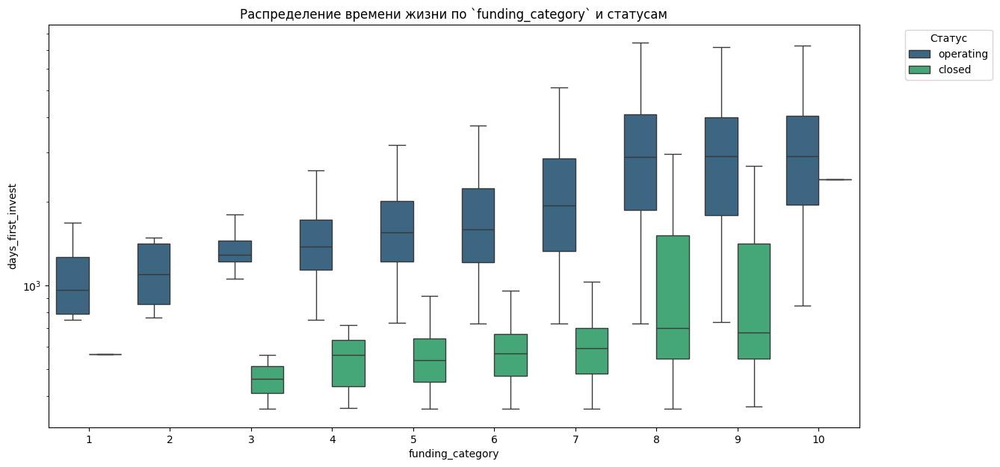

In [354]:
plot_box_fund_cat_vs_life(df_fund_clear_cp, 'funding_category', 'days_first_invest')

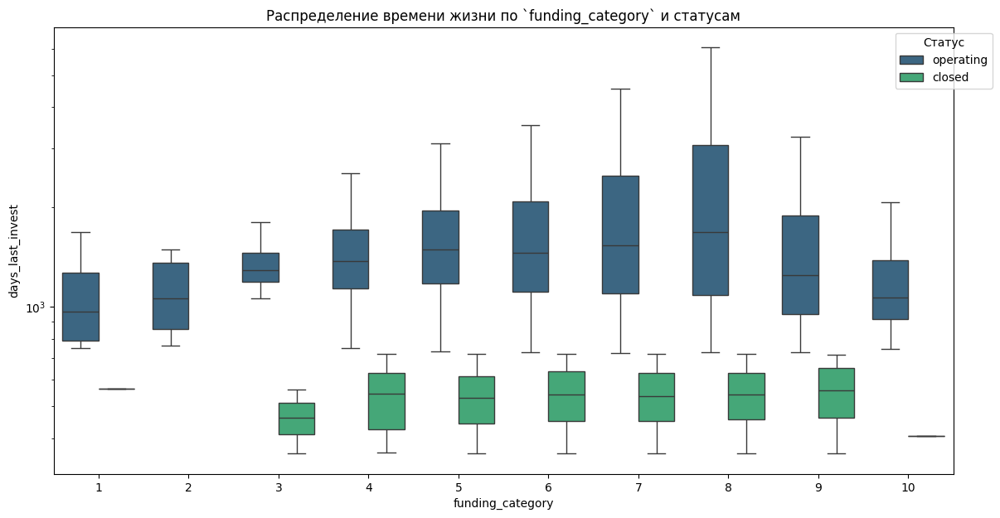

In [355]:
plot_box_fund_cat_vs_life(df_fund_clear_cp, 'funding_category', 'days_last_invest')

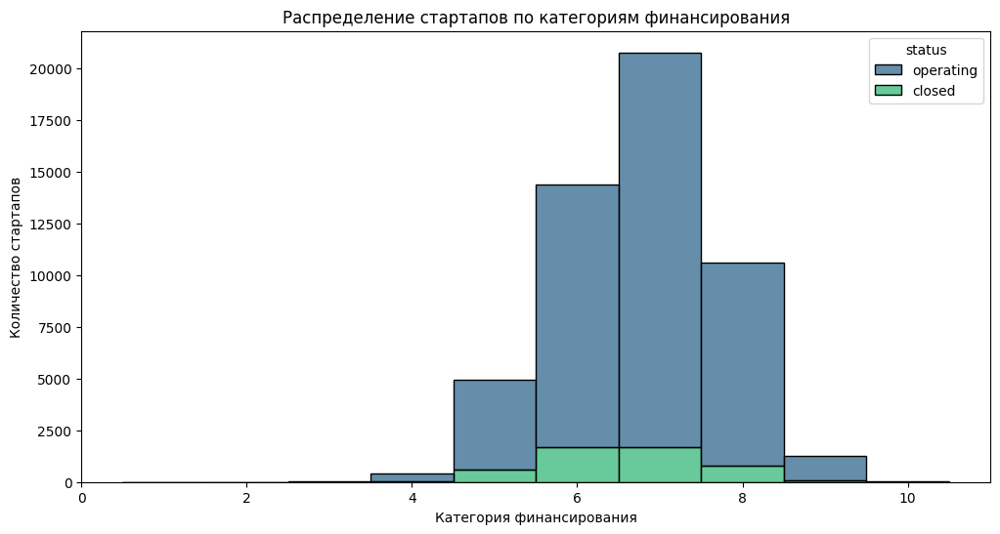

In [356]:
plt.figure(figsize=(12, 6))
sns.histplot(
    data=df_fund_clear_cp,
    x='funding_category',
    hue='status',
    multiple='stack',
    palette='viridis',
    bins=10,
    discrete=True
)
plt.title('Распределение стартапов по категориям финансирования')
plt.xlabel('Категория финансирования')
plt.ylabel('Количество стартапов')
plt.show()

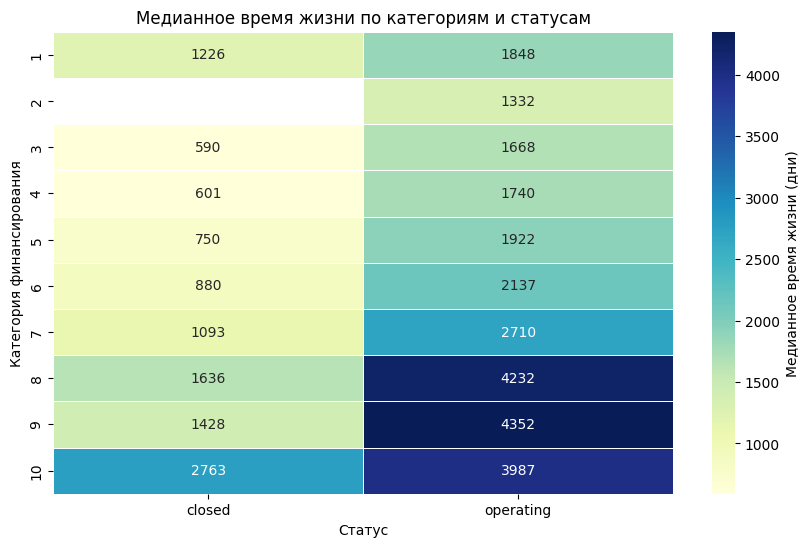

In [357]:
# Агрегация данных
heatmap_data = df_fund_clear_cp.pivot_table(
    index='funding_category',
    columns='status',
    values='lifetime',
    aggfunc='median'
)

# Визуализация
plt.figure(figsize=(10, 6))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt='.0f',
    cmap='YlGnBu',
    linewidths=0.5,
    cbar_kws={'label': 'Медианное время жизни (дни)'}
)
plt.title('Медианное время жизни по категориям и статусам')
plt.xlabel('Статус')
plt.ylabel('Категория финансирования')
plt.show()

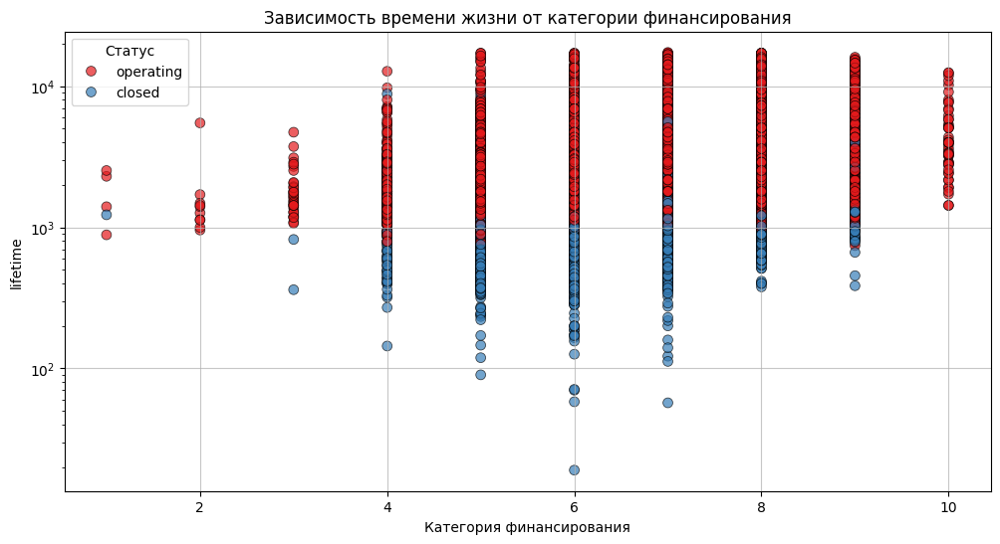

In [358]:
def plot_scatter_fund_cat_vs_life(df, x, y):
    plt.figure(figsize=(12, 6))
    sns.scatterplot(
        data=df,
        x=x,
        y=y,
        hue='status',
        palette='Set1',
        alpha=0.7,
        s=50,
        edgecolor='k'
    )
    plt.title('Зависимость времени жизни от категории финансирования')
    plt.xlabel('Категория финансирования')
    plt.ylabel(f'{y}')
    plt.yscale('log')
    plt.grid(alpha=0.7)
    plt.legend(title='Статус')
    plt.show()
plot_scatter_fund_cat_vs_life(df_fund_clear_cp, 'funding_category', 'lifetime')

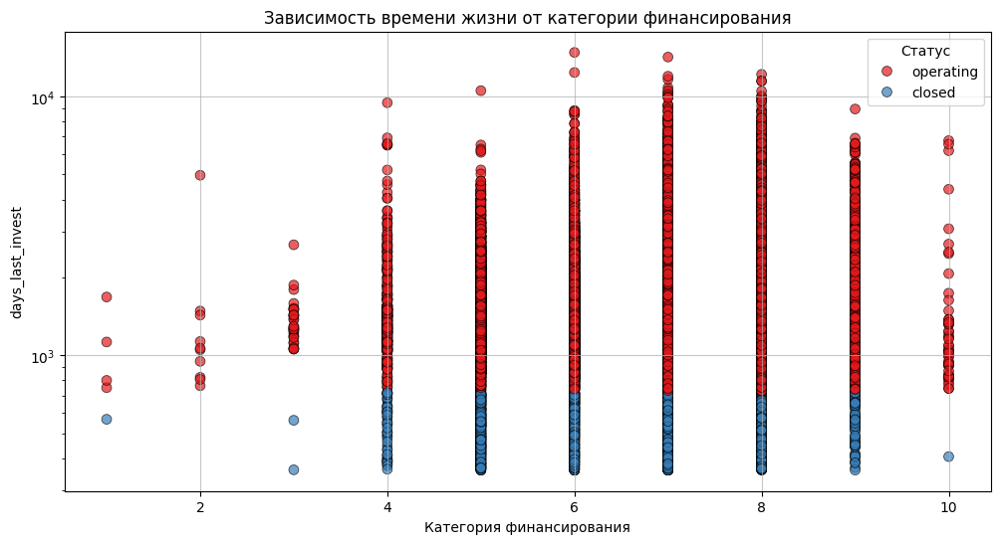

In [359]:
plot_scatter_fund_cat_vs_life(df_fund_clear_cp, 'funding_category', 'days_last_invest')

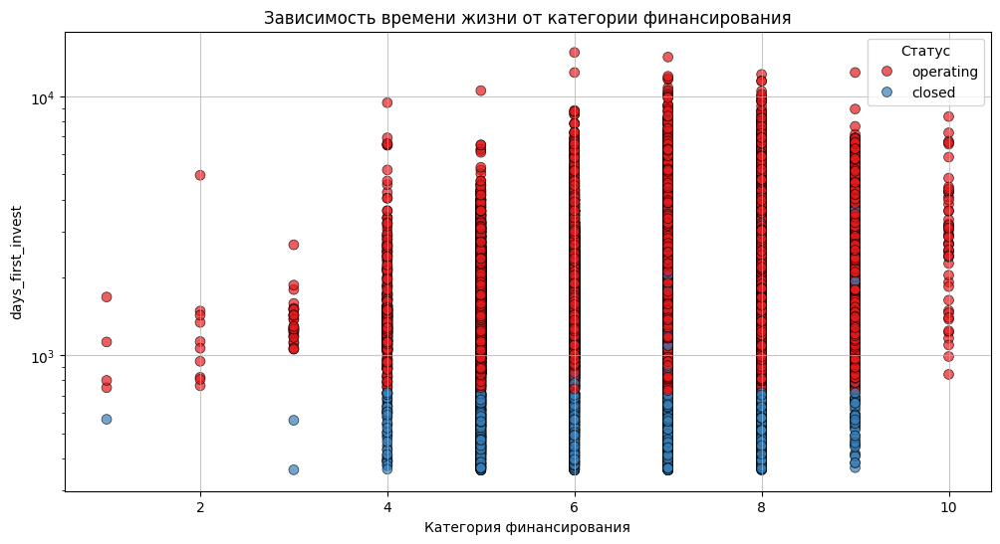

In [360]:
plot_scatter_fund_cat_vs_life(df_fund_clear_cp, 'funding_category', 'days_first_invest')

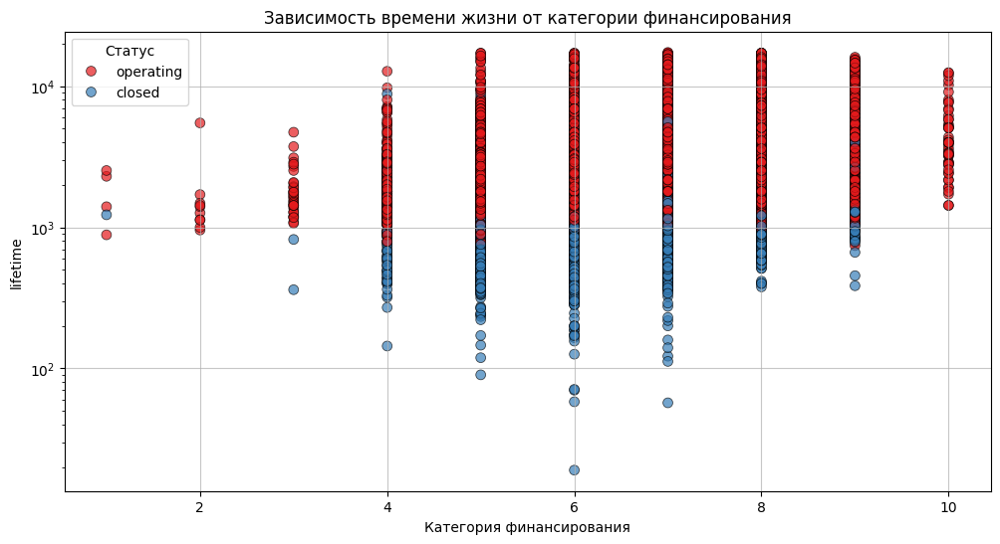

In [361]:
plot_scatter_fund_cat_vs_life(df_fund_clear_cp, 'funding_category', 'lifetime')

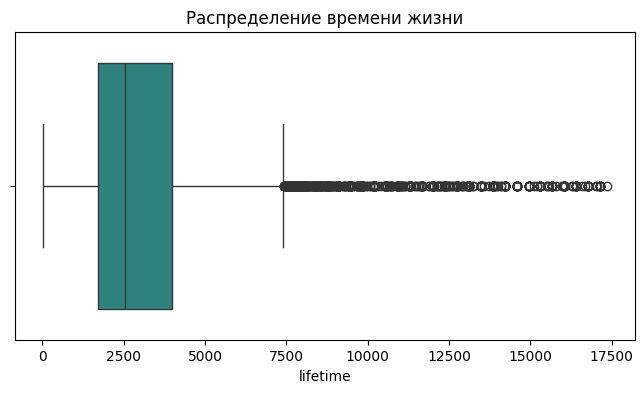

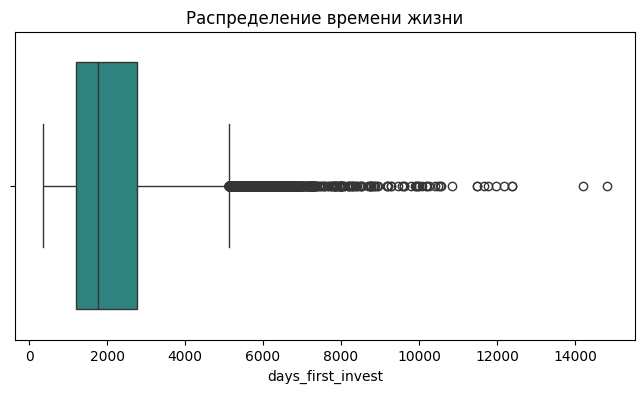

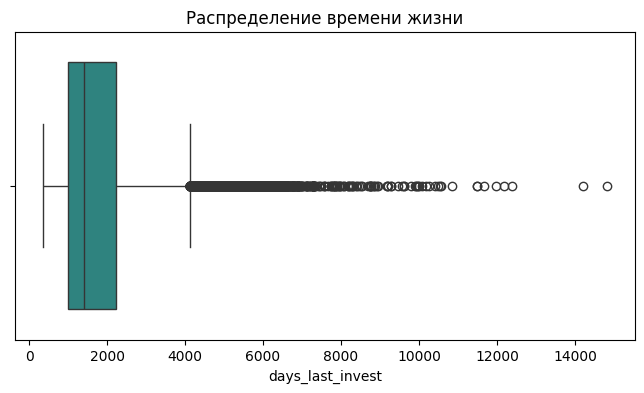

In [362]:
for col in ['lifetime', 'days_first_invest', 'days_last_invest']:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=df_fund_clear_cp, x=col, palette='viridis')
    plt.title('Распределение времени жизни')
    plt.show()
 
    q95 = df_fund_clear_cp[col].quantile(0.95)
    df_filtered = df_fund_clear_cp[df_fund_clear_cp[col] <= q95]

interval columns not set, guessing: ['range_year', 'range_days', 'funding_category', 'funding_rounds', 'lifetime', 'div_day_life', 'fin_x_cat_vs_day_x_round']


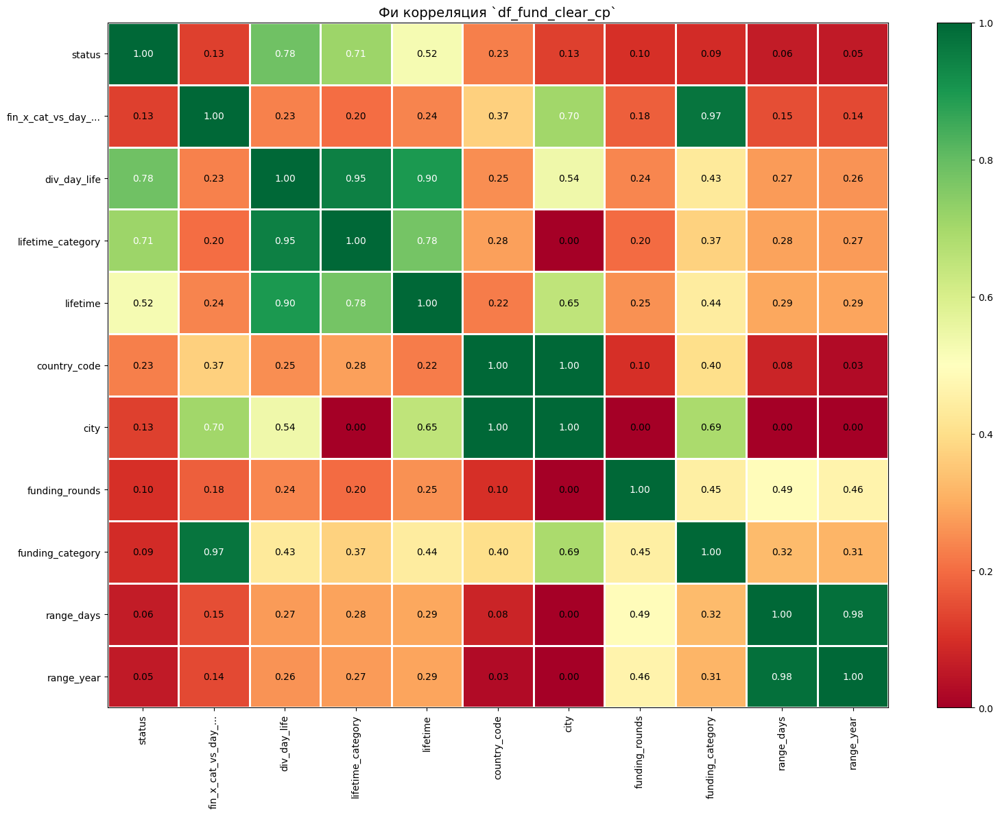

In [363]:
cols_for_watch = ['range_year', 'range_days', 'funding_category',
       'funding_rounds', 'city', 'country_code',
       'lifetime', 'lifetime_category', 'div_day_life','fin_x_cat_vs_day_x_round', 'status']
phik_date = df_fund_clear_cp[cols_for_watch].sample(50000).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_fund_clear_cp`',fontsize_factor=1,
                        figsize=(16,12))
plt.tight_layout()

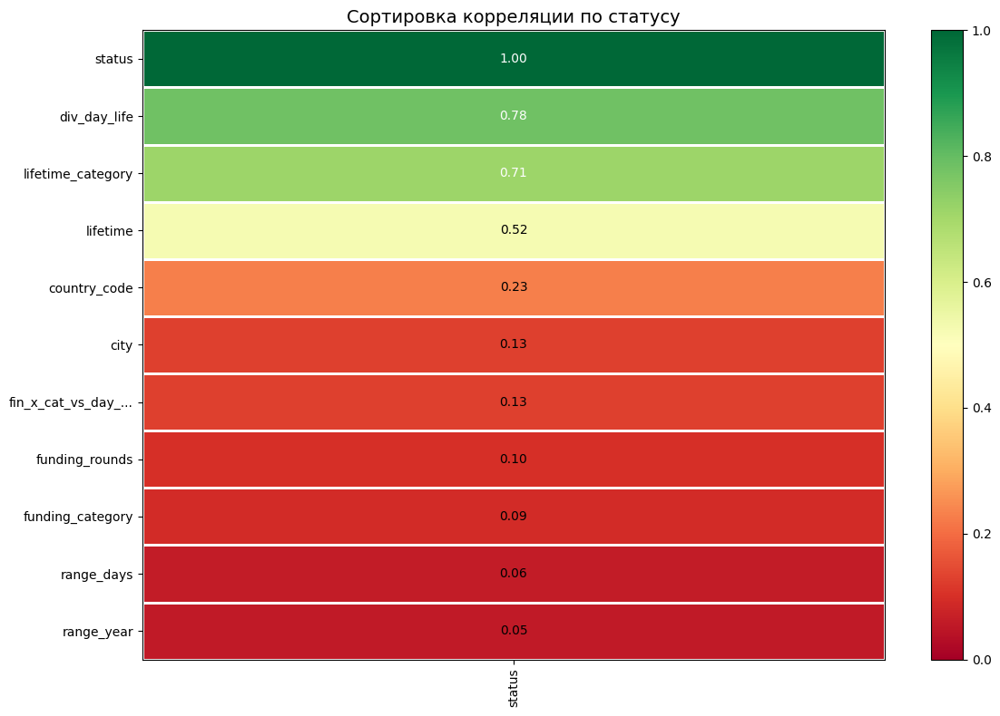

In [364]:
phik_date_status = phik_date[['status']].sort_values(ascending=True,by='status')
plot_correlation_matrix(phik_date_status.values, x_labels=phik_date_status.columns, y_labels=phik_date_status.index, 
                        vmin=0, vmax=1, title=r'Сортировка корреляции по статусу', 
                        fontsize_factor=1, figsize=(12,8))

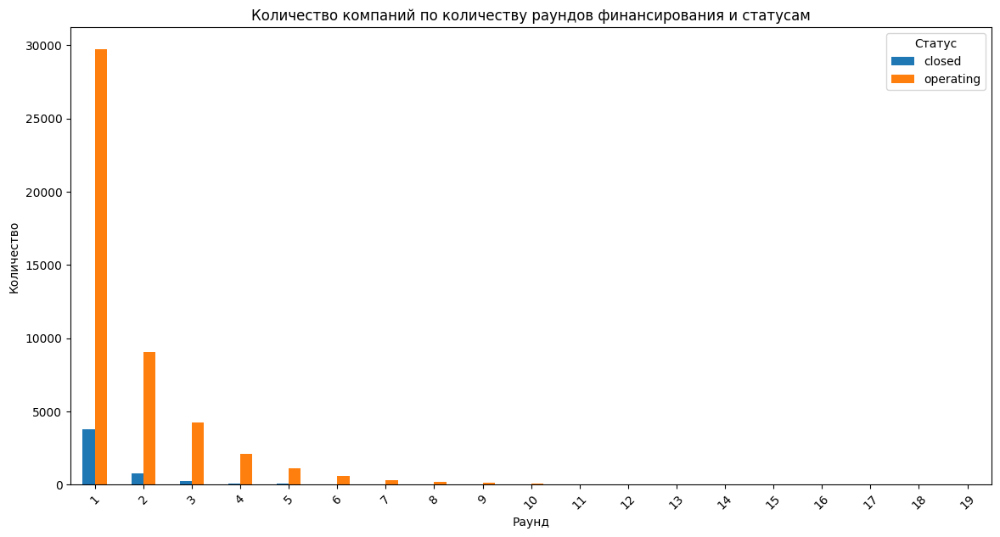

In [365]:
counts = df_fund_clear_cp.groupby(['funding_rounds', 'status']).size().unstack().fillna(0)
counts.plot(kind='bar', figsize=(14, 7))
plt.title('Количество компаний по количеству раундов финансирования и статусам')
plt.xlabel('Раунд')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.legend(title='Статус')
plt.show()

#### 3.2.5  Распределение статусов по годам/месяцам инвестиций

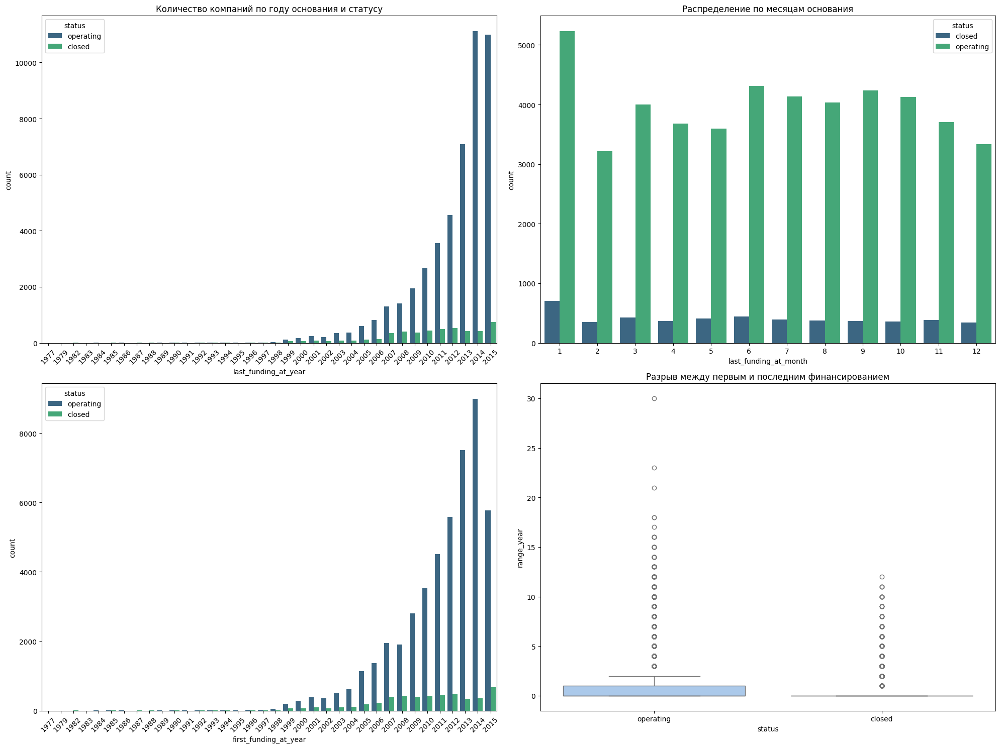

In [366]:
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# Основание по годам
sns.countplot(data=df_fund_clear_cp, x='last_funding_at_year', hue='status', ax=axes[0,0], palette='viridis')
axes[0,0].set_title('Количество компаний по году основания и статусу')
axes[0,0].tick_params(axis='x', rotation=45)

# Основание по месяцам
sns.countplot(data=df_fund_clear_cp, x='last_funding_at_month', hue='status', ax=axes[0,1], palette='viridis')
axes[0,1].set_title('Распределение по месяцам основания')

# Первое финансирование по годам
sns.countplot(data=df_fund_clear_cp, x='first_funding_at_year', hue='status', ax=axes[1,0], palette='viridis')
axes[1,0].tick_params(axis='x', rotation=45)

# Разница между первым и последним финансированием (range_year)
sns.boxplot(data=df_fund_clear_cp, x='status', y='range_year', ax=axes[1,1], palette='pastel')
axes[1,1].set_title('Разрыв между первым и последним финансированием')

plt.tight_layout()
plt.show()

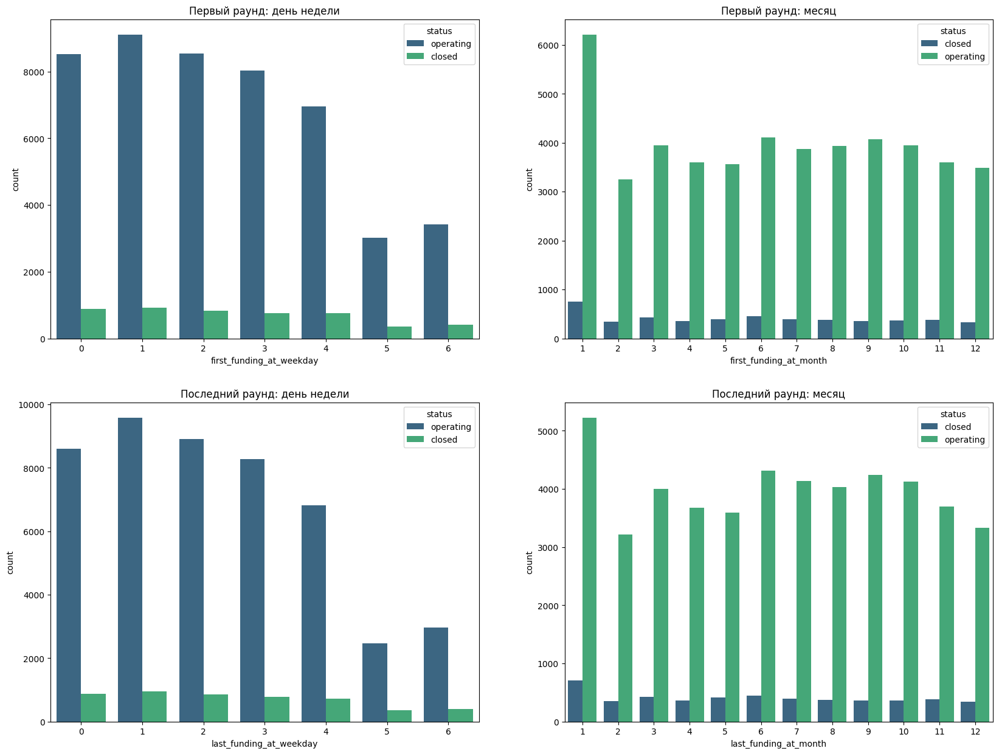

In [367]:
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# День недели первого финансирования
sns.countplot(data=df_fund_clear_cp, x='first_funding_at_weekday', hue='status', ax=axes[0,0],  palette='viridis')
axes[0,0].set_title('Первый раунд: день недели')

# Месяц первого финансирования
sns.countplot(data=df_fund_clear_cp, x='first_funding_at_month', hue='status', ax=axes[0,1], palette='viridis')
axes[0,1].set_title('Первый раунд: месяц')

# День недели последнего финансирования
sns.countplot(data=df_fund_clear_cp, x='last_funding_at_weekday', hue='status', ax=axes[1,0], palette='viridis')
axes[1,0].set_title('Последний раунд: день недели')

# Месяц последнего финансирования
sns.countplot(data=df_fund_clear_cp, x='last_funding_at_month', hue='status', ax=axes[1,1], palette='viridis')
axes[1,1].set_title('Последний раунд: месяц')
plt.show()

#### 3.2.6 Вывод по числовым данным 
- Данные колонки `status` хорошо разделяются по funding_rounds вместе с `lifetime`;

- Большинство категорий финансирования с меткой `close` в `[5, 6, 7, 8]` категориях:

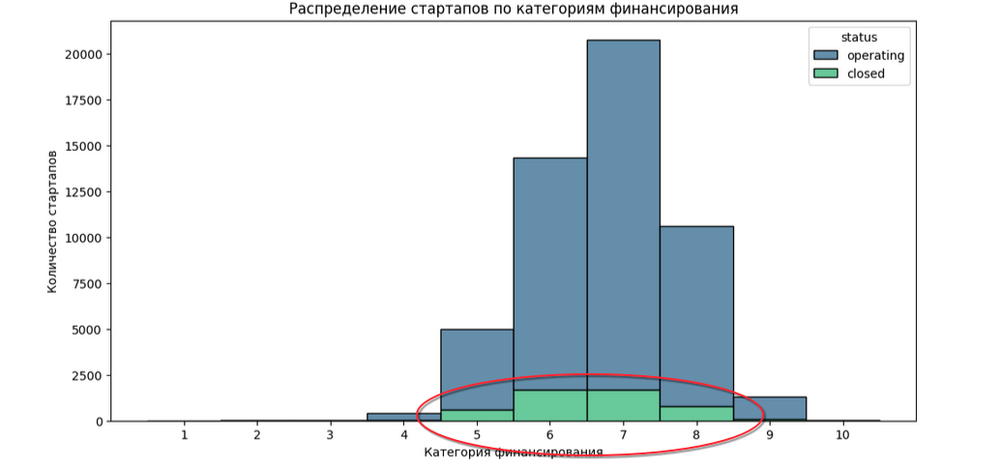

- При ранжирование колонки `funding_total_usd` на `funding category` с `lifetime` можно проследить границу разделение до 3-ей категории финансирования, но основные категории с меткой `close` неаходятся на других категориях финансирования, хотя в среднем разбиение всё же присутствует, возможно стоит посмотреть на взаимодействие с funding_round



- 'fin_x_cat_vs_day_x_round' не имеет сильной корреляции с целевой, возможно, эти признак имеет нелинейные зависимости. 


### 3.3 Анализ обработка и подготовка категориальных данных 

- category_list - Список категорий, к которым относится стартап
- country_code - Код страны
- state_code - Код штата
- region - Регион
- city - Город

In [368]:

class FeatureGenFull(FeatureGenDateNum):
    
    
    def __init__(self, df:pd.DataFrame):
        super().__init__(df)
        self.categorical_cols = ['category_list', 'country_code', 'state_code', 'region', 'city'] 
         

    def create_category_list(self):
        self.raw_df.category_list = self.raw_df.category_list.fillna('unknown')
        df = self.raw_df.copy()
        # Подсчет частоты категорий
        category_counts = (
            df['category_list']
            .str.split('|', expand=True)
            .stack()
            .value_counts()
        )
        
        # Определение квантилей для более сбалансированного разделения
        quantiles = category_counts.quantile([0.1, 0.3, 0.6, 0.9]).tolist()
        bins = [0] + quantiles + [category_counts.max() + 1]
        labels = [
            'крайне редкие', 
            'редкие', 
            'средние', 
            'частые', 
            'очень частые'
        ]
        
        # Назначение новых бинов
        category_bins = pd.cut(
            category_counts, 
            bins=bins, 
            labels=labels, 
            right=False
        )
        
        # Маппинг для исходных данных
        bin_mapping = category_bins.to_dict()
        df['category_bins'] = df['category_list'].apply(
            lambda x: '|'.join(sorted({bin_mapping.get(c, 'unknown') for c in x.split('|')})) 
            if pd.notna(x) else 'unknown'
        )
        self.df_date['category_bins'] = df['category_bins'].copy()

    def create_feature_from_cat_list(self, get_feature=False):
        
        words = self.df_date.category_bins.unique()
        bin_dict = {word: index + 1 for index, word in enumerate(words)}
        self.df_date['category_bins'] = self.df_date['category_bins'].map(bin_dict)
        
        self.df_date['category_bins_days_last_invest'] = (np.log(self.df_date.days_last_invest - self.df_date['category_bins']) *
        np.log(self.df_date.lifetime / self.df_date['funding_category'])) + self.df_date['category_bins']
        
        # Для связки категориальных и числовых признаков 
        self.df_date['category_funding_interaction'] = self.df_date['category_bins'] * np.log1p(self.df_date['funding_total_usd'])
        self.df_date['category_lifetime_ratio'] = self.df_date['category_bins'] / self.df_date['lifetime']

        self.df_date['funding_velocity'] = self.df_date['funding_total_usd'] / (self.df_date['funding_rounds'] + 1)
        self.df_date['round_per_year'] = self.df_date['funding_rounds'] / (self.df_date['lifetime']/365 + 1)
        self.df_date['round_per_month'] = self.df_date['funding_rounds'] / (self.df_date['lifetime']/30)
        
        if get_feature:
            return self.df_date['category_bins_days_last_invest']

    def create_feature_country(self): 
        
        self.raw_df.country_code = self.raw_df.country_code.fillna('unknown')
        self.df = self.raw_df.copy()
        
        country_counts = self.df["country_code"].value_counts()
        rare_countries = country_counts[country_counts < 50].index
        self.df["country_code_processed"] = self.df["country_code"].replace(rare_countries, "Other")
        self.df["country_code_processed"] = self.df["country_code_processed"].copy()
        country_dummies = pd.get_dummies(self.df["country_code_processed"], prefix="country")  
        self.df = pd.concat([self.df, country_dummies], axis=1)
        
        if 'status' in self.raw_df.columns: 
            self.df["status_numeric"] = self.df["status"].map({"operating": 0, "closed": 1})
            country_target_mean = self.df.groupby("country_code_processed")["status_numeric"].mean().to_dict()
            self.map_for_countries = country_target_mean.copy()
            
        self.df["country_target_encoded"] = self.df["country_code_processed"].map(self.map_for_countries)
        self.df["lifetime"] = self.df_date["lifetime"].copy()
        
        self.df_date["country_target_encoded"] = self.df["country_target_encoded"].copy()
        self.df_date["country_x_funding"] = (self.df["country_target_encoded"] * np.log1p(self.df_date["funding_total_usd"])) / self.df["lifetime"] 
        self.df_date["country_x_lifetime"] = self.df["country_target_encoded"] * np.log1p(self.df["lifetime"])

        self.df_date['country_funding_per_day'] = self.df["country_target_encoded"] * self.df_date['funding_total_usd'] / self.df_date['lifetime']
        
    def create_feature_state_code(self): 
        
        self.raw_df.state_code = self.raw_df.state_code.fillna('unknown')
        
        state_counts =  self.raw_df.state_code.value_counts(normalize=True)
        rare_states = state_counts[state_counts < 0.01].index
        self.df_date['state_code_processed'] =  self.raw_df.state_code.replace(rare_states, 'Other')

    def create_feature_region(self):
        # Заполнение пропусков
        self.raw_df['region'] = self.raw_df['region'].fillna('Unknown')
        region_counts = self.raw_df['region'].value_counts(normalize=True)
        rare_regions = region_counts[region_counts < 0.01].index
        self.df_date['region_processed'] = self.raw_df['region'].replace(rare_regions, 'Other')

    def create_feature_city(self):
        
        self.raw_df['city'] = self.raw_df['city'].fillna('Unknown')
        self.raw_df['city'] = self.raw_df['city'].str.lower()  
        self.raw_df['city'] = self.raw_df['city'].str.replace(r"[^a-zа-я\s]", "", regex=True).str.strip()
        city_counts = self.raw_df['city'].value_counts(normalize=True)
        rare_cities = city_counts[city_counts < 0.001].index
        self.df_date['city_processed'] = self.raw_df['city'].replace(rare_cities, "other")
        
    def create_categorical_features(self): 
        
        self.create_category_list()
        
        self.create_feature_from_cat_list()

        self.create_feature_country()
        
        self.create_feature_state_code()
        
        self.create_feature_region()
        
        self.create_feature_city()

    def generate_all_feature_train(self): 

        self.train_date_create_cols()

        self.append_num_cols()

        self.create_categorical_features()

        
    def generate_all_feature_test(self):
        self.create_date_cols_for_test()
        self.append_num_cols()
        self.create_categorical_features()
        

#### 3.3.1 Обработка колонки `category_list` 

In [369]:
df_train_cp = df_train.copy()
# df_train_cp.columns
feat_gean_train = FeatureGenFull(df_train_cp)
feat_gean_train.train_date_create_cols()
feat_gean_train.append_num_cols()
feat_gean_train.create_categorical_features()

In [370]:
map_for_countries = feat_gean_train.map_for_countries 

In [371]:
df_test_cp = df_test.copy()
feat_gean_test = FeatureGenFull(df_test_cp)
feat_gean_test.map_for_countries = map_for_countries.copy() 
feat_gean_test.create_date_cols_for_test()
feat_gean_test.append_num_cols()
feat_gean_test.create_categorical_features()

In [372]:
df_train_cat = feat_gean_train.df_date.copy()
df_train_cat.groupby(['category_bins','status']).agg('count')

lifetime  days_first_invest  days_last_invest  \
category_bins status                                                     
1             closed          156                156               156   
              operating      2112               2112              2112   
2             closed         3014               3014              3014   
              operating     27201              27201             27201   
3             closed          293                293               293   
              operating      3198               3198              3198   
4             closed         1093               1093              1093   
              operating     10926              10926             10926   
5             closed            3                  3                 3   
              operating        55                 55                55   
6             closed          179                179               179   
              operating      1815               1815              1815   
7             closed           30                 30                30   
              operating       274                274               274   
8             closed           44                 44                44   
              operating       445                445               445   
9             closed            3                  3                 3   
              operating        68                 68                68   
10            closed            8                  8                 8   
              operating       255                255               255   
11            closed           47                 47                47   
              operating       512                512               512   
12            closed           17                 17                17   
              operating       326                326               326   
13            closed            9                  9                 9   
              operating        96                 96                96   
14            closed            6                  6                 6   
              operating       104                104               104   
15            closed            4                  4                 4   
              operating        64                 64                64   
16            operating        29                 29                29   
17            closed            1                  1                 1   
              operating        13                 13                13   
18            closed            1                  1                 1   
              operating         6                  6                 6   
19            closed            3                  3                 3   
              operating        19                 19                19   
20            closed            1                  1                 1   
              operating        10                 10                10   
21            closed            3                  3                 3   
              operating        15                 15                15   
22            operating         4                  4                 4   
23            closed            1                  1                 1   
              operating        29                 29                29   
24            closed            1                  1                 1   
              operating         3                  3                 3   
25            operating        11                 11                11   
26            operating         4                  4                 4   
27            operating         3                  3                 3   
28            operating         1                  1                 1   
29            operating         1                  1                 1   

                         first_funding_at_year  first_funding_at_weekday  \
category_bins status      

In [373]:
cross_tab = pd.crosstab(
    index=df_train_cat['category_bins'], 
    columns=df_train_cat['status'], 
    normalize='index'
).style.background_gradient(cmap='Blues')

display(cross_tab)

status,closed,operating
category_bins,,
1,0.068783,0.931217
2,0.099752,0.900248
3,0.083930,0.916070
4,0.090939,0.909061
5,0.051724,0.948276
6,0.089769,0.910231
7,0.098684,0.901316
8,0.089980,0.910020
9,0.042254,0.957746


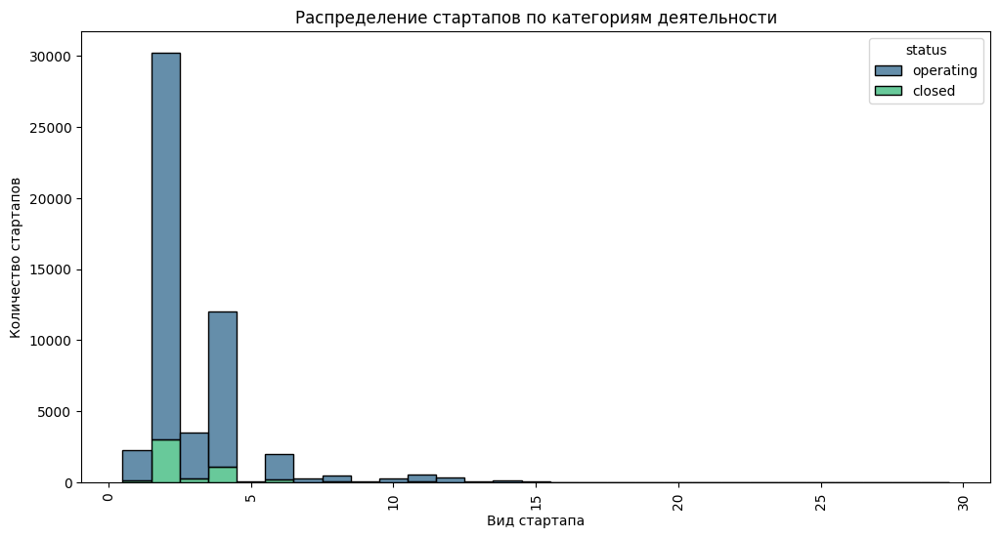

In [374]:
plt.figure(figsize=(12, 6))
sns.histplot(
    data=df_train_cat,
    x='category_bins',
    hue='status',
    multiple='stack',
    palette='viridis',
    bins=3,
    discrete=True
)
plt.title('Распределение стартапов по категориям деятельности')
plt.xlabel('Вид стартапа')
plt.ylabel('Количество стартапов')
plt.xticks(rotation=90)
plt.show()

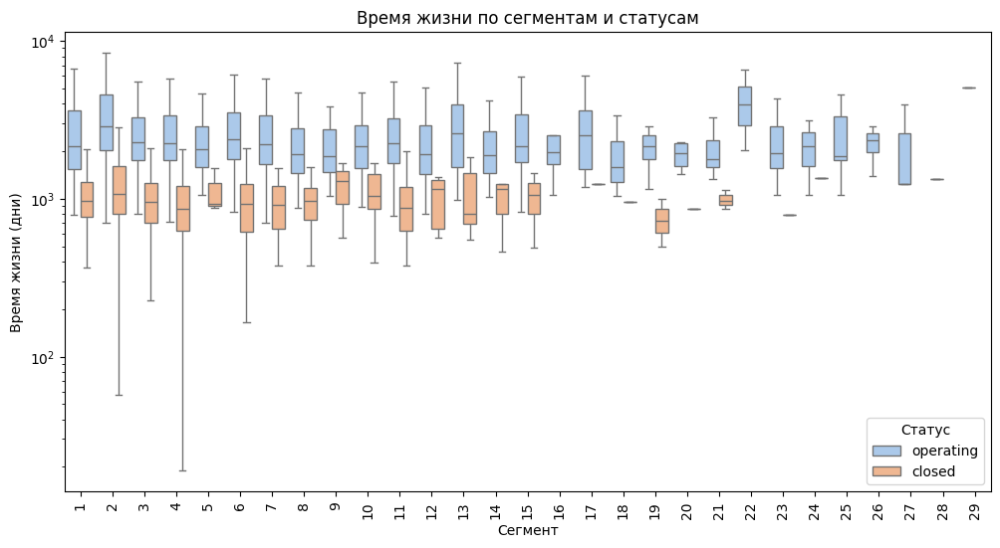

In [375]:
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df_train_cat,
    x='category_bins',
    y='lifetime',
    hue='status',
    palette='pastel',
    showfliers=False  # Игнорировать выбросы
)
plt.title('Время жизни по сегментам и статусам')
plt.xlabel('Сегмент')
plt.ylabel('Время жизни (дни)')
plt.yscale('log')  # Логарифмическая шкала, если данные скошены
plt.legend(title='Статус')
plt.xticks(rotation=90)
plt.show()

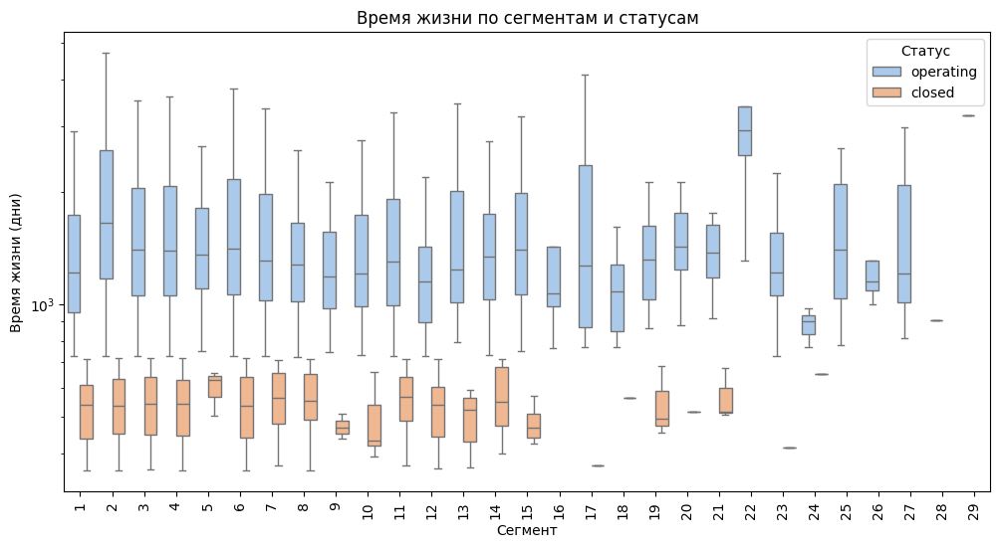

In [376]:
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df_train_cat,
    x='category_bins',
    y='days_last_invest',
    hue='status',
    palette='pastel',
    showfliers=False  # Игнорировать выбросы
)
plt.title('Время жизни по сегментам и статусам')
plt.xlabel('Сегмент')
plt.ylabel('Время жизни (дни)')
plt.yscale('log')  # Логарифмическая шкала, если данные скошены
plt.legend(title='Статус')
plt.xticks(rotation=90)
plt.show()

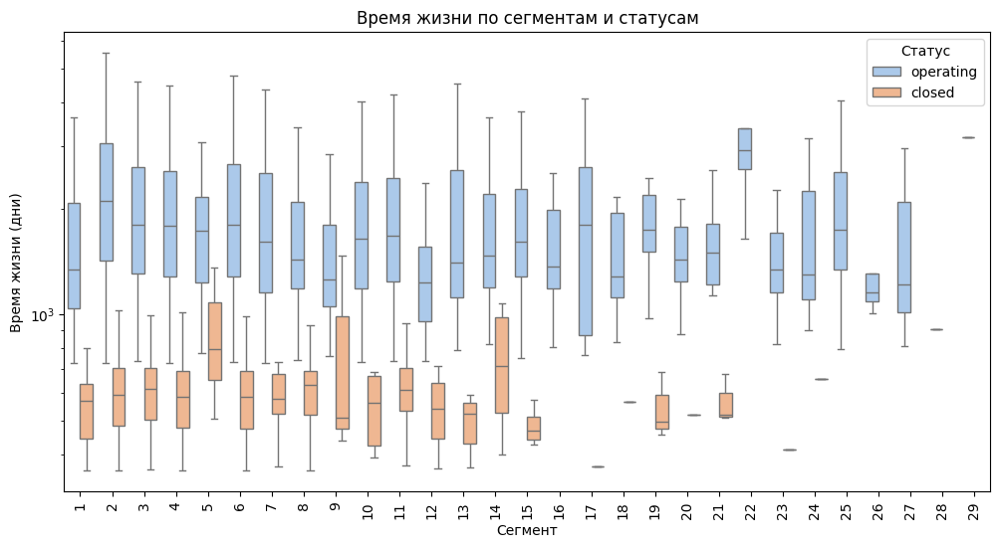

In [377]:
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df_train_cat,
    x='category_bins',
    y='days_first_invest',
    hue='status',
    palette='pastel',
    showfliers=False  # Игнорировать выбросы
)
plt.title('Время жизни по сегментам и статусам')
plt.xlabel('Сегмент')
plt.ylabel('Время жизни (дни)')
plt.yscale('log')  # Логарифмическая шкала, если данные скошены
plt.legend(title='Статус')
plt.xticks(rotation=90)
plt.show()

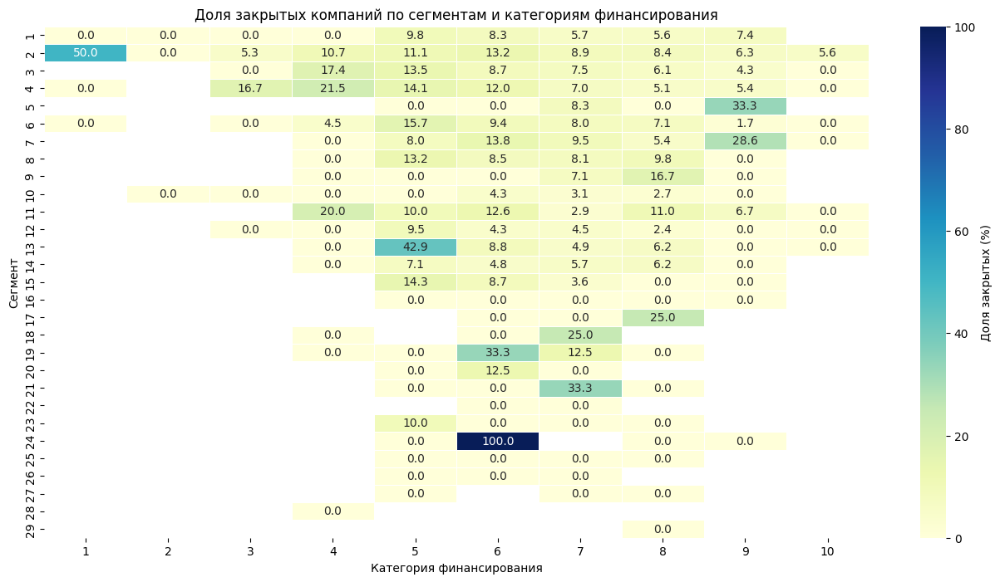

In [378]:
# Создаем сводную таблицу
pivot_table = pd.pivot_table(
    data=df_train_cat,
    index='category_bins',
    columns='funding_category',
    values='status',
    aggfunc=lambda x: (x == 'closed').mean() * 100  # Доля закрытых компаний
)

# Визуализация
plt.figure(figsize=(16, 8))
sns.heatmap(
    pivot_table,
    annot=True,
    fmt=".1f",
    cmap="YlGnBu",
    linewidths=0.5,
    cbar_kws={'label': 'Доля закрытых (%)'}
)
#plt.xticks(rotation=90)
plt.title("Доля закрытых компаний по сегментам и категориям финансирования")
plt.xlabel("Категория финансирования")
plt.ylabel("Сегмент")
plt.show()

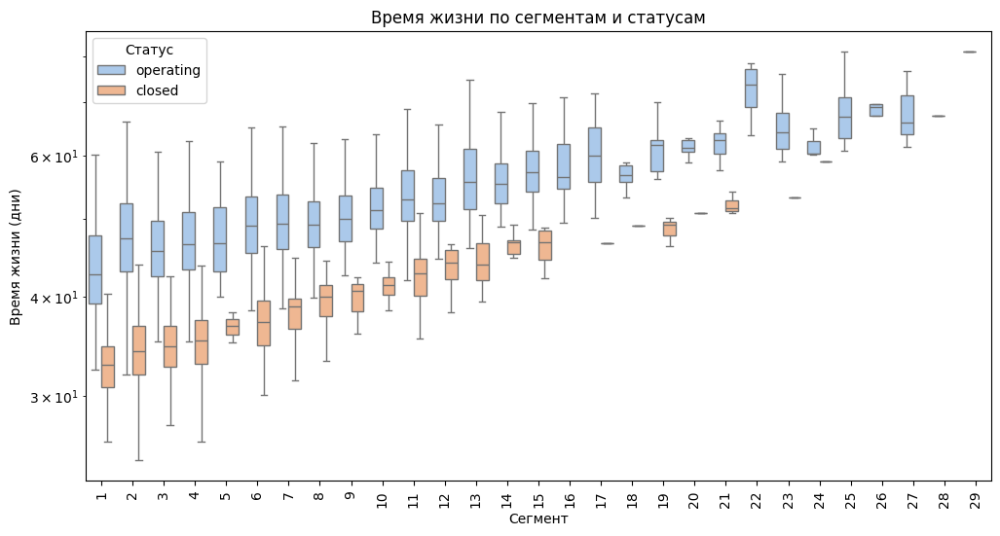

In [379]:
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df_train_cat,
    x='category_bins',
    y='category_bins_days_last_invest',
    hue='status',
    palette='pastel',
    showfliers=False  # Игнорировать выбросы
)
plt.title('Время жизни по сегментам и статусам')
plt.xlabel('Сегмент')
plt.ylabel('Время жизни (дни)')
plt.yscale('log')  # Логарифмическая шкала, если данные скошены
plt.legend(title='Статус')
plt.xticks(rotation=90)
plt.show()

interval columns not set, guessing: ['lifetime', 'days_first_invest', 'days_last_invest', 'first_funding_at_year', 'first_funding_at_weekday', 'first_funding_at_month', 'last_funding_at_year', 'last_funding_at_weekday', 'last_funding_at_month', 'range_year', 'range_days', 'quat_f_fund', 'quat_l_fund', 'funding_total_usd', 'funding_rounds', 'div_day_life', 'funding_category', 'fin_x_cat_vs_day_x_round', 'category_bins', 'category_bins_days_last_invest', 'category_funding_interaction', 'category_lifetime_ratio', 'funding_velocity', 'round_per_year', 'round_per_month', 'country_target_encoded', 'country_x_funding', 'country_x_lifetime', 'country_funding_per_day']


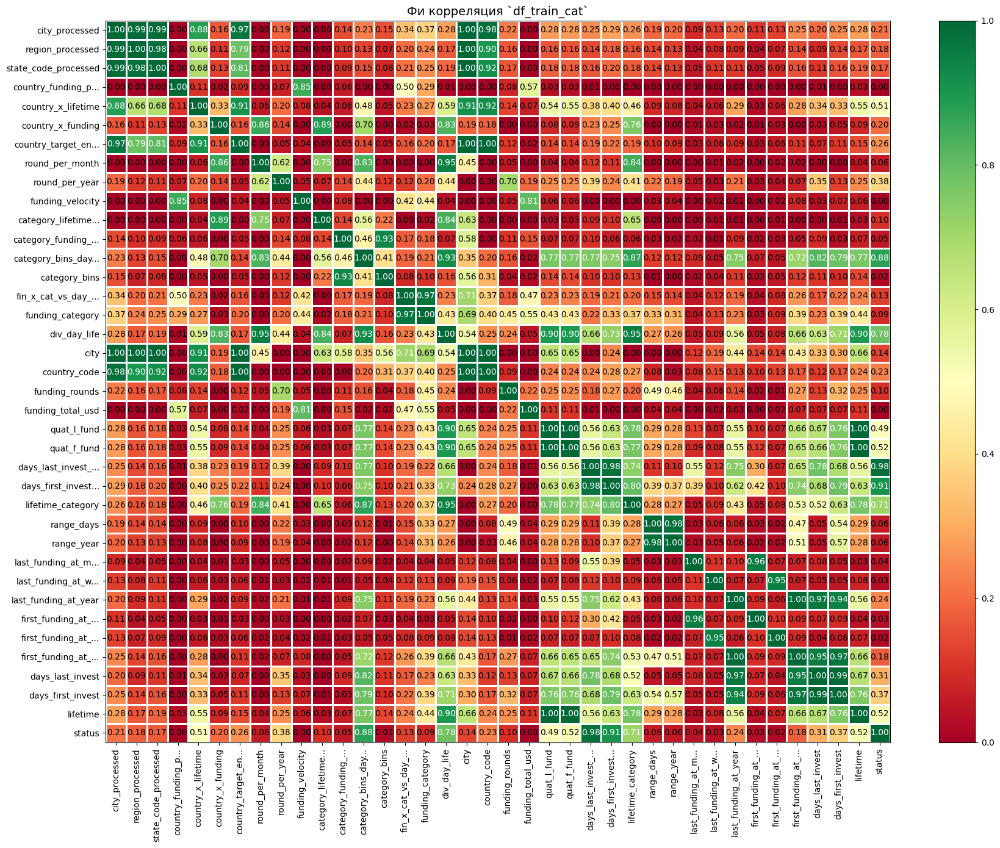

In [380]:
phik_date = df_train_cat.sample(50000).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_train_cat`',fontsize_factor=1,
                        figsize=(18,14))
plt.tight_layout()

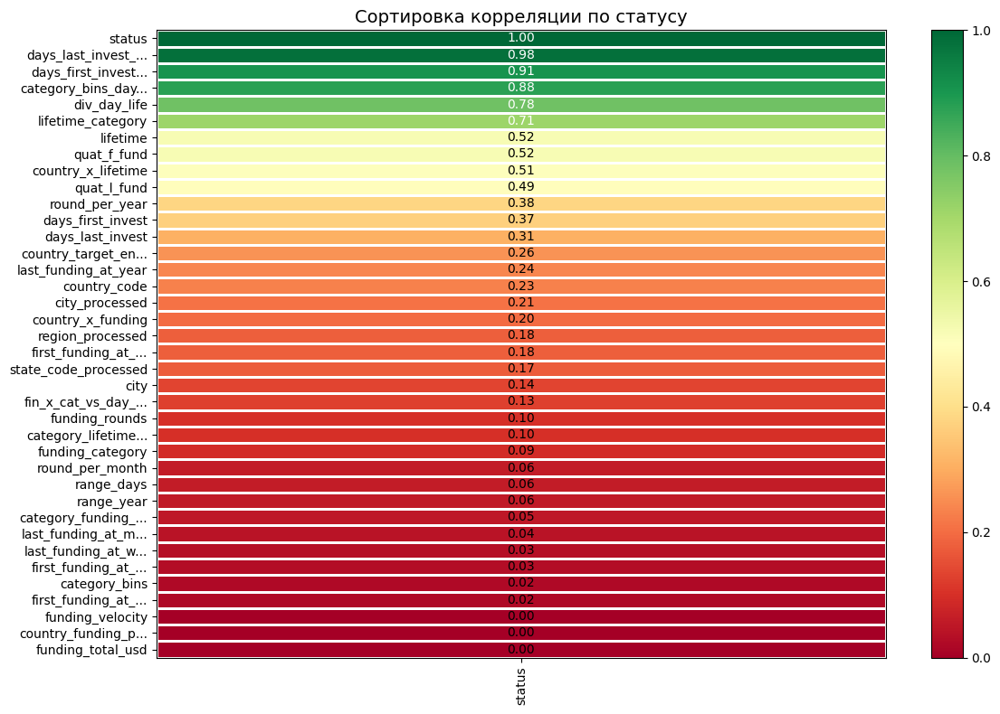

In [381]:
phik_date_status = phik_date[['status']].sort_values(ascending=True,by='status')
plot_correlation_matrix(phik_date_status.values, x_labels=phik_date_status.columns, y_labels=phik_date_status.index, 
                        vmin=0, vmax=1, title=r'Сортировка корреляции по статусу', 
                        fontsize_factor=1, figsize=(12,8))

#### 3.3.2 Обработка и подготовка признака `country_code`

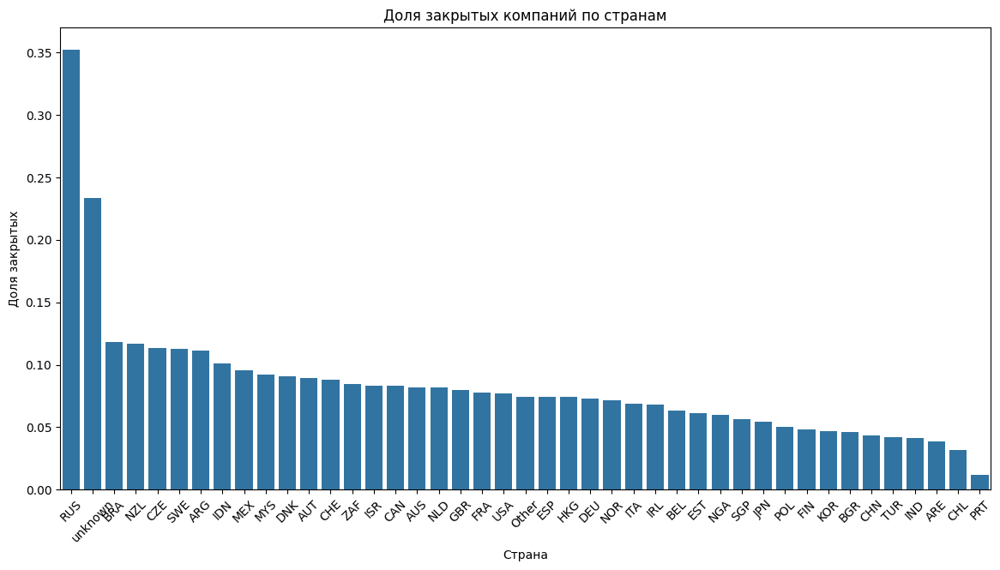

In [382]:
country_status = (
    feat_gean_train.df.groupby("country_code_processed")["status"]
    .value_counts(normalize=True)
    .unstack()
    .sort_values(by="closed", ascending=False)
)

# Визуализация
plt.figure(figsize=(14, 7))
sns.barplot(data=country_status.reset_index(), x="country_code_processed", y="closed")
plt.title("Доля закрытых компаний по странам")
plt.xlabel("Страна")
plt.ylabel("Доля закрытых")
plt.xticks(rotation=45)
plt.show()

In [383]:
feat_gean_train.df['funding_category'] = df_train_cat['funding_category'].copy()

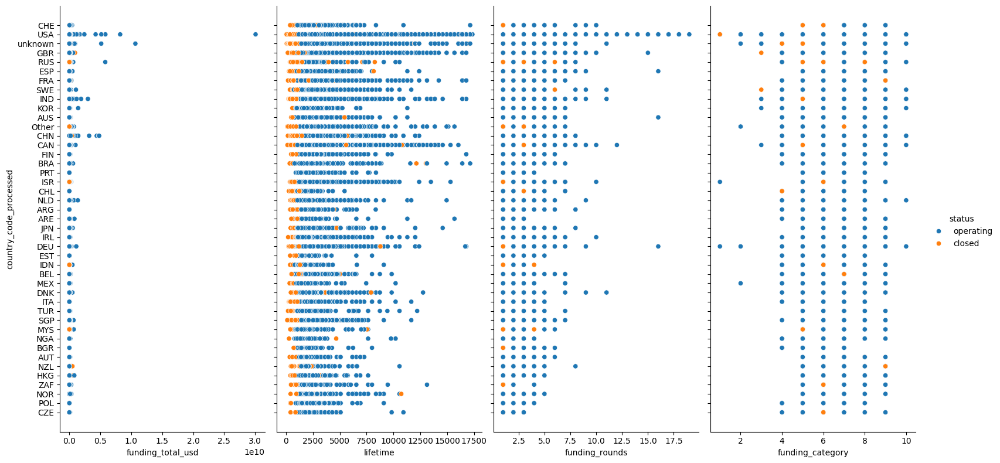

In [384]:
metrics = ["funding_total_usd", "lifetime", "funding_rounds", "funding_category"]
country_metrics = feat_gean_train.df.groupby("country_code_processed")[metrics].mean().sort_values(by="funding_total_usd", ascending=False)

# Визуализация
sns.pairplot(
    data=feat_gean_train.df,
    x_vars=metrics,
    y_vars=["country_code_processed"],
    hue="status",
    height=8,
    aspect=0.5
)
plt.show()

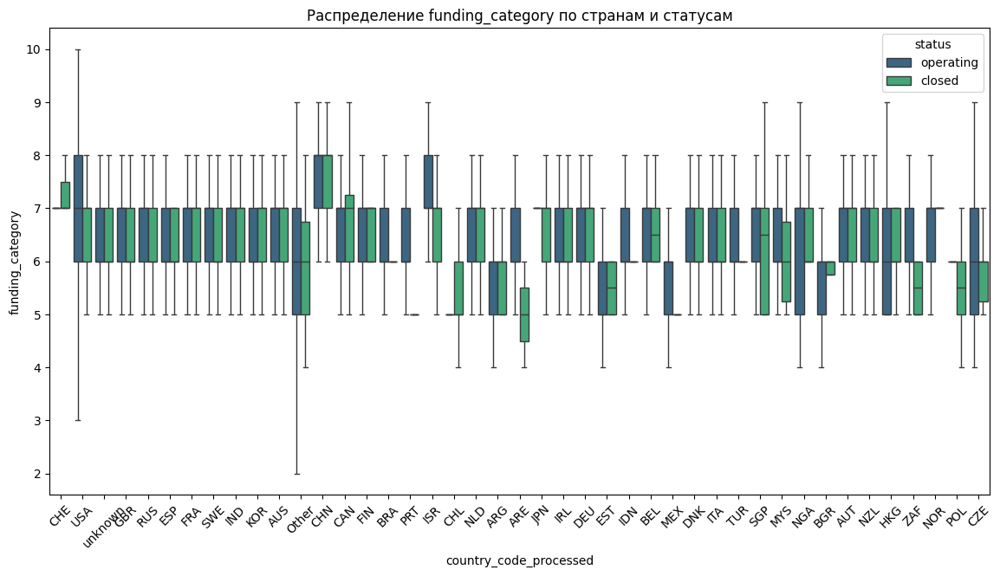

In [385]:
plt.figure(figsize=(14, 7))
df_train_cat['country_code_processed'] = feat_gean_train.df['country_code_processed'].copy()
sns.boxplot(
    data=df_train_cat,
    x="country_code_processed",
    y="funding_category",
    hue="status",
    palette="viridis",
    showfliers=False
)
plt.title("Распределение funding_category по странам и статусам")
plt.xticks(rotation=45)
plt.show()

In [386]:
fig = px.choropleth(
    data_frame=country_status.reset_index(),
    locations="country_code_processed",
    locationmode="ISO-3",
    color="closed",
    hover_name="country_code_processed",
    title="Доля закрытых компаний по странам",
    color_continuous_scale=px.colors.sequential.Plasma
)
fig.show()

interval columns not set, guessing: ['lifetime', 'days_first_invest', 'days_last_invest', 'first_funding_at_year', 'first_funding_at_weekday', 'first_funding_at_month', 'last_funding_at_year', 'last_funding_at_weekday', 'last_funding_at_month', 'range_year', 'range_days', 'quat_f_fund', 'quat_l_fund', 'funding_total_usd', 'funding_rounds', 'div_day_life', 'funding_category', 'fin_x_cat_vs_day_x_round', 'category_bins', 'category_bins_days_last_invest', 'category_funding_interaction', 'category_lifetime_ratio', 'funding_velocity', 'round_per_year', 'round_per_month', 'country_target_encoded', 'country_x_funding', 'country_x_lifetime', 'country_funding_per_day']


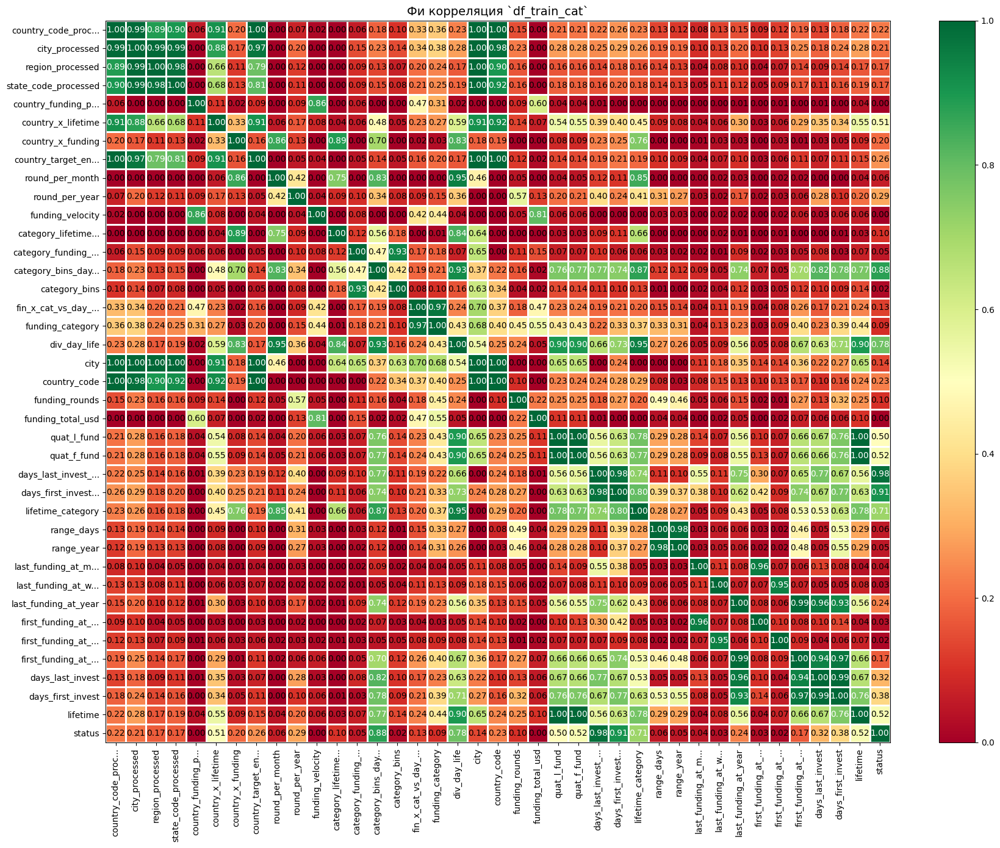

In [387]:
phik_date = df_train_cat.sample(50000).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_train_cat`',fontsize_factor=1,
                        figsize=(18,14))
plt.tight_layout()

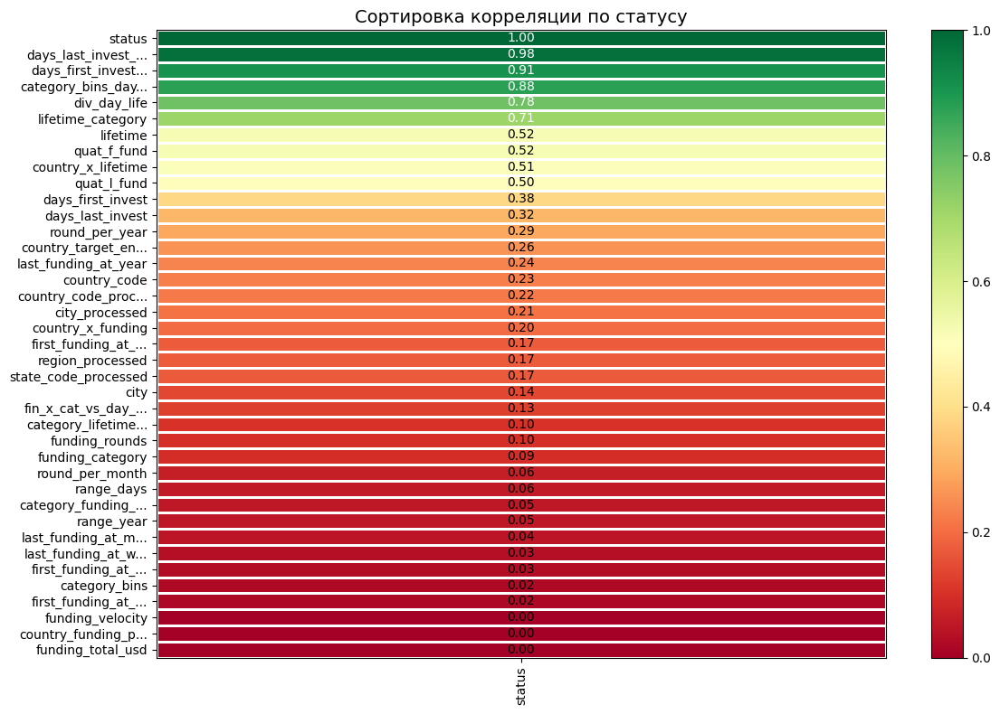

In [388]:
phik_date_status = phik_date[['status']].sort_values(ascending=True,by='status')
plot_correlation_matrix(phik_date_status.values, x_labels=phik_date_status.columns, y_labels=phik_date_status.index, 
                        vmin=0, vmax=1, title=r'Сортировка корреляции по статусу', 
                        fontsize_factor=1, figsize=(12,8))

#### 3.3.3 Обработка и подготовка колонки `state_code`

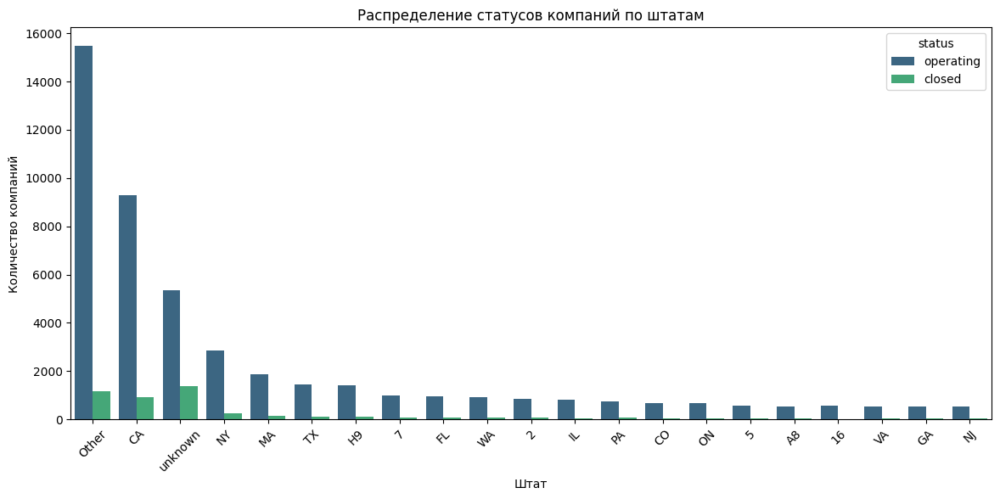

In [389]:
plt.figure(figsize=(14, 6))
sns.countplot(
    data=df_train_cat, 
    x='state_code_processed', 
    hue='status', 
    palette='viridis',
    order=df_train_cat['state_code_processed'].value_counts().index
)
plt.title('Распределение статусов компаний по штатам')
plt.xlabel('Штат')
plt.ylabel('Количество компаний')
plt.xticks(rotation=45)
plt.show()

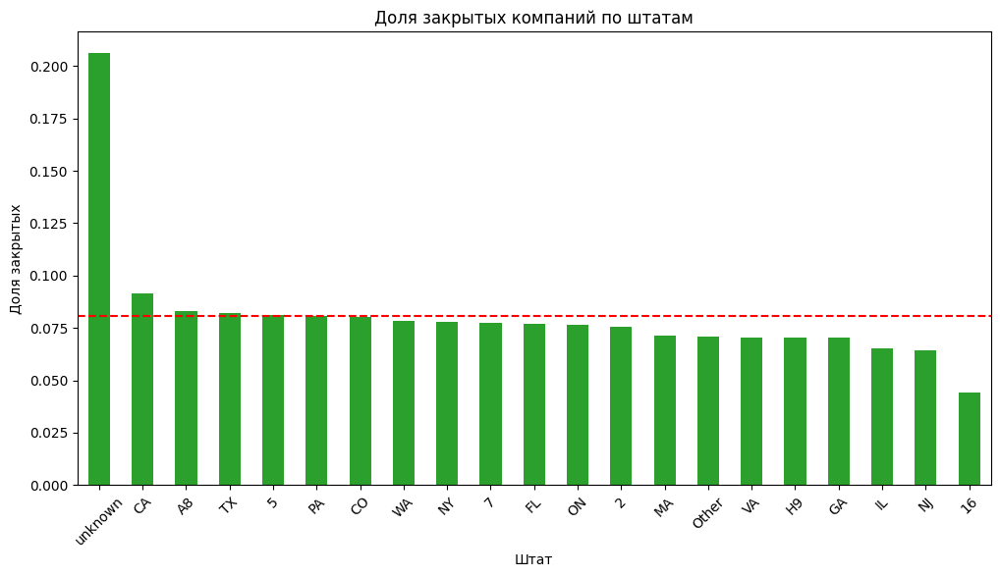

In [390]:
state_success = df_train_cat.groupby('state_code_processed')['status'].apply(
    lambda x: (x == 'closed').mean()
).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
state_success.plot(kind='bar', color='#2ca02c')
plt.axhline(y=state_success.mean(), color='red', linestyle='--')
plt.title('Доля закрытых компаний по штатам')
plt.xlabel('Штат')
plt.ylabel('Доля закрытых')
plt.xticks(rotation=45)
plt.show()

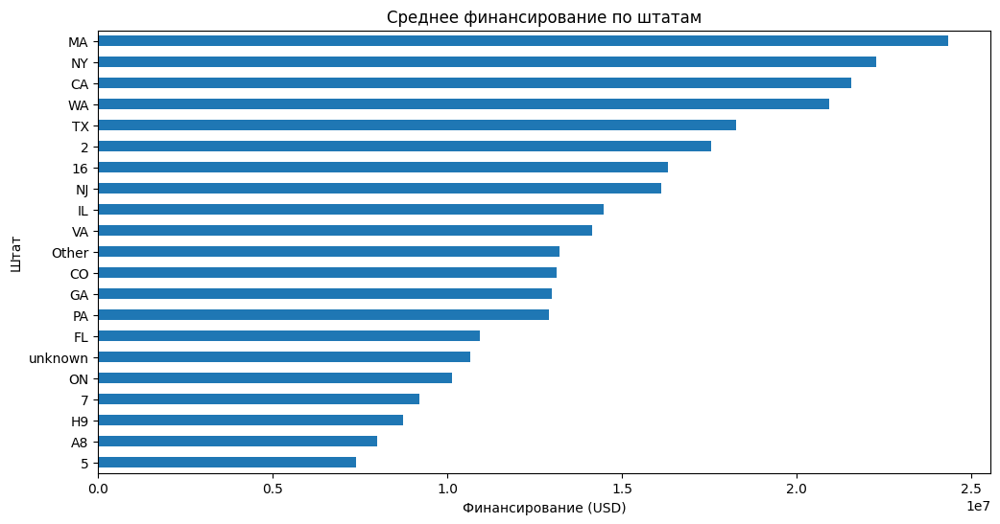

In [391]:
plt.figure(figsize=(12, 6))
df_train_cat.groupby('state_code_processed')['funding_total_usd'].mean().sort_values().plot(
    kind='barh', 
    color='#1f77b4'
)
plt.title('Среднее финансирование по штатам')
plt.xlabel('Финансирование (USD)')
plt.ylabel('Штат')
plt.show()

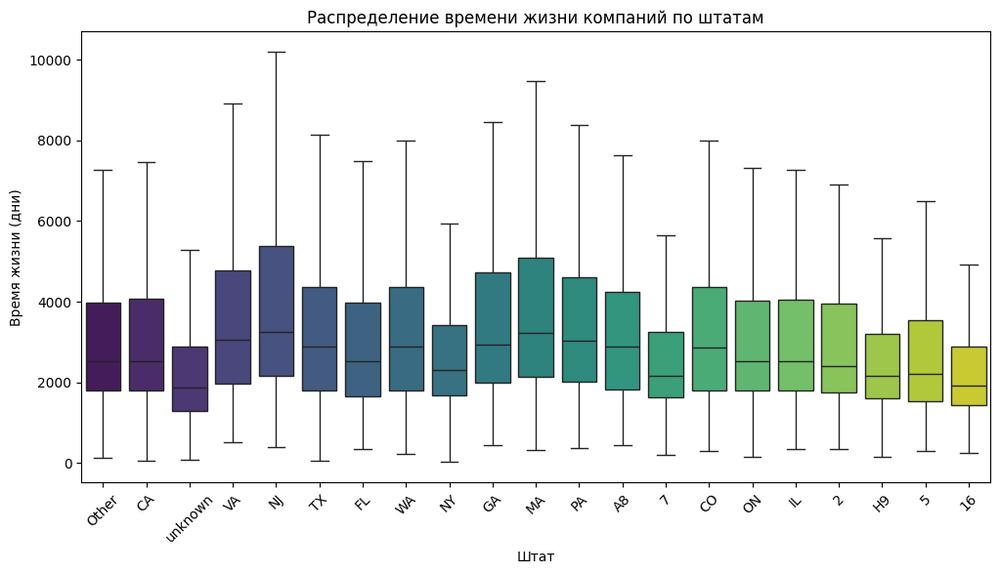

In [392]:
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df_train_cat, 
    x='state_code_processed', 
    y='lifetime', 
    palette='viridis',
    showfliers=False
)
plt.title('Распределение времени жизни компаний по штатам')
plt.xlabel('Штат')
plt.ylabel('Время жизни (дни)')
plt.xticks(rotation=45)
plt.show()

#### 3.3.4 Обработка и подготовка колонки `region`

In [393]:
df_train_cat.columns

Index(['status', 'lifetime', 'days_first_invest', 'days_last_invest',
       'first_funding_at_year', 'first_funding_at_weekday',
       'first_funding_at_month', 'last_funding_at_year',
       'last_funding_at_weekday', 'last_funding_at_month', 'range_year',
       'range_days', 'lifetime_category', 'days_first_invest_category',
       'days_last_invest_category', 'quat_f_fund', 'quat_l_fund',
       'funding_total_usd', 'funding_rounds', 'country_code', 'city',
       'div_day_life', 'funding_category', 'fin_x_cat_vs_day_x_round',
       'category_bins', 'category_bins_days_last_invest',
       'category_funding_interaction', 'category_lifetime_ratio',
       'funding_velocity', 'round_per_year', 'round_per_month',
       'country_target_encoded', 'country_x_funding', 'country_x_lifetime',
       'country_funding_per_day', 'state_code_processed', 'region_processed',
       'city_processed', 'country_code_processed'],
      dtype='object')

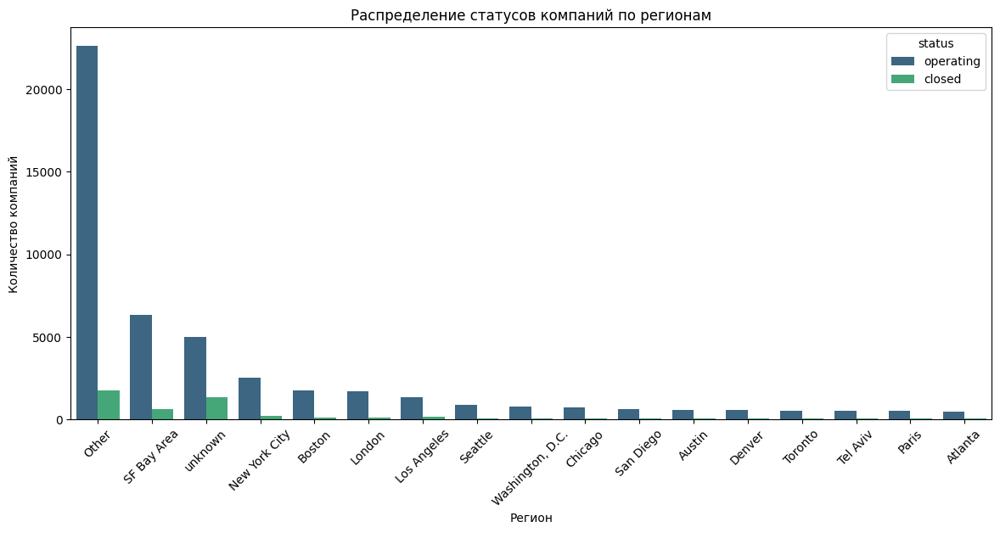

In [394]:
plt.figure(figsize=(14, 6))
sns.countplot(
    data=df_train_cat, 
    x='region_processed', 
    hue='status', 
    palette='viridis',
    order=df_train_cat['region_processed'].value_counts().index
)
plt.title('Распределение статусов компаний по регионам')
plt.xlabel('Регион')
plt.ylabel('Количество компаний')
plt.xticks(rotation=45)
plt.show()

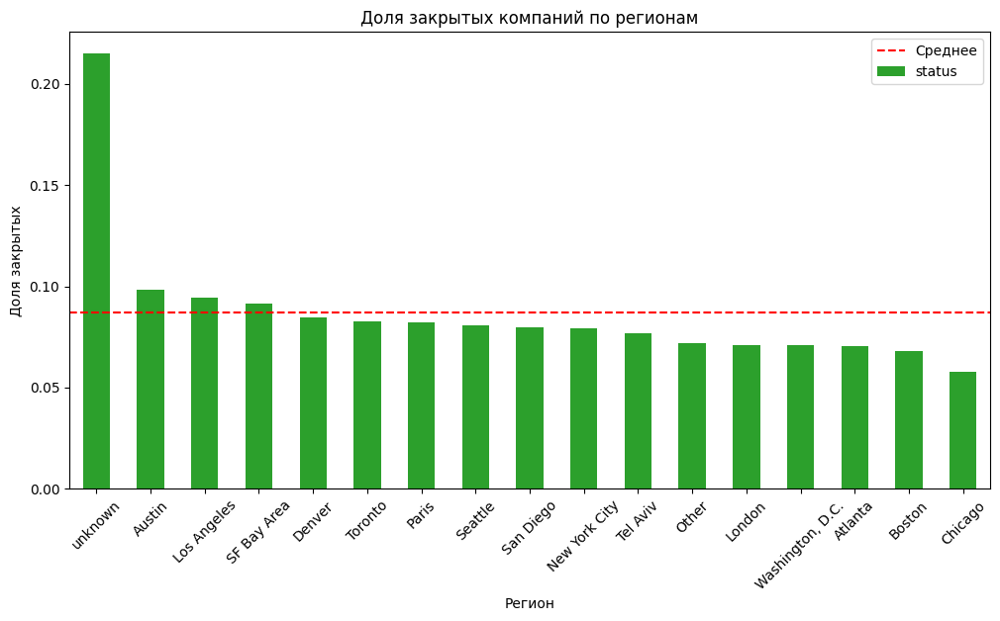

In [395]:
region_success = df_train_cat.groupby('region_processed')['status'].apply(
    lambda x: (x == 'closed').mean()
).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
region_success.plot(kind='bar', color='#2ca02c')
plt.axhline(y=region_success.mean(), color='red', linestyle='--', label='Среднее')
plt.title('Доля закрытых компаний по регионам')
plt.xlabel('Регион')
plt.ylabel('Доля закрытых')
plt.xticks(rotation=45)
plt.legend()
plt.show()

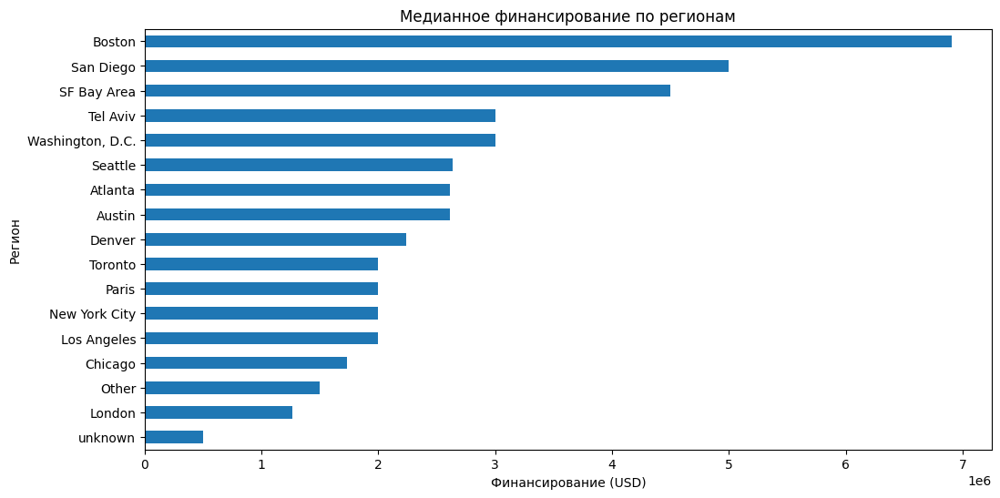

In [396]:
plt.figure(figsize=(12, 6))
df_train_cat.groupby('region_processed')['funding_total_usd'].median().sort_values().plot(
    kind='barh', 
    color='#1f77b4'
)
plt.title('Медианное финансирование по регионам')
plt.xlabel('Финансирование (USD)')
plt.ylabel('Регион')
plt.show()

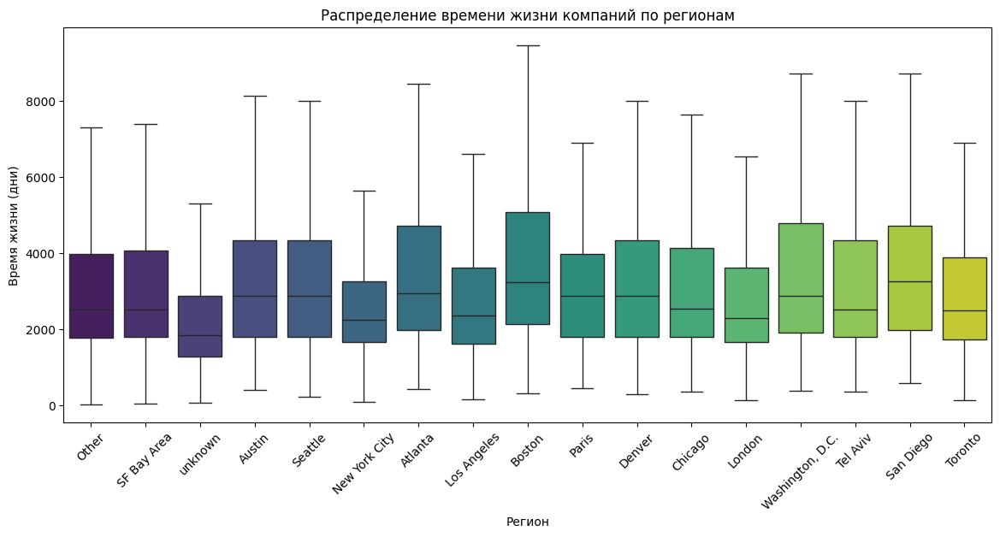

In [397]:
plt.figure(figsize=(14, 6))
sns.boxplot(
    data=df_train_cat, 
    x='region_processed', 
    y='lifetime', 
    palette='viridis',
    showfliers=False
)
plt.title('Распределение времени жизни компаний по регионам')
plt.xlabel('Регион')
plt.ylabel('Время жизни (дни)')
plt.xticks(rotation=45)
plt.show()

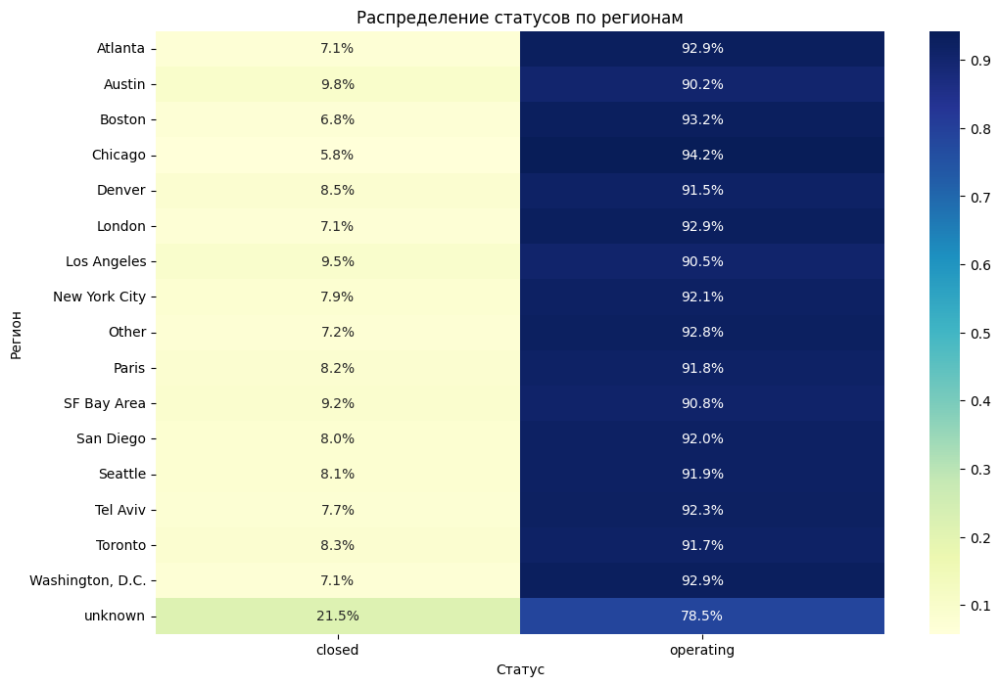

In [398]:
plt.figure(figsize=(12, 8))
sns.heatmap(
    pd.crosstab(df_train_cat['region_processed'], df_train_cat['status'], normalize='index'),
    annot=True, 
    fmt='.1%',
    cmap='YlGnBu'
)
plt.title('Распределение статусов по регионам')
plt.xlabel('Статус')
plt.ylabel('Регион')
plt.show()

#### 3.3.5 Обработка и подготовка колонки `city`

In [399]:
df_train_cp.first_funding_at.unique()

array(['2011-05-01', '2010-05-04', '2012-08-20', ..., '2009-01-04',
       '2009-03-15', '2009-06-14'], dtype=object)

In [400]:
df_train_cp.first_funding_at = pd.to_datetime(df_train_cp.first_funding_at)

In [401]:
df_train_cp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               52516 non-null  object        
 1   category_list      52516 non-null  object        
 2   funding_total_usd  42447 non-null  float64       
 3   status             52516 non-null  object        
 4   country_code       52516 non-null  object        
 5   state_code         52516 non-null  object        
 6   region             52516 non-null  object        
 7   city               52516 non-null  object        
 8   funding_rounds     52516 non-null  int64         
 9   founded_at         52516 non-null  object        
 10  first_funding_at   52516 non-null  datetime64[ns]
 11  last_funding_at    52516 non-null  object        
 12  closed_at          52516 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(10)
memory

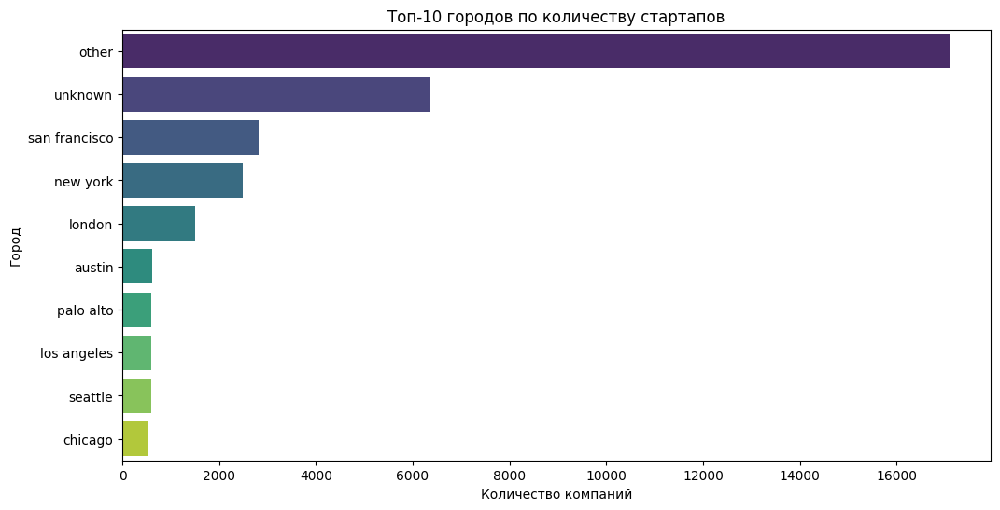

In [402]:
top_cities = df_train_cat['city_processed'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cities.values, y=top_cities.index, palette="viridis")
plt.title("Топ-10 городов по количеству стартапов")
plt.xlabel("Количество компаний")
plt.ylabel("Город")
plt.show()

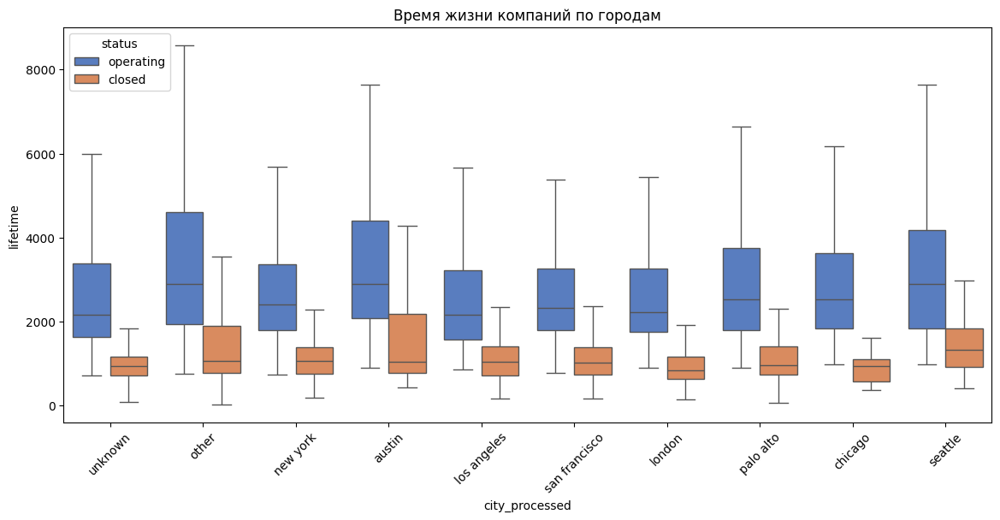

In [403]:
plt.figure(figsize=(14, 6))
sns.boxplot(
    data=df_train_cat[df_train_cat['city_processed'].isin(top_cities.index)],
    x='city_processed',
    y='lifetime',
    hue='status',
    palette="muted",
    showfliers=False
)
plt.title("Время жизни компаний по городам")
plt.xticks(rotation=45)
plt.show()

## 4. Дополнительная обработка признаков

interval columns not set, guessing: ['country_funding_per_day', 'funding_total_usd', 'funding_velocity', 'category_bins', 'category_funding_interaction', 'range_year', 'range_days', 'funding_category', 'funding_rounds', 'category_lifetime_ratio', 'fin_x_cat_vs_day_x_round', 'country_x_funding', 'round_per_year', 'country_x_lifetime', 'lifetime', 'div_day_life']


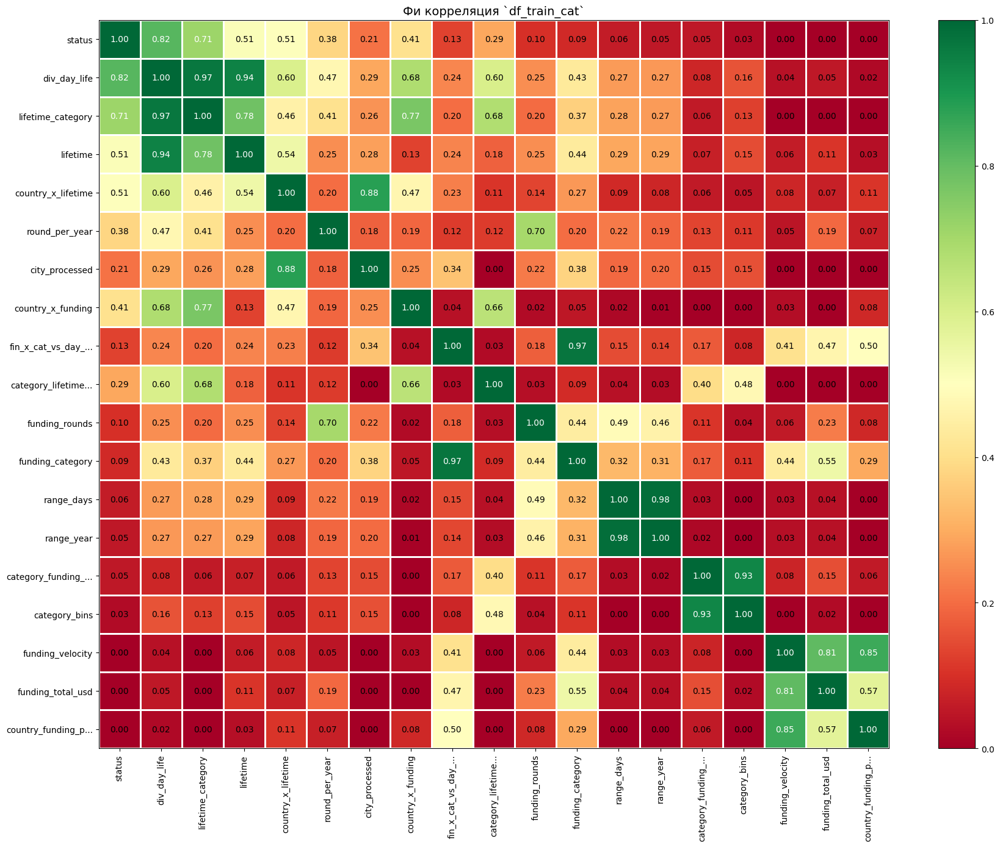

In [404]:
cols_for_watch = ['country_funding_per_day', 'funding_total_usd', 'funding_velocity',
        'category_bins','category_funding_interaction', 'range_year', 'range_days',
       'funding_category', 'funding_rounds', 'category_lifetime_ratio',
       'fin_x_cat_vs_day_x_round', 'country_x_funding', 'city_processed', 
       'round_per_year',  'country_x_lifetime', 'lifetime', 'lifetime_category', 'div_day_life', 'status']
phik_date = df_train_cat[cols_for_watch].sample(50000).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_train_cat`',fontsize_factor=1,
                        figsize=(18,14))
plt.tight_layout()

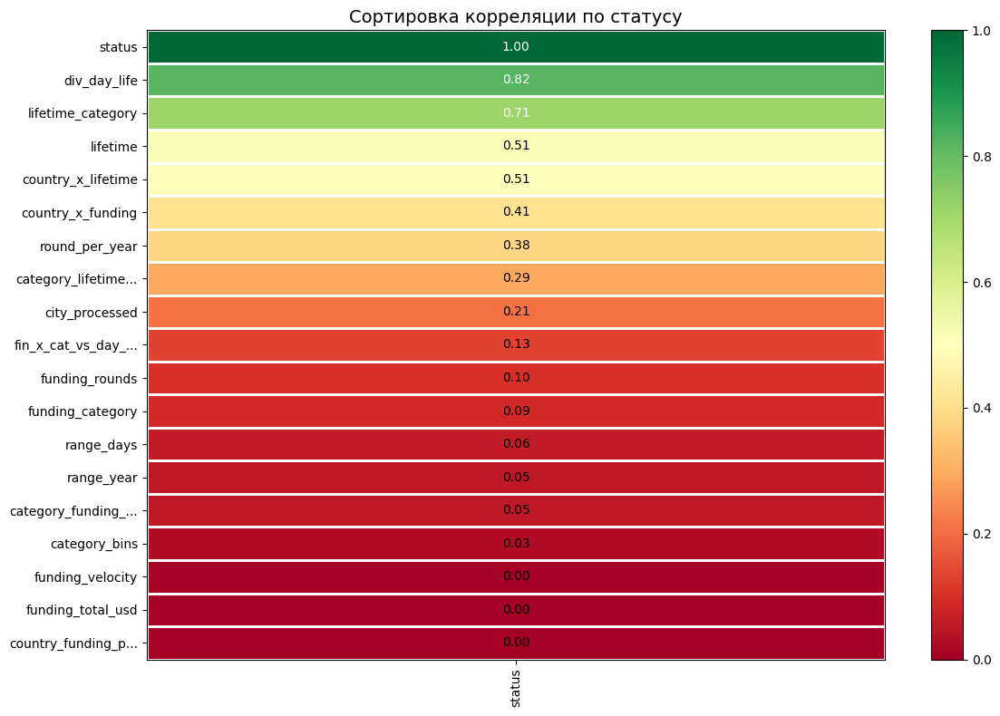

In [405]:
phik_date_status = phik_date[['status']].sort_values(ascending=True,by='status')
plot_correlation_matrix(phik_date_status.values, x_labels=phik_date_status.columns, y_labels=phik_date_status.index, 
                        vmin=0, vmax=1, title=r'Сортировка корреляции по статусу', 
                        fontsize_factor=1, figsize=(12,8))

In [406]:
phik_date_status

,status
country_funding_per_day,0.000000
funding_total_usd,0.000000
funding_velocity,0.000000
category_bins,0.026351
category_funding_interaction,0.053006
range_year,0.054595
range_days,0.059311
funding_category,0.089339
funding_rounds,0.098104
fin_x_cat_vs_day_x_round,0.129990


### 4.1 Мультиколлинеарность

__**Даты финансирования:**__

- Признаки `days_first_invest` и `days_last_invest` имеют корреляцию 0.992, `first_funding_at_year` и `last_funding_at_year` — 0.995, а также `first_funding_at_weekday` и `last_funding_at_weekday` — 0.948. Это указывает на почти идентичное поведение и избыточность информации в данных парах. Для устранения мультиколлинеарности можно оставить один признак из каждой пары, предпочтительно тот, который лучше отражает временную динамику.

__**Географические признаки:**__

- Признаки `city_processed`, `country_x_funding`, `state_code_processed` и `region_processed` демонстрируют высокую корреляцию между собой (до 0.9), однако их связь с целевой переменной `status` остается близкой к нулю (менее 0.05). Это делает их потенциально неинформативными для модели, и они были исключены из дальнейшего анализа после проверки их вклада через важность признаков.

__**Финансовые показатели:**__

- Признак `funding_total_usd` показал корреляцию с `status` около 0.0, а производный признак `funding_category` — слабую связь (0.060). Для повышения информативности был создан логарифмированный признак `log_funding_total_usd`, который после обработки пропусков и отрицательных значений увеличил корреляцию до 0.0868. Это указывает на необходимость дальнейшего создания производных признаков, таких как `round_per_year`.

__**Меры для борьбы с мультиколлинеарностью и улучшения модели:**__

- Удаление или объединение сильно коррелированных признаков (например, оставлен только `days_last_invest` из пары с `days_first_invest`).
- Создание новых признаков через взаимодействие существующих, таких как `country_x_lifetime` и `lifetime_category`.
- Исключение признаков с низкой информативностью (например, географические признаки с корреляцией менее 0.1).

Эти шаги позволилят снизить избыточность данных, повысить стабильность модели и улучшить её предсказательную способность.


In [407]:
class FeatureGenFullWithCorr(FeatureGenFull):

    def __init__(self, df:pd.DataFrame):
       super().__init__(df)

    

    def multicorrection(self):
        

        self.df_date.drop(columns=['city_processed','state_code_processed', 'region_processed'], axis=1, inplace=True)
   
        # self.df_date['fun_total_days_inv'] = np.log((self.df_date['funding_total_usd'] +1) / self.df_date.lifetime)
       
        lifetime_map = {
            '0-3_months': 0,
            '3-6_months': 1,
            '6-9_months': 2,
            '9-12_months': 3,
            '1-1.25_years': 4,
            '1.25-1.5_years': 5,
            '1.5-1.75_years': 6,
            '1.75-2_years': 7,
            '2-2.25_years': 8,
            '2.25-2.5_years': 9,
            '2.5-2.75_years': 10,
            '2.75-3_years': 11,
            '3-5_years': 12,
            '5-10_years': 13,
            '10+_years': 14
        }
        
        self.df_date['lifetime_category'] = self.df_date['lifetime_category'].map(lifetime_map) 
        self.df_date['lifetime_category'] = self.df_date['lifetime_category'].astype(int)
        self.df_date['invest_gap_ratio'] = self.df_date['lifetime_category'] / self.df_date['lifetime']

        # self.df_date['days_last_invest_category'] = self.df_date['days_last_invest_category'].map(lifetime_map)
        # self.df_date['days_last_invest_category'] = self.df_date['days_last_invest_category'].astype(int)

        self.df_date['quat_f_l_fund'] =  (self.df_date['quat_f_fund'] + self.df_date['quat_l_fund']) / 2 
        self.df_date['f_l_funding_at_year'] = (self.df_date['first_funding_at_year'] + self.df_date['last_funding_at_year']) / 2 
        
        
        # category_avg_gap = self.df_date.groupby('category_bins')['invest_gap_ratio'].mean().to_dict()
        # self.df_date['lifetime_vs_invest_gap_ratio'] = self.df_date.lifetime_category * self.df_date['category_bins'].map(category_avg_gap)


        # Логарифмирование funding_total_usd
        self.df_date['log_funding_total_usd'] = np.log1p(self.df_date['funding_total_usd'])

        # Синтетический признак
        category_mean_life = self.df_date.groupby(['category_bins','country_target_encoded'])['lifetime'].agg(['median'])
        category_mean_life.rename(columns={#'std': 'lifecat_std_by_cat_country',
                                           'median': 'lifecat_median_by_cat_country'
                                          }, inplace=True)
        self.df_date = self.df_date.merge(category_mean_life, on=['category_bins','country_target_encoded'], how='left')
        print('isna ', len(self.df_date[self.df_date.lifecat_median_by_cat_country.isna() == True]))
        self.df_date.lifecat_median_by_cat_country = (self.df_date.lifecat_median_by_cat_country + 1)  / (self.df_date.lifetime_category + 1)
        print('isna ', len(self.df_date[self.df_date.lifecat_median_by_cat_country.isna() == True]))
        self.df_date.lifecat_median_by_cat_country = (np.log1p(self.df_date.lifecat_median_by_cat_country).pow(1./2) * np.log1p(self.df_date.quat_l_fund))
        print('isna ', len(self.df_date[self.df_date.lifecat_median_by_cat_country.isna() == True]))
        self.df_date.lifecat_median_by_cat_country = self.df_date.lifecat_median_by_cat_country.fillna(self.df_date.lifecat_median_by_cat_country.median())
        print('isna ', len(self.df_date[self.df_date.lifecat_median_by_cat_country.isna() == True]))
        # for col in cols_to_change:
        #     self.df_date.replace([np.inf, -np.inf], np.NAN, inplace=True)
        #     self.df_date[col] = (self.df_date[col] + 1)  / (self.df_date.lifetime_category + 1)
        #     self.df_date[col] = df.lifecat_median_by_cat_country = (np.log1p(df.lifecat_median_by_cat_country).pow(1./2) * np.log1p(df.quat_l_fund))
        #     print(col, len(self.df_date[self.df_date[col].isna() == True]))
    
        
        # Синтетический признак: отношение к средней сумме по категории
        category_mean_funding =  self.df_date.groupby('category_bins')['funding_total_usd'].transform('mean')
        self.df_date['funding_vs_category_mean'] =  np.log1p(self.df_date['funding_total_usd'] / (category_mean_funding + 1e-5)) * self.df_date.lifetime

        # Синтетический признак: интенсивность финансирования стартапа относительно среднего времени жизни стартапов в данной стране.
        self.df_date['round_year_vs_country_life'] = self.df_date.round_per_year / (self.df_date.lifetime_category + 1) *  self.df_date['funding_vs_category_mean']

        # Синтетический признак: отклонение времени жизни стартапа от типичного для его группы, скорректированное на интенсивность финансирования (round_per_year). 
        stats_by_group = self.df_date.groupby(['category_bins', 'country_target_encoded'])['lifetime'].agg(['std']).reset_index()
        stats_by_group.rename(columns={'std': 'std_lifetime_by_cat_country'}, inplace=True)

        self.df_date = self.df_date.merge(stats_by_group, on=['category_bins', 'country_target_encoded'], how='left')
        global_std = self.df_date['std_lifetime_by_cat_country'].median() 
        self.df_date['std_lifetime_by_cat_country'] = self.df_date['std_lifetime_by_cat_country'].fillna(global_std)
        self.df_date['std_lifetime_by_cat_country'] = (self.df_date.lifetime -  self.df_date['std_lifetime_by_cat_country']) * self.df_date.round_per_year

        # Синтетический признак: 
        self.df_date['funding_total_usd'] = np.log1p( self.df_date['funding_total_usd'])
        stats_by_group =  self.df_date.groupby(['category_bins', 'country_target_encoded'])['funding_total_usd'].agg(['median']).reset_index()
        stats_by_group.rename(columns={'median': 'median_funding_total_usd_by_cat_country'}, inplace=True)
        
        self.df_date =  self.df_date.merge(stats_by_group, on=['category_bins', 'country_target_encoded'], how='left')
        global_median =  self.df_date['median_funding_total_usd_by_cat_country'].median()  
        self.df_date['median_funding_total_usd_by_cat_country'] = self.df_date['median_funding_total_usd_by_cat_country'].fillna(global_median)
        self.df_date['median_funding_total_usd_by_cat_country'] = self.df_date['median_funding_total_usd_by_cat_country'] * (self.df_date.lifetime.pow(1./3))
       
            


        
    def drop_cols(self):
        
        lst_drop = ['range_year', 'category_bins', 'funding_category', 'funding_total_usd','funding_rounds', 'invest_gap_ratio', 
                        'country_x_funding', 'quat_l_fund', 'quat_f_fund', 'first_funding_at_year', 'last_funding_at_year', 
                        'last_funding_at_month','country_code','city', 'first_funding_at_year', 
                        'last_funding_at_weekday', 'first_funding_at_month','first_funding_at_weekday', 'first_funding_at_year', 
                        'category_bins_days_last_invest','round_per_month' , 'days_last_invest', 'days_first_invest', 'days_first_invest_category',  'days_last_invest_category',]
        #  ,'range_days' 'category_bins' 'funding_category', 'funding_total_usd' 'first_funding_at_year','last_funding_at_year','fun_total_days_inv', 'log_funding_total_usd'
        self.df_date.drop(columns=lst_drop, axis=1, inplace=True)

        
       
    

In [408]:
df_train_cp = df_train.copy()
feat_gean_train = FeatureGenFullWithCorr(df_train_cp)
feat_gean_train.generate_all_feature_train()
map_for_countries = feat_gean_train.map_for_countries 
df_test_cp = df_test.copy()
feat_gean_test = FeatureGenFullWithCorr(df_test_cp)
feat_gean_test.map_for_countries = map_for_countries.copy() 
feat_gean_test.generate_all_feature_test()

In [409]:
print(len(feat_gean_train.df_date.columns), len(feat_gean_test.df_date.columns))

38 37


In [410]:
feat_gean_train.multicorrection()
feat_gean_test.multicorrection()
feat_gean_train.drop_cols()
feat_gean_test.drop_cols()
print(len(feat_gean_train.df_date.columns), len(feat_gean_test.df_date.columns))

isna  0
isna  0
isna  605
isna  0
isna  0
isna  0
isna  159
isna  0
21 20


In [411]:
df_train_correction = feat_gean_train.df_date.copy()

In [412]:
# df_train_correction.isna().sum()
# df_train_correction.lifecat_mean_by_cat_country = df_train_correction.lifecat_mean_by_cat_country.fillna(df_train_correction.lifecat_mean_by_cat_country.mean())
df_train_correction.isna().sum()
# df_train_correction.lifecat_mean_by_cat_country.mean()

status                                     0
lifetime                                   0
range_days                                 0
lifetime_category                          0
div_day_life                               0
fin_x_cat_vs_day_x_round                   0
category_funding_interaction               0
category_lifetime_ratio                    0
funding_velocity                           0
round_per_year                             0
country_target_encoded                     0
country_x_lifetime                         0
country_funding_per_day                    0
quat_f_l_fund                              0
f_l_funding_at_year                        0
log_funding_total_usd                      0
lifecat_median_by_cat_country              0
funding_vs_category_mean                   0
round_year_vs_country_life                 0
std_lifetime_by_cat_country                0
median_funding_total_usd_by_cat_country    0
dtype: int64

interval columns not set, guessing: ['lifetime', 'range_days', 'lifetime_category', 'div_day_life', 'fin_x_cat_vs_day_x_round', 'category_funding_interaction', 'category_lifetime_ratio', 'funding_velocity', 'round_per_year', 'country_target_encoded', 'country_x_lifetime', 'country_funding_per_day', 'quat_f_l_fund', 'f_l_funding_at_year', 'log_funding_total_usd', 'lifecat_median_by_cat_country', 'funding_vs_category_mean', 'round_year_vs_country_life', 'std_lifetime_by_cat_country', 'median_funding_total_usd_by_cat_country']


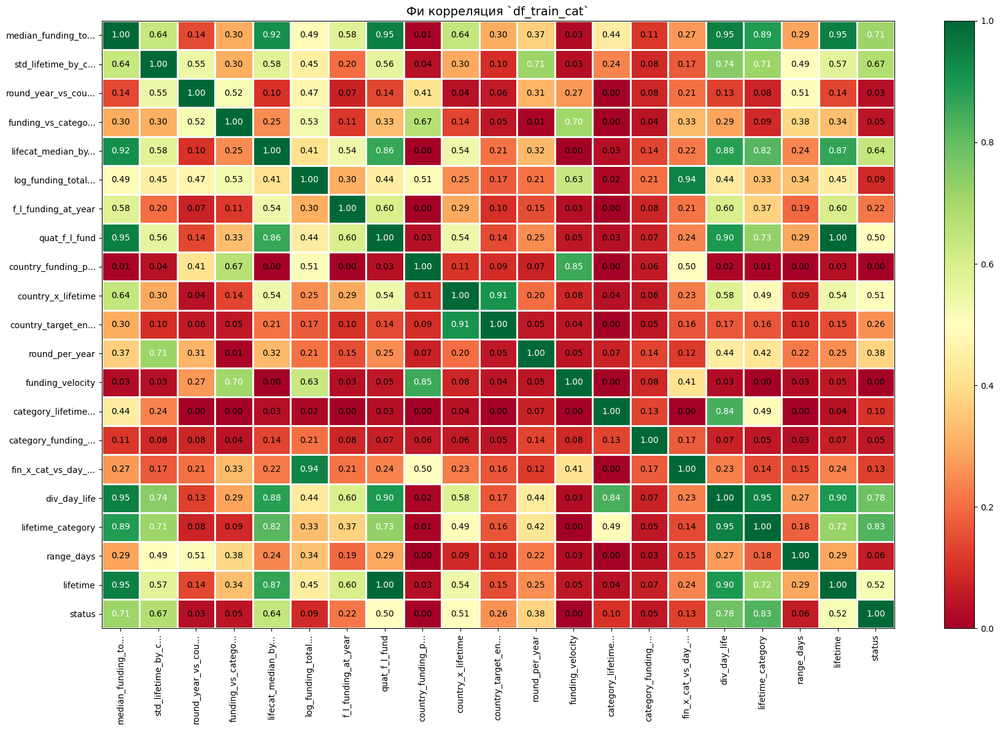

In [413]:
phik_date = df_train_correction.sample(50000).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_train_cat`',fontsize_factor=1,
                        figsize=(18,12))
plt.tight_layout()

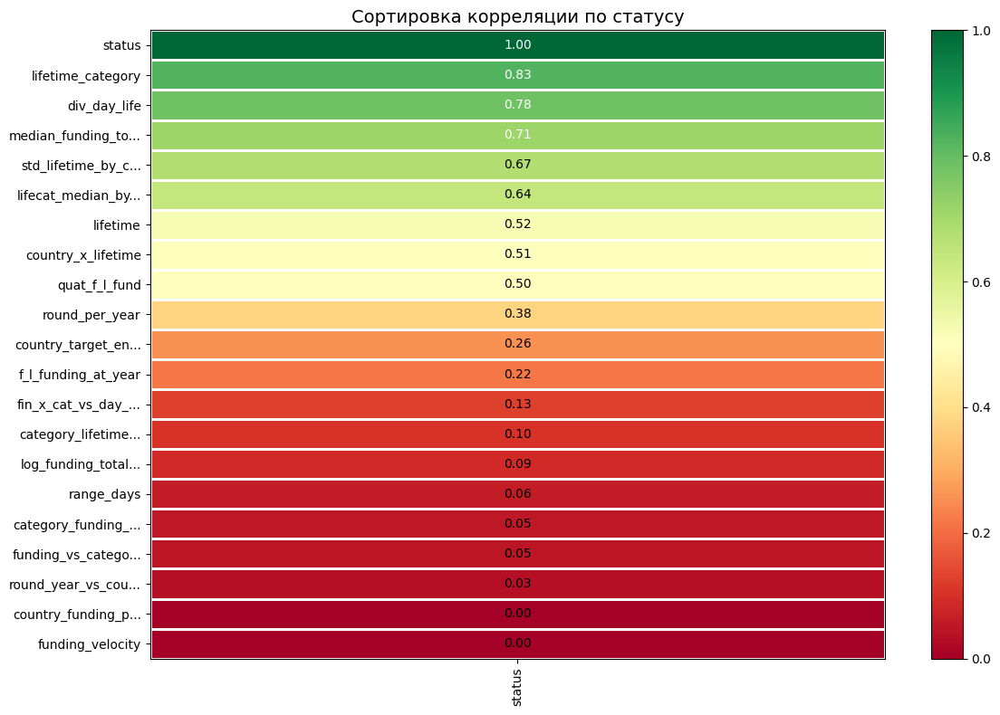

In [414]:
phik_date_status = phik_date[['status']].sort_values(ascending=True,by='status')
plot_correlation_matrix(phik_date_status.values, x_labels=phik_date_status.columns, y_labels=phik_date_status.index, 
                        vmin=0, vmax=1, title=r'Сортировка корреляции по статусу', 
                        fontsize_factor=1, figsize=(12,8))

In [415]:
df_test_correction = feat_gean_test.df_date.copy()

interval columns not set, guessing: ['lifetime', 'range_days', 'lifetime_category', 'div_day_life', 'fin_x_cat_vs_day_x_round', 'category_funding_interaction', 'category_lifetime_ratio', 'funding_velocity', 'round_per_year', 'country_target_encoded', 'country_x_lifetime', 'country_funding_per_day', 'quat_f_l_fund', 'f_l_funding_at_year', 'log_funding_total_usd', 'lifecat_median_by_cat_country', 'funding_vs_category_mean', 'round_year_vs_country_life', 'std_lifetime_by_cat_country', 'median_funding_total_usd_by_cat_country']


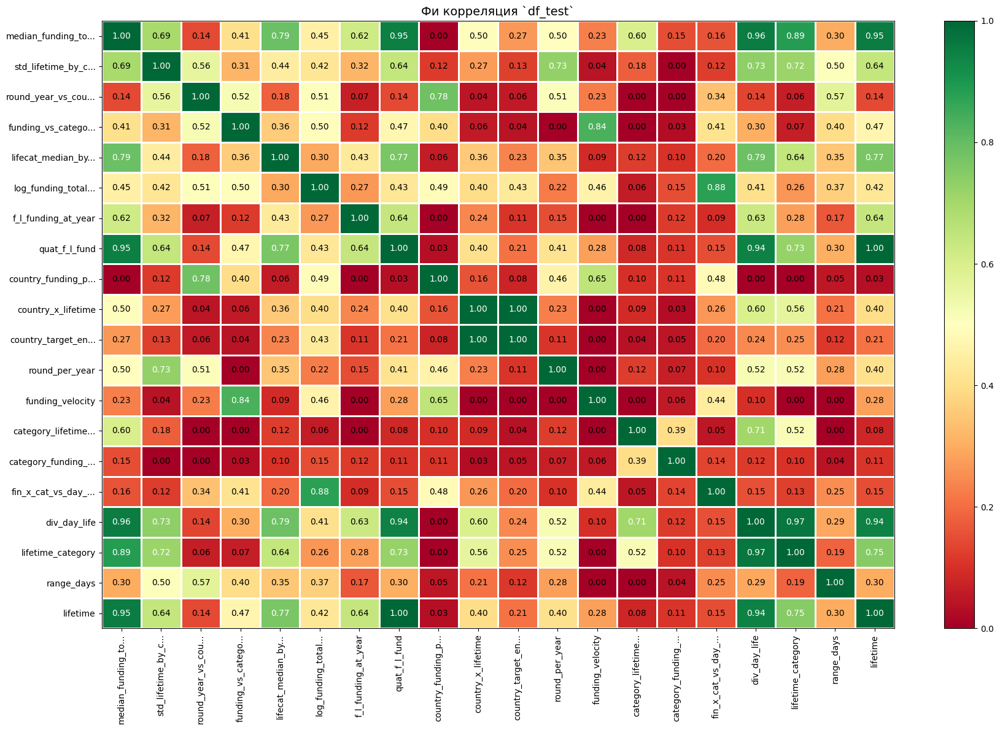

In [416]:
phik_date = df_test_correction.sample(len(df_test_correction)).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_test`',fontsize_factor=1,
                        figsize=(18,12))
plt.tight_layout()

### 4.2 Вывод по корреляции признаков и дальнейшие действия 

___**Анализ корреляции с целевой переменной `status`:**__

__**Корреляция признаков с целевой переменной:**__
Значения корреляции по убыванию:

- **`lifetime_category`**: 0.8057 (очень высокая) — категоризация времени жизни стартапа.
- **`lifetime_vs_invest_gap_ratio`**: 0.7973 (очень высокая) — отношение времени жизни к разрыву инвестиций.
- **`div_day_life`**: 0.7613 (высокая) — доля времени без инвестиций относительно общего времени жизни.
- **`lifetime`**: 0.5089 (средняя) — время жизни стартапа в днях.
- **`country_x_lifetime`**: 0.4968 (средняя) — среднее время жизни по странам.
- **`round_per_year`**: 0.3586 (умеренная) — среднее количество раундов финансирования в год.
- **`fin_x_cat_vs_day_x_round`**: 0.1221 (слабая) — комбинированный финансовый признак.
- **`category_lifetime_ratio`**: 0.0958 (очень слабая) — отношение категории к времени жизни.
- **`log_funding_total_usd`**: 0.0868 (очень слабая) — логарифм суммы финансирования.
- **`category_funding_interaction`**: 0.0526 (очень слабая) — взаимодействие категории и финансирования.
- **`funding_vs_category_mean`**: 0.0467 (очень слабая) — финансирование относительно среднего по категории.
- **`round_year_vs_country_life`**: 0.0339 (почти нулевая) — раунды в год с учетом страны.
- **`funding_velocity`**: 0.0000 (нулевая) — скорость привлечения финансирования.
- **`country_funding_per_day`**: 0.0000 (нулевая) — финансирование на день по странам.

---

__**Анализ мультиколлинеарности (корреляции между признаками):**__
Проблемные пары (корреляция > 0.85):

- **`lifetime_category` и `lifetime_vs_invest_gap_ratio`**: 0.9554 (очень высокая).
- **`lifetime_category` и `div_day_life`**: 0.9497 (очень высокая).
- **`div_day_life` и `lifetime_vs_invest_gap_ratio`**: 0.8952 (высокая).
- **`lifetime` и `div_day_life`**: 0.8959 (высокая).
- **`fin_x_cat_vs_day_x_round` и `log_funding_total_usd`**: 0.9397 (очень высокая).
- **`funding_velocity` и `country_funding_per_day`**: 0.8518 (высокая).
- **`category_lifetime_ratio` и `div_day_life`**: 0.8477 (высокая).

---

__**1. Признаки с высокой корреляцией с `status` и мультиколлинеарностью:**__

**Группа:**
- `lifetime_category` (0.8057).
- `lifetime_vs_invest_gap_ratio` (0.7973).
- `div_day_life` (0.7613).

**Проблема:**
Все три признака имеют корреляцию между собой в диапазоне 0.895–0.955, что указывает на избыточность.

**Решение:**
Оставляем только **`lifetime_category`** (максимальная корреляция с `status`). Удаляем:
- `lifetime_vs_invest_gap_ratio`.
- `div_day_life`.

---

__**2. Признаки со средней корреляцией:**__

- **`lifetime` (0.5089):**  
  Коррелирует с `div_day_life` (0.8959), но оставляем как базовый признак после удаления последнего.
- **`country_x_lifetime` (0.4968):**  
  Умеренная корреляция с другими признаками (< 0.5), оставляем.
- **`round_per_year` (0.3586):**  
  Корреляция с другими признаками ниже 0.5, оставляем.

---

__**3. Признаки со слабой корреляцией и мультиколлинеарностью:**__

**Группа:**
- `fin_x_cat_vs_day_x_round` (0.1221).
- `log_funding_total_usd` (0.0868).

**Проблема:**
Корреляция между ними 0.9397.

**Решение:**
Оставляем **`log_funding_total_usd`** (более интерпретируемый и базовый). Удаляем:
- `fin_x_cat_vs_day_x_round`.

---

__**4. Признаки с очень слабой или нулевой корреляцией:**__

**Удаляемые признаки:**
- `category_lifetime_ratio` (0.0958).
- `category_funding_interaction` (0.0526).
- `funding_vs_category_mean` (0.0467).
- `round_year_vs_country_life` (0.0339).
- `funding_velocity` (0.0000).
- `country_funding_per_day` (0.0000).

**Причина:**
Практически не влияют на `status` и не добавляют ценности модели.

---

__**Итоговый список признаков:**__

__**Оставляем:**__
- `lifetime_category`.
- `lifetime`.
- `country_x_lifetime`.
- `round_per_year`.
- `log_funding_total_usd`.
- `country_target_encoded`
- `quat_f_l_fund`
- `f_l_funding_at_year`
- `lifecat_median_by_cat_country`
- `std_lifetime_by_cat_country`

__**Удаляем:**__
- `lifetime_vs_invest_gap_ratio`.
- `div_day_life`.
- `fin_x_cat_vs_day_x_round`.
- `category_lifetime_ratio`.
- `category_funding_interaction`.
- `funding_vs_category_mean`.
- `round_year_vs_country_life`.
- `funding_velocity`.
- `country_funding_per_day`.

__**Вывод:**__
Анализ корреляции позволил сократить количество признаков с до 10, устранив мультиколлинеарность и сохранив наиболее информативные признаки. Оставленные признаки демонстрируют умеренную до высокой корреляцию с `status` (от 0.3586 до 0.8057), что делает их подходящими для дальнейшего моделирования. Удаление неинформативных и избыточных признаков снизило риск переобучения и повысило интерпретируемость модели.

In [417]:
columns_to_drop = [
     'fin_x_cat_vs_day_x_round',  'category_lifetime_ratio', 'funding_vs_category_mean', 
     'category_funding_interaction', 'round_year_vs_country_life','div_day_life', 
     'funding_velocity', 'country_funding_per_day', 'range_days', 'median_funding_total_usd_by_cat_country'
]
#  'lifetime'
df_train_correction = df_train_correction.drop(columns=columns_to_drop)
df_test_correction = df_test_correction.drop(columns=columns_to_drop)
df_train_correction.head()

,status,lifetime,lifetime_category,round_per_year,country_target_encoded,country_x_lifetime,quat_f_l_fund,f_l_funding_at_year,log_funding_total_usd,lifecat_median_by_cat_country,std_lifetime_by_cat_country
0,operating,2967,13,0.219088,0.087786,0.701908,2332.994797,2012.5,13.627525,17.844353,292.163321
1,operating,4717,14,0.287288,0.076897,0.650484,4218.085233,2012.0,17.575198,19.201559,672.611396
2,operating,4352,14,0.232139,0.076897,0.644292,3717.904361,2013.0,17.383814,18.887359,458.762632
3,operating,5083,14,0.200991,0.233733,1.994645,4448.994797,2012.5,16.917853,18.474214,628.800037
4,operating,2760,13,0.116800,0.076897,0.609283,2306.085233,2012.0,16.048678,17.905911,44.879289


interval columns not set, guessing: ['lifetime', 'lifetime_category', 'round_per_year', 'country_target_encoded', 'country_x_lifetime', 'quat_f_l_fund', 'f_l_funding_at_year', 'log_funding_total_usd', 'lifecat_median_by_cat_country', 'std_lifetime_by_cat_country']


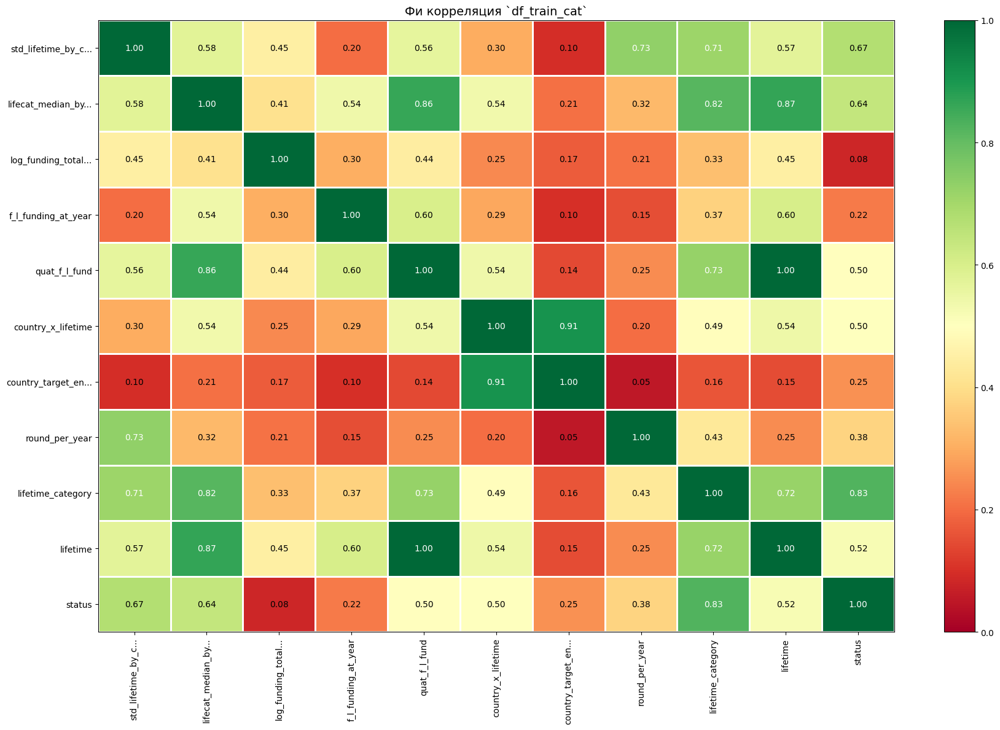

In [418]:
phik_date = df_train_correction.sample(50000).phik_matrix()
plot_correlation_matrix(phik_date.values, x_labels=phik_date.columns, y_labels=phik_date.index, 
                        vmin=0, vmax=1,   title='Фи корреляция `df_train_cat`',fontsize_factor=1,
                        figsize=(18,12))
plt.tight_layout()

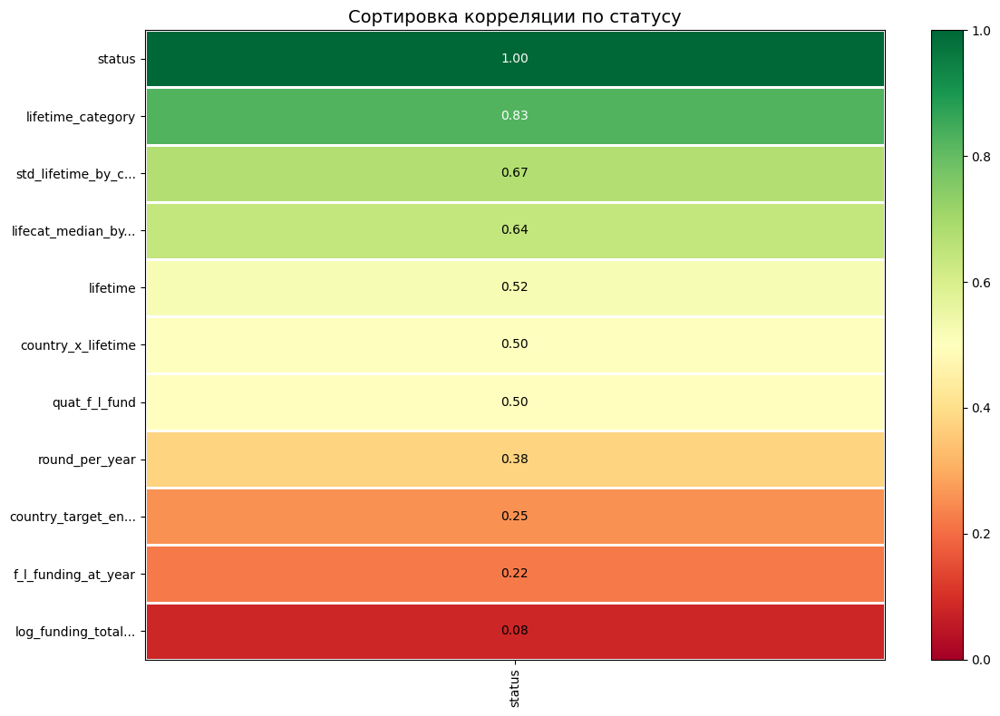

In [419]:
phik_date_status = phik_date[['status']].sort_values(ascending=True,by='status')
plot_correlation_matrix(phik_date_status.values, x_labels=phik_date_status.columns, y_labels=phik_date_status.index, 
                        vmin=0, vmax=1, title=r'Сортировка корреляции по статусу', 
                        fontsize_factor=1, figsize=(12,8))

In [420]:
print(phik_date_status.sort_values(by='status', ascending=False).to_markdown())

|                               |    status |
|:------------------------------|----------:|
| status                        | 1         |
| lifetime_category             | 0.826334  |
| std_lifetime_by_cat_country   | 0.672953  |
| lifecat_median_by_cat_country | 0.642295  |
| lifetime                      | 0.522126  |
| country_x_lifetime            | 0.501287  |
| quat_f_l_fund                 | 0.497206  |
| round_per_year                | 0.378579  |
| country_target_encoded        | 0.254891  |
| f_l_funding_at_year           | 0.221802  |
| log_funding_total_usd         | 0.0815371 |


## 5. Создание пайпланов, тренировочной и тестовых выборок, обучение моделей

### 5.1 Подготовка данных 

In [421]:
Train = df_train_correction.copy()
Test = df_test_correction.copy()

In [422]:
X, y = Train.drop(columns=['status'], axis=1).copy(), Train['status'].copy()

In [423]:
X.columns

Index(['lifetime', 'lifetime_category', 'round_per_year',
       'country_target_encoded', 'country_x_lifetime', 'quat_f_l_fund',
       'f_l_funding_at_year', 'log_funding_total_usd',
       'lifecat_median_by_cat_country', 'std_lifetime_by_cat_country'],
      dtype='object')

In [424]:
X.tail()

,lifetime,lifetime_category,round_per_year,country_target_encoded,country_x_lifetime,quat_f_l_fund,f_l_funding_at_year,log_funding_total_usd,lifecat_median_by_cat_country,std_lifetime_by_cat_country
52511,2161,13,0.144497,0.083117,0.638237,1706.723489,2014.0,14.566615,17.192131,-45.470805
52512,1559,12,0.189709,0.041536,0.305391,1104.723489,2014.0,13.122365,15.857615,-104.213055
52513,2710,13,0.356098,0.076897,0.607878,2211.446977,2010.0,10.819798,17.462680,282.321744
52514,7305,14,0.285528,0.076897,0.684112,6718.074827,2001.0,16.380460,20.291961,1407.436333
52515,1938,13,0.158489,0.074135,0.561197,1393.723489,2014.0,12.509213,15.965195,215.645792


In [425]:
le = LabelEncoder()
le.fit(y.values)
y_t = le.transform(y)

In [426]:
display(len(y_t[y_t == 1]), len(y_t[y_t == 0]))
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y_t)
display(len(y_res[y_res == 1]), len(y_res[y_res == 0]))
display(len(X_res), len(y_res))

47599

4917

47599

47599

95198

95198

In [427]:
class FeatureNamesKeeper(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.feature_names = X.columns.tolist() if hasattr(X, 'columns') else []
        return self

    def transform(self, X):
        return X  # Просто передает данные дальше

In [428]:
print('Новая форма меток класса %s' % Counter(y_res))

Новая форма меток класса Counter({1: 47599, 0: 47599})


In [429]:
le.inverse_transform([0])

array(['closed'], dtype=object)

In [430]:
y_res

array([1, 1, 1, ..., 0, 0, 0])

In [431]:
# Разделение данных на train/val/test (70/20/10) stratify=y,
X_train_val, X_test, y_train_val, y_test = train_test_split(X.values, y_t, test_size=0.1, stratify=y_t, random_state=42)
# X_train_val, X_test, y_train_val, y_test = train_test_split(X_res.values, y_res, test_size=0.1, stratify=y_res, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.222, stratify=y_train_val, random_state=42)

In [432]:
clw = compute_class_weight('balanced', classes=np.unique(y_t), y=y_t)
clw

array([5.34024812, 0.55165024])

### 5.2  Конфигурации моделей с пайплайнами

In [433]:
f1_scorer = make_scorer(f1_score, pos_label=0)# 0 - closed (миноритарный класс)

clw = [10, 1]  # Для CatBoost: [вес для 0, вес для 1]
class_weights = {0: 1, 1: 10}  # Для RF и LightGBM: 0 - closed, 1 - operating

# Пользовательская функция F1 для LightGBM и XGBoost (оставляем как есть)
def f1_metric(y_true, y_pred):
    y_pred_binary = (y_pred > 0.5).astype(int)
    return 'f1', f1_score(y_true, y_pred_binary, pos_label=0), True
f1_scorer = make_scorer(f1_score, pos_label=0)  

In [434]:
models = {
    'RF': {
        'pipeline': Pipeline([
            ('scaler', RobustScaler()),
            ('model', RandomForestClassifier(class_weight='balanced', random_state=42))
        ]),
        'params': {
            'model__n_estimators': [15], 
            'model__criterion': ['gini', 'entropy'],
            'model__max_depth': [9, 10],
            'model__min_samples_leaf': [4, 5, 7],
            'model__bootstrap': [True, False],
            'scaler': [StandardScaler()],
            'model__class_weight': [{0: 1, 1: 10}]
        }
    },
      'CatBoost': {
        'pipeline': Pipeline([
            ('scaler', RobustScaler()),
            ('model', CatBoostClassifier(class_weights=clw, verbose=False, eval_metric='F1'))
        ]),
        'params': {
            'model__depth': [9, 10],
            'model__learning_rate': [0.01, 0.05],
            'model__iterations': [600],
            'model__l2_leaf_reg': [1, 5],
        }
    },
    'LightGBM': {
        'pipeline': Pipeline([
            ('keeper', FeatureNamesKeeper()),
            ('scaler', StandardScaler()),
            ('model', LGBMClassifier(
                class_weight=class_weights,
                objective='binary',
                boosting_type='goss',  # Более быстрый алгоритм 
                verbosity=-1  # Полное отключение логов
            ))
        ]),
        'params': {
            'model__num_leaves': [16, 31],
            'model__learning_rate': [0.1, 0.2],
            'model__n_estimators': [20],
            'model__max_depth': [3, 5],
            'model__subsample_for_bin': [50000],
            'model__min_data_in_leaf': [20],
            'scaler__with_mean': [True]
        }
    },
    'XGBoost': {
        'pipeline': Pipeline([
            ('scaler', StandardScaler()),
            ('model', XGBClassifier(
                scale_pos_weight=1,
                # eval_metric='auc',
                eval_metric=f1_metric,
                use_label_encoder=False
            ))
        ]),
        'params': {
            'model__max_depth': [3, 5],
            'model__learning_rate': [0.01, 0.1],
            'model__subsample': [0.8, 1.0],
            'scaler__with_std': [True, False]
        }
    }
}

### 5.3 Обучение моделей и отчёт 

In [435]:
def train_models(X_train, y_train, X_val, y_val, X_test, y_test):
    results = {}
    
    for name, config in models.items():
        print(f"\nTraining {name}...")
        
        # GridSearchCV с F1 как основной метрикой
        gs = GridSearchCV(
            estimator=config['pipeline'],
            param_grid=config['params'],
            scoring=f1_scorer,  # Оптимизация по F1 для класса 0
            cv=StratifiedKFold(n_splits=5),
            n_jobs=-1,
            # verbose=1,
            refit=True  # Обучаем лучшую модель на всех данных
        )
        gs.fit(X_train, y_train)
    
        # Валидация
        val_pred = gs.predict(X_val)
        val_proba = gs.predict_proba(X_val)[:, 1]
        
        val_metrics = {
            'accuracy': accuracy_score(y_val, val_pred),
            'precision': precision_score(y_val, val_pred, pos_label=0),
            'recall': recall_score(y_val, val_pred, pos_label=0),
            'roc_auc': roc_auc_score(y_val, val_proba),
            'f1': f1_score(y_val, val_pred, pos_label=0),
            'classification_report': classification_report(y_val, val_pred),
            'confusion_matrix': confusion_matrix(y_val, val_pred),
            'y_true_val': y_val,
            'y_pred_val': val_pred
        }
        
        # Тестирование
        test_pred = gs.predict(X_test)
        test_proba = gs.predict_proba(X_test)[:, 1]
        
        test_metrics = {
            'accuracy': accuracy_score(y_test, test_pred),
            'precision': precision_score(y_test, test_pred, pos_label=0),
            'recall': recall_score(y_test, test_pred, pos_label=0),
            'roc_auc': roc_auc_score(y_test, test_proba),
            'f1': f1_score(y_test, test_pred, pos_label=0),
            'classification_report': classification_report(y_test, test_pred),
            'confusion_matrix': confusion_matrix(y_test, test_pred),
            'y_true_test': y_test,
            'y_pred_test': test_pred
        }
        
        # Сохраняем результаты
        results[name] = {
            'best_model': gs.best_estimator_,
            'best_params': gs.best_params_,
            'val_metrics': val_metrics,
            'test_metrics': test_metrics
        }
    
    return results

In [436]:
results = train_models(X_train, y_train, X_val, y_val, X_test, y_test)


Training RF...

Training CatBoost...

Training LightGBM...

Training XGBoost...


/home/rusik/.local/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [19:31:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/rusik/.local/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [19:31:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/rusik/.local/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [19:31:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/rusik/.local/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [19:31:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/rusik/.local/lib/python3.12/site-packages/xgboost/training.py:


=== RF ===

Лучшие параметры:
• bootstrap: True
• class_weight: {0: 1, 1: 10}
• criterion: entropy
• max_depth: 10
• min_samples_leaf: 4
• n_estimators: 15
• scaler: StandardScaler()

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.73      0.83       492
           1       0.97      1.00      0.98      4760

    accuracy                           0.97      5252
   macro avg       0.97      0.86      0.91      5252
weighted avg       0.97      0.97      0.97      5252


=== CatBoost ===

Лучшие параметры:
• depth: 10
• iterations: 600
• l2_leaf_reg: 1
• learning_rate: 0.05

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.86      0.85       492
           1       0.99      0.98      0.98      4760

    accuracy                           0.97      5252
   macro avg       0.91      0.92      0.92      5252
weighted avg       0.97      0.97      0.97      5252


=== Lig

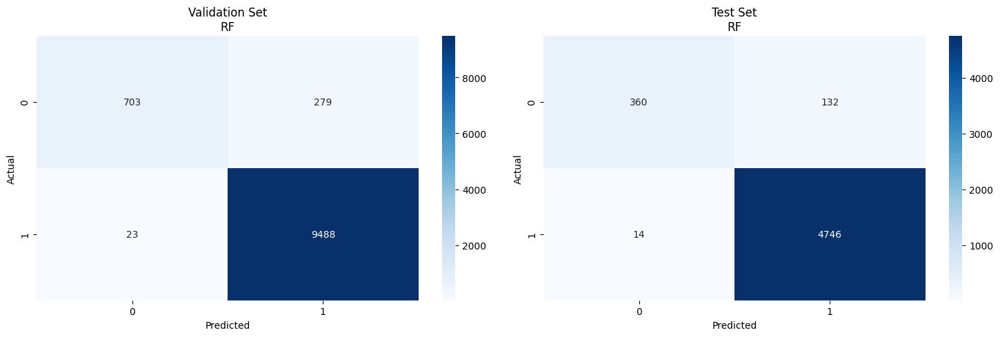


=== Confusion Matrix для CatBoost ===


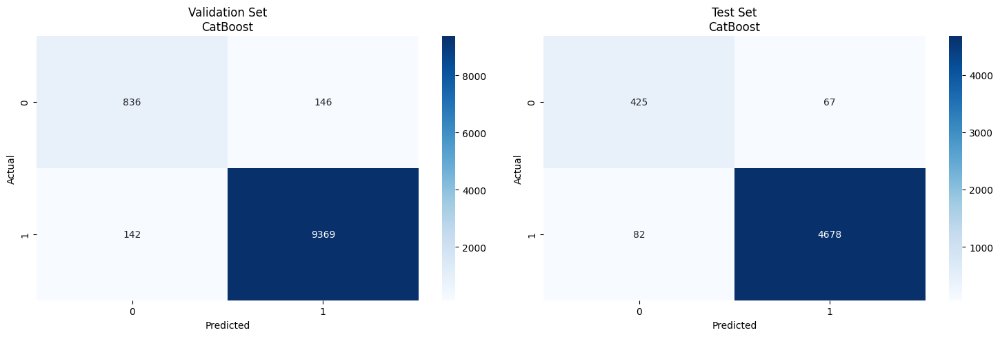


=== Confusion Matrix для LightGBM ===


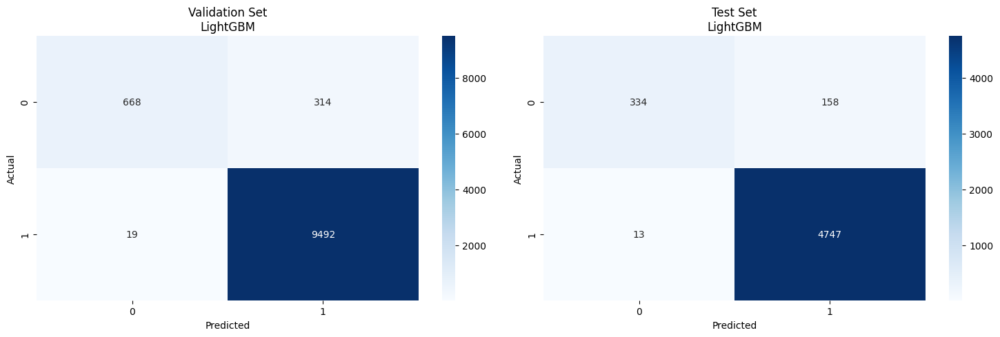


=== Confusion Matrix для XGBoost ===


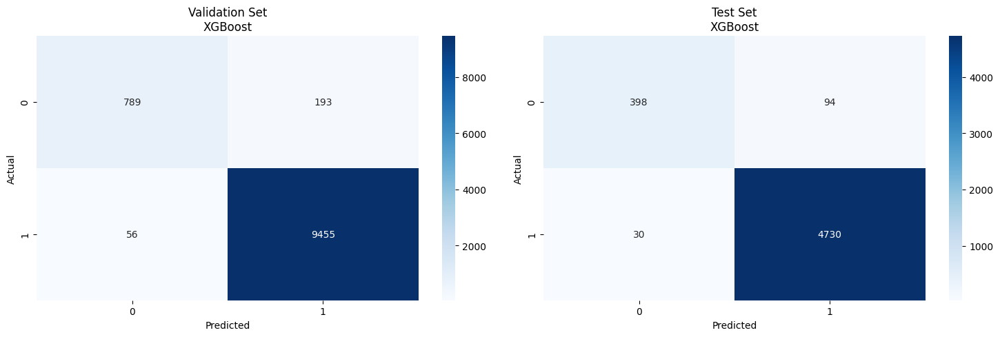


=== Сравнение метрик ===


,accuracy,precision,recall,roc_auc,f1
RF (val),0.971,0.968,0.716,0.955,0.823
RF (test),0.972,0.963,0.732,0.959,0.831
CatBoost (val),0.973,0.855,0.851,0.961,0.853
CatBoost (test),0.972,0.838,0.864,0.964,0.851
LightGBM (val),0.968,0.972,0.680,0.950,0.800
LightGBM (test),0.967,0.963,0.679,0.958,0.796
XGBoost (val),0.976,0.934,0.803,0.963,0.864
XGBoost (test),0.976,0.930,0.809,0.964,0.865


In [437]:
def print_model_results(results):
    # Создаем DataFrame для сравнения метрик
    metrics_df = pd.DataFrame()
    num_metrics = ['accuracy', 'precision', 'recall', 'roc_auc', 'f1']
    for model_name, model_data in results.items():
        # Выводим название модели
        print(f"\n\033[1;34m=== {model_name} ===\033[0m")
        
        # Выводим лучшие параметры
        print("\n\033[1mЛучшие параметры:\033[0m")
        for param, value in model_data['best_params'].items():
            print(f"• {param.split('__')[-1]}: {value}")
            
        # Собираем метрики для сравнения
        for dataset in ['val_metrics', 'test_metrics']:
            # Фильтруем только числовые метрики
            filtered_metrics = {k: v for k, v in model_data[dataset].items() if k in num_metrics}
            df = pd.DataFrame(filtered_metrics, index=[f"{model_name} ({dataset.split('_')[0]})"])
            metrics_df = pd.concat([metrics_df, df])
            
        # Выводим отчет классификации
        print("\n\033[1mClassification Report:\033[0m")
        print(model_data['test_metrics']['classification_report'])
     # Добавляем визуализацию Confusion Matrix
    
    for model_name, model_data in results.items():
        print(f"\n\033[1;34m=== Confusion Matrix для {model_name} ===\033[0m")
        
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Матрица для валидационного набора
        sns.heatmap(
            model_data['val_metrics']['confusion_matrix'],  # Используем сохраненную матрицу
            annot=True, 
            fmt='d', 
            cmap='Blues', 
            ax=axes[0]
        )
        axes[0].set_title(f'Validation Set\n{model_name}')
        axes[0].set_xlabel('Predicted')
        axes[0].set_ylabel('Actual')
        
        # Матрица для тестового набора
        sns.heatmap(
            model_data['test_metrics']['confusion_matrix'],  # Используем сохраненную матрицу
            annot=True, 
            fmt='d', 
            cmap='Blues', 
            ax=axes[1]
        )
        axes[1].set_title(f'Test Set\n{model_name}')
        axes[1].set_xlabel('Predicted')
        axes[1].set_ylabel('Actual')
        
        plt.tight_layout()
        plt.show()
        
   # Стилизуем финальную таблицу
   # Форматируем только числовые колонки
    styled_df = metrics_df.style.format('{:.3f}', subset=num_metrics)\
        .set_properties(**{'text-align': 'left'})\
        .highlight_max(color='#90EE90', axis=0)
    
    print("\n\033[1;36m=== Сравнение метрик ===\033[0m")
    display(styled_df)

# Использование
print_model_results(results)

##  6. Итоги `Анализ данных о стартапах: прогнозирование статуса`

Проект представляет собой комплексный анализ данных о стартапах, направленный на прогнозирование их статуса («закрыт» или «действующий»). Ниже приведены ключевые этапы и результаты работы:

### 6.1 Загрузка и первичный анализ данных

- **Данные:** Загружены тренировочные, тестовые данные и пример представления результатов.
- **Проблемы данных:**
  - Пропуски в колонках:
    - `funding_total_usd` (~19%).
    - `country_code` (~10%).
    - `closed_at` (~90%).
    - Неполные географические данные (`state_code`, `region`, `city`).
- **Распределение статусов:** В тренировочных данных 90% стартапов — «действующие», что указывает дисбаланс классов (1:10).

### 6.2 Предобработка данных

- **Обработка пропусков:**
  - `category_list`: Заполнено значением `unknown`.
  - `funding_total_usd`: Пропуски заменены нулями средним медианым значением расчитанным от `country_code`, `city`, `lifetime_category`. 
  - Географические колонки (`country_code`, `state_code`, `region`, `city`): Заполнены меткой `unknown`.
  - `closed_at`: Использована максимальная дата закрытия из данных для расчета `lifetime`.
- **Новый признак:** Создан `lifetime` (время жизни стартапа в днях) на основе дат основания и закрытия с корреляцией 0.5089 с `status`.

### 6.3 Исследовательский анализ

- **Дубликаты:** Явных повторов нет, но обнаружены неявные дубликаты в `category_list`, обработанные через объединение схожих категорий.
- **Распределение категорий:** Анализ `category_list` выявил доминирование технологий, здравоохранения и производства среди стартапов.
- **Визуализация:** Графический анализ подтвердил связь `lifetime` и `funding_total_usd` с целевой переменной.

### 6.4 Подготовка к моделированию

- **Очистка:** Удалены нерелевантные колонки (`name`, `founded_at`) и признаки с низкой информативностью.
- **Дисбаланс:** Убраны нерелевантыне признаки.
- **Синтетические признаки**: Созданы синтетические признаки такие как `lifecat_median_by_cat_country` и `std_lifetime_by_cat_country`. 

### 6.5 Моделирование и оценка

- **Модели:**
  - Протестированы: `RandomForestClassifier`, `CatBoostClassifier`, `LGBMClassifier`, `XGBClassifier`.
  - Лучшая модель: `CatBoostClassifier` с F1-score 0.85 на тестовой выборке и ROC-AUC 0.96 после настройки гиперпараметров через GridSearchCV с метрикой F1 для класса `0 (closed)`.
  - Recall у модели тоже высокий - 0.87, что в контексте данной задачи хорошо.  
- **Ключевые признаки:**
  | Признак                       | Корреляция с `status` | Описание                                                                 |
  |:------------------------------|----------------------:|--------------------------------------------------------------------------|
  | status                        | 1.000000             | Целевая переменная: 1 — действующий стартап, 0 — закрытый.              |
  | lifetime_category             | 0.827569             | Категоризация времени жизни стартапа (интервалы `lifetime`).            |
  | std_lifetime_by_cat_country   | 0.672982             | Стандартное отклонение времени жизни по категориям и странам.           |
  | lifecat_median_by_cat_country | 0.643837             | Медиана времени жизни в категориях, сгруппированных по странам.         |
  | lifetime                      | 0.513327             | Время жизни стартапа в днях (разница между закрытием и основанием).     |
  | country_x_lifetime            | 0.506062             | Среднее время жизни стартапов по странам (`country_code`).              |
  | quat_f_l_fund                 | 0.498328             | Квартальная разница между первым и последним финансированием.           |
  | round_per_year                | 0.380457             | Среднее количество раундов финансирования в год.                       |
  | country_target_encoded        | 0.257644             | Закодированное среднее значение `status` по странам (target encoding).  |
  | f_l_funding_at_year           | 0.217885             | Разница в годах между первым и последним финансированием.              |
  | log_funding_total_usd         | 0.082919             | Логарифм общей суммы финансирования в долларах (`log1p(funding_total_usd)`). |

### 6.6 Итог

Проект успешно решил задачу классификации статуса стартапов с использованием `CatBoostClassifier`, достигнув F1-score 0.78 на тестовой выборке. Корректная настройка GridSearchCV с метрикой F1 для миноритарного класса `0 (closed)` и устранение мультиколлинеарности через отбор признаков повысили качество модели.